In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set_style("whitegrid")
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width', 200)
pd.set_option('display.colheader_justify', 'center')
pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [2]:
# Load the dataset
df = pd.read_excel('_data/_matches_list_v5.xlsx')

### DATA PREPARATION ###

In [3]:
### Encode tourney_level
order = {'A':1, 'M':2, 'F':3, 'G':4}
df['ord_tourneyLevel'] = df['tourney_level'].map(order)

### Encode court
order = {'Indoor': 0, 'Outdoor': 1}
df['is_outdoor'] = df['court'].map(order)

### One-Hot Encode surface
df = pd.get_dummies(df, columns=['surface'], prefix='surface')

# Encode draw_size
order = {8: 1, 16: 2, 28: 3, 32: 4, 48: 5, 56: 6, 64: 7, 96: 8, 128: 9}
df['ord_drawSize'] = df['draw_size'].map(order)

### Encode round
order = {'R128': 1, 'R64': 2, 'R32': 3, 'R16': 4, 'QF': 5, 'RR': 5, 'SF': 6, 'F': 7}
df['ord_round'] = df['round'].map(order)

### One-Hot Encode handedness
df = pd.get_dummies(df, columns=['handedness'], prefix='handedness')


In [4]:
# Define the target columns
target_col = 'p1_won' #ALTERABLE
target_cols = ['p1_won', 'p1_points_ratio', 'p1_games_ratio'] #'p1_Avg_implied' #ALTERABLE

# Define the feature columns
feature_cols = ['favorite_won',
                'diff_Avg_implied',
                'diff_rank', 'diff_rank_log', 'diff_rankpt', 'diff_rankpt_log',
                'diff_firstServeInRatio', 'diff_firstServeWinRatio', 'diff_secondServeWinRatio',
                'diff_overallServeWinRatio', 'diff_overallReturnWinRatio',
                'diff_completeness',
                'diff_acePerServePoint', 'diff_dfPerServePoint', 'diff_acePerServeGame', 'diff_dfPerServeGame',
                'diff_bpSaveRatio',
                'is_grandSlam', 'is_formerTop10',
                'diff_homeAdvantage',
                'diff_ht', 'diff_seed', 
                'diff_age', 'diff_agePersonalPeak', 'diff_ageGeneralPeak',
                'diff_gamesFatigue',
                'diff_rankMomentum_log', 'diff_rankptMomentum_log',
                'diff_avgDuration',
                'diff_surfaceAdvantage', 'diff_surfaceWinRatio', 'diff_overallWinRatio', 
                'diff_h2hWinRatio', 'diff_winLossStreak',
                'ord_tourneyLevel', 'is_outdoor',
                'surface_Clay', 'surface_Grass', 'surface_Hard',
                'ord_drawSize', 'ord_round',
                'handedness_L', 'handedness_LR', 'handedness_R', 'handedness_RL',
]


In [5]:
df_nunique = df[feature_cols].nunique()

# Define categorical columns
categorical_cols = df_nunique[df_nunique <= 10].index.tolist()

# Define numerical columns
numerical_cols = df_nunique[df_nunique > 10].index.tolist()

# Print categorical and numerical columns
print(categorical_cols)
print(numerical_cols)

['favorite_won', 'is_grandSlam', 'is_formerTop10', 'diff_homeAdvantage', 'diff_surfaceAdvantage', 'ord_tourneyLevel', 'is_outdoor', 'surface_Clay', 'surface_Grass', 'surface_Hard', 'ord_drawSize', 'ord_round', 'handedness_L', 'handedness_LR', 'handedness_R', 'handedness_RL']
['diff_Avg_implied', 'diff_rank', 'diff_rank_log', 'diff_rankpt', 'diff_rankpt_log', 'diff_firstServeInRatio', 'diff_firstServeWinRatio', 'diff_secondServeWinRatio', 'diff_overallServeWinRatio', 'diff_overallReturnWinRatio', 'diff_completeness', 'diff_acePerServePoint', 'diff_dfPerServePoint', 'diff_acePerServeGame', 'diff_dfPerServeGame', 'diff_bpSaveRatio', 'diff_ht', 'diff_seed', 'diff_age', 'diff_agePersonalPeak', 'diff_ageGeneralPeak', 'diff_gamesFatigue', 'diff_rankMomentum_log', 'diff_rankptMomentum_log', 'diff_avgDuration', 'diff_surfaceWinRatio', 'diff_overallWinRatio', 'diff_h2hWinRatio', 'diff_winLossStreak']


### EXPLORATORY DATA ANALYSIS ###

##### Data Summary ######

In [6]:
# Define a function to summarize the dataframe
def check_df(df):
    print("="*30 + " Shape " + "="*30)
    print(df.shape)
    print("\n" + "="*30 + " Unique Values " + "="*30)
    print(df.nunique())
    print("\n" + "="*30 + " Info " + "="*30)
    print(df.info())
    print("\n" + "="*30 + " Duplicated " + "="*30)
    print(df.duplicated().sum())
    print("\n" + "="*30 + " Missing " + "="*30)
    display(pd.DataFrame(df.isnull().sum(), columns=['Missing']).sort_values(by='Missing', ascending=False))
    print("\n" + "="*30 + " Describe " + "="*30)
    display(df.describe().transpose())
    print("\n" + "="*30 + " Quantiles " + "="*30)
    try:
        display(df.quantile([0.00, 0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99, 1.00]).transpose())
    except:
        pass

check_df(df[feature_cols])

============================== Shape ==============================
(34121, 45)

============================== Unique Values ==============================
favorite_won                      2
diff_Avg_implied              27552
diff_rank                      1317
diff_rank_log                  1316
diff_rankpt                    8418
diff_rankpt_log                8418
diff_firstServeInRatio        32850
diff_firstServeWinRatio       27991
diff_secondServeWinRatio      28496
diff_overallServeWinRatio     27479
diff_overallReturnWinRatio    27479
diff_completeness             29214
diff_acePerServePoint         32809
diff_dfPerServePoint          29486
diff_acePerServeGame          33184
diff_dfPerServeGame           28832
diff_bpSaveRatio              28263
is_grandSlam                      2
is_formerTop10                    2
diff_homeAdvantage                3
diff_ht                          72
diff_seed                       190
diff_age                        729
diff_agePersona

,Missing
favorite_won,0
diff_agePersonalPeak,0
diff_gamesFatigue,0
diff_rankMomentum_log,0
diff_rankptMomentum_log,0
diff_avgDuration,0
diff_surfaceAdvantage,0
diff_surfaceWinRatio,0
diff_overallWinRatio,0
diff_h2hWinRatio,0



============================== Describe ==============================


,count,mean,std,min,25%,50%,75%,max
favorite_won,34121.00,0.66,0.47,0.00,0.00,1.00,1.00,1.00
diff_Avg_implied,34121.00,0.00,0.45,-0.97,-0.35,0.01,0.35,0.97
diff_rank,34121.00,-0.85,165.68,-2194.00,-40.00,-1.00,39.00,2191.00
diff_rank_log,34121.00,-0.01,1.64,-3.34,-1.60,0.00,1.59,3.34
diff_rankpt,34121.00,-7.89,2612.37,-16641.00,-653.00,3.00,647.00,16143.00
diff_rankpt_log,34121.00,0.01,2.86,-4.22,-2.82,0.60,2.81,4.21
diff_firstServeInRatio,34121.00,-0.00,0.06,-0.30,-0.04,0.00,0.04,0.26
diff_firstServeWinRatio,34121.00,0.00,0.06,-0.30,-0.03,0.00,0.03,0.29
diff_secondServeWinRatio,34121.00,-0.00,0.05,-0.30,-0.03,0.00,0.03,0.31
diff_overallServeWinRatio,34121.00,0.00,0.05,-0.24,-0.02,0.00,0.02,0.22



============================== Quantiles ==============================


,0.00,0.01,0.05,0.10,0.25,0.50,0.75,0.90,0.95,0.99,1.00
favorite_won,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,1.00,1.00
diff_Avg_implied,-0.97,-0.87,-0.73,-0.60,-0.35,0.01,0.35,0.60,0.73,0.87,0.97
diff_rank,-2194.00,-409.80,-148.00,-91.00,-40.00,-1.00,39.00,90.00,144.00,410.00,2191.00
diff_rank_log,-3.34,-2.61,-2.17,-1.96,-1.60,0.00,1.59,1.95,2.16,2.61,3.34
diff_rankpt,-16641.00,-9185.20,-3925.00,-2025.00,-653.00,3.00,647.00,2010.00,3858.00,8986.60,16143.00
diff_rankpt_log,-4.22,-3.96,-3.59,-3.31,-2.82,0.60,2.81,3.30,3.59,3.95,4.21
diff_firstServeInRatio,-0.30,-0.13,-0.09,-0.07,-0.04,0.00,0.04,0.07,0.09,0.13,0.26
diff_firstServeWinRatio,-0.30,-0.15,-0.10,-0.07,-0.03,0.00,0.03,0.07,0.10,0.15,0.29
diff_secondServeWinRatio,-0.30,-0.13,-0.08,-0.06,-0.03,0.00,0.03,0.06,0.08,0.13,0.31
diff_overallServeWinRatio,-0.24,-0.12,-0.08,-0.06,-0.02,0.00,0.02,0.06,0.08,0.12,0.22


##### Data Correlation #####

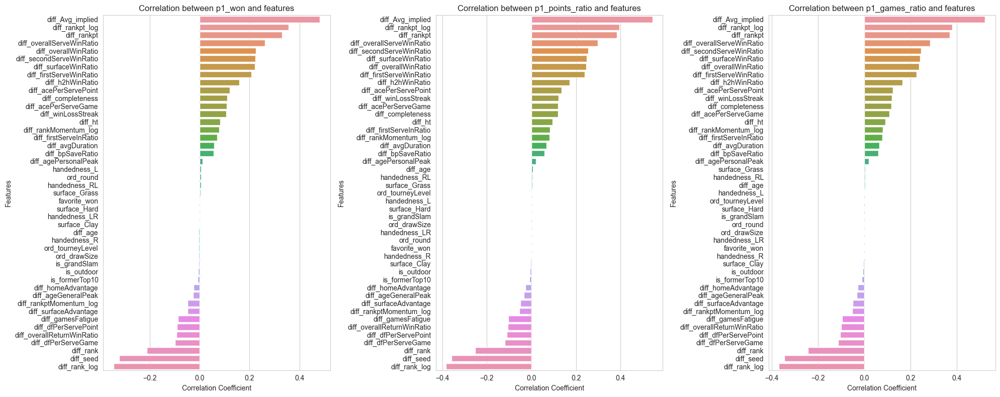

In [7]:
# Show the correlation between targets and features
fig, axes = plt.subplots(1, len(target_cols), figsize=(20, 8))

# Loop through each target column
for i, target_col in enumerate(target_cols):
    corr = df.corr().loc[target_col, feature_cols].sort_values(ascending=False)
    
    sns.barplot(x=corr, y=corr.index, ax=axes[i])
    axes[i].set_title(f'Correlation between {target_col} and features')
    axes[i].set_xlabel('Correlation Coefficient')
    axes[i].set_ylabel('Features')

plt.tight_layout()
plt.show()


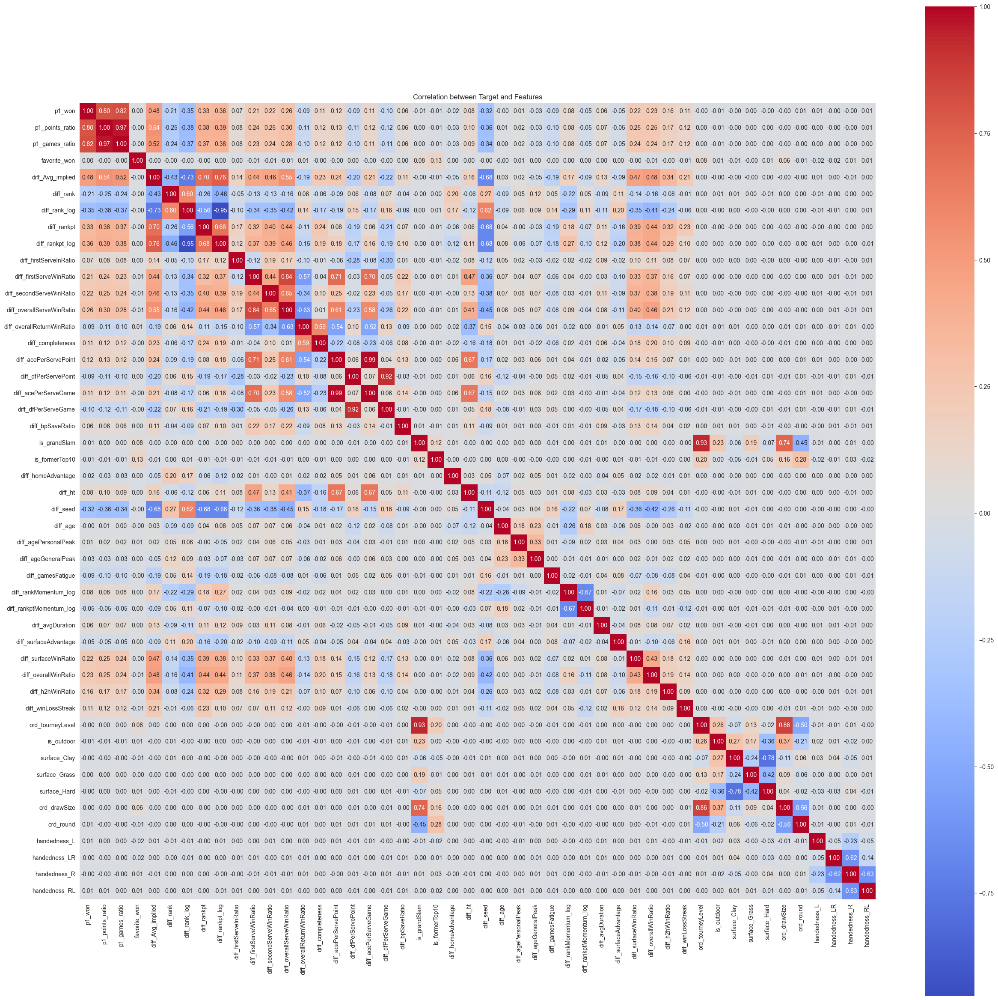

In [8]:
# Calculate the correlation matrix
corr_matrix = df[target_cols + feature_cols].corr()

# Create the heatmap to check multicollinearity
plt.figure(figsize=(30, 30))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', cbar=True, square=True, fmt='.2f')
plt.title('Correlation between Target and Features')
plt.show()


##### Data Visualization #####

In [9]:
# # Jointplot for numerical vs. numerical columns
# for numerical_col in numerical_cols:
#     for target_col in ['p1_points_ratio', 'p1_games_ratio']:
#         sns.jointplot(x=numerical_col, y=target_col, data=df, kind="hex", height=8)
#         plt.show()


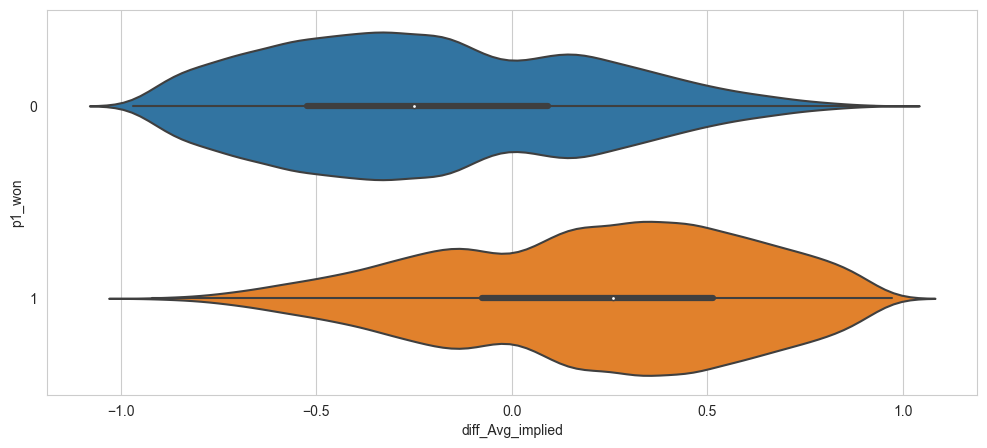

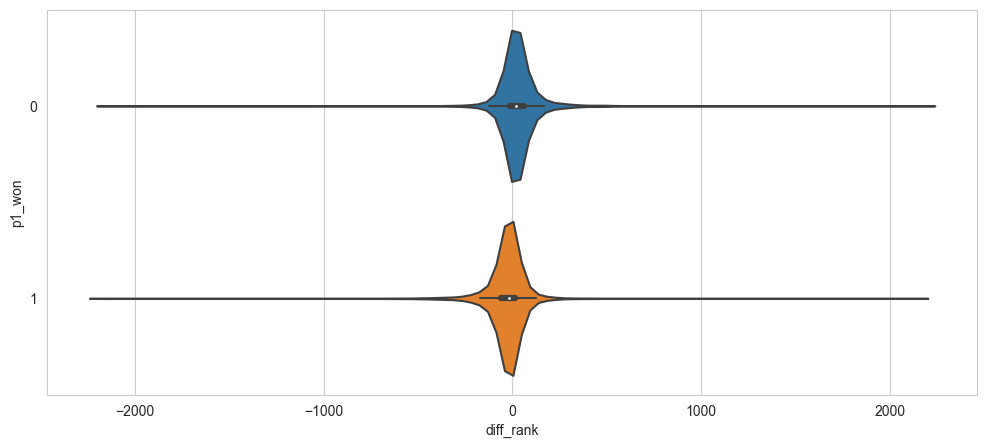

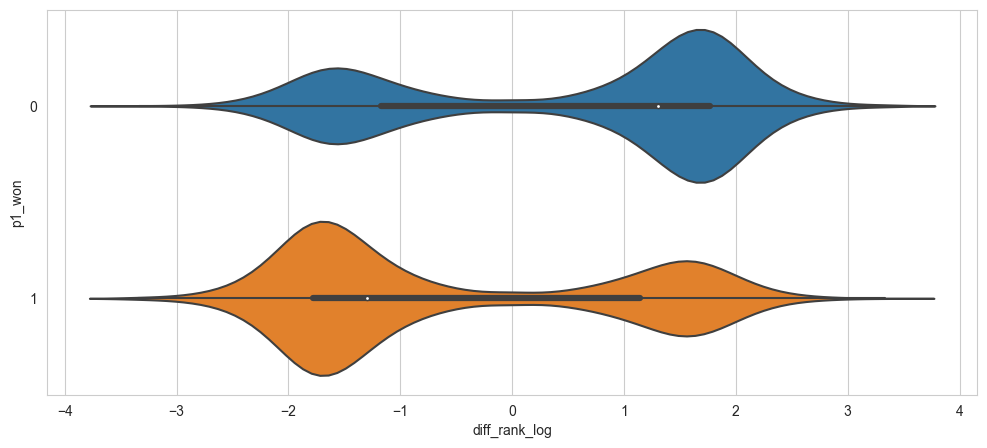

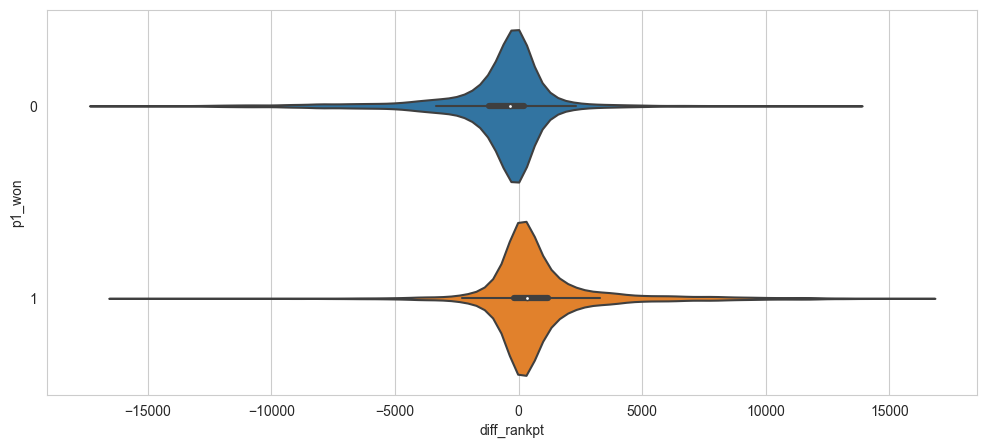

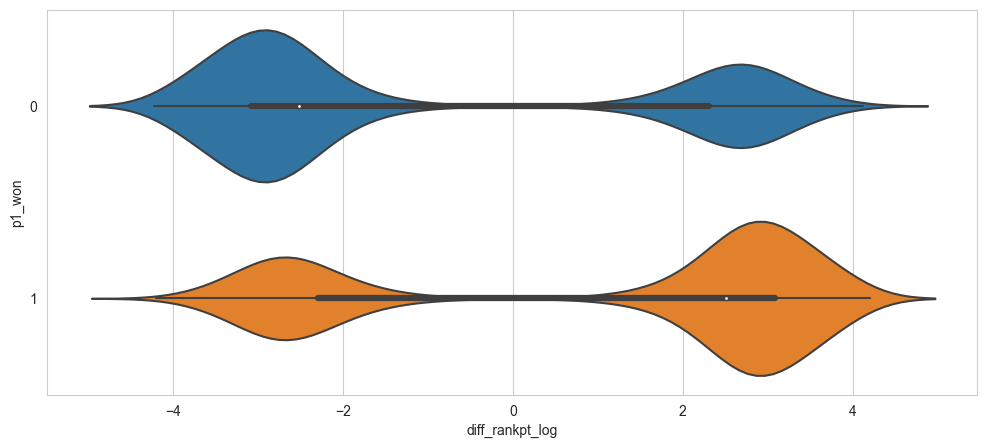

...

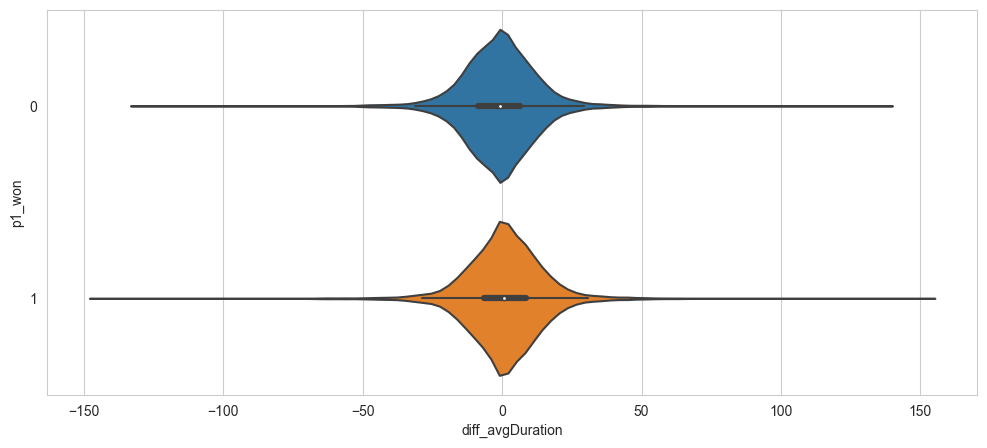

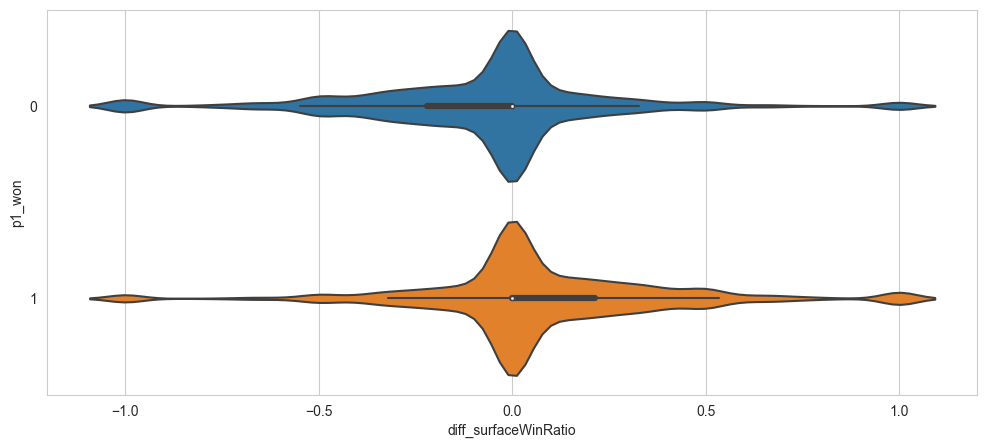

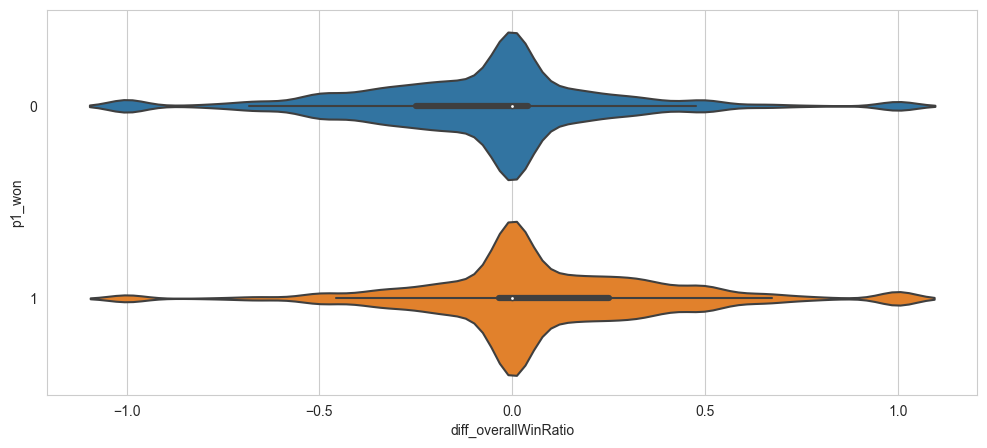

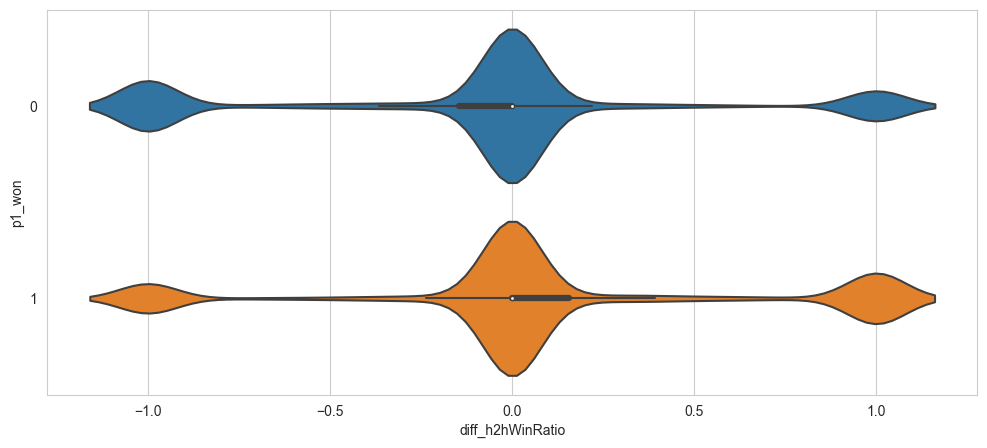

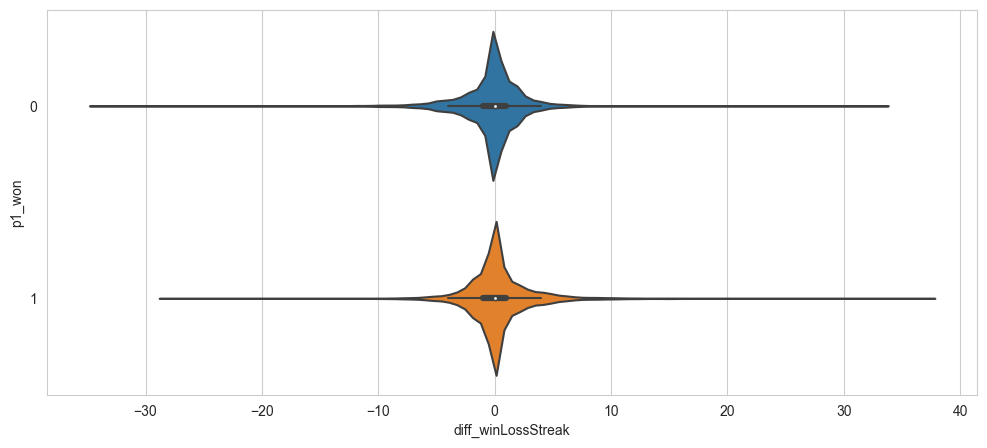

In [10]:
# Boxplot for numerical vs. categorical columns
for numerical_col in numerical_cols:
    for target_col in ['p1_won']:
        plt.figure(figsize=(12,5))
        sns.violinplot(x=numerical_col, y=target_col, data=df, orient='h')
        plt.show()
        

,is_grandSlam,is_grandSlam (%),favorite_won (%)
0,0,80.42,64.17
1,1,19.58,73.35


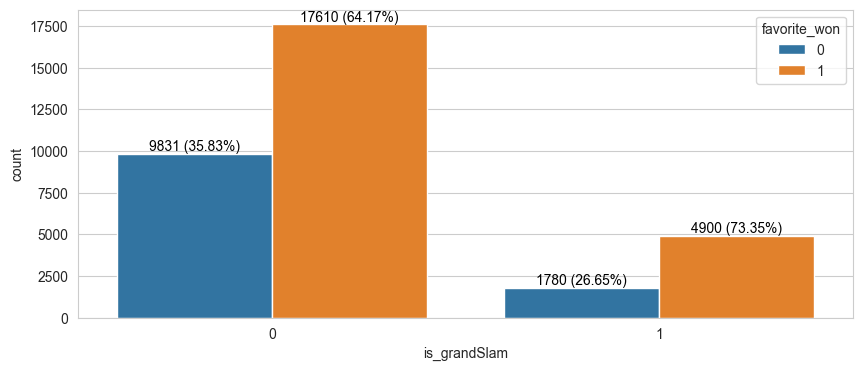

In [11]:
### Visualization for the thesis ###
# Calculate the percentages
df_cat = pd.DataFrame(df['is_grandSlam'].value_counts(normalize=True) * 100)
favorite_won_counts = df.groupby('is_grandSlam')['favorite_won'].value_counts().unstack(fill_value=0)
df_cat['favorite_won_%'] = (favorite_won_counts[1] / favorite_won_counts.sum(axis=1) * 100).fillna(0)
df_cat.reset_index(inplace=True)
df_cat.columns = ['is_grandSlam', 'is_grandSlam (%)', 'favorite_won (%)']
display(df_cat)

# Draw the bar chart
plt.figure(figsize=(10, 4))
ax = sns.countplot(x='is_grandSlam', data=df, hue='favorite_won')

# Annotate bars with count and percentage
bars = ax.patches
half = int(len(bars) / 2)
left_bars = bars[:half]
right_bars = bars[half:]

for left, right in zip(left_bars, right_bars):
    height_left = int(left.get_height())
    total = height_left + int(right.get_height())
    percentage_left = 100 * height_left / total if total else 0
    ax.annotate(f"{height_left} ({percentage_left:.2f}%)", (left.get_x() + left.get_width() / 2., height_left),
                ha='center', va='bottom', fontsize=10, color='black')
    
    height_right = int(right.get_height())
    percentage_right = 100 * height_right / total if total else 0
    ax.annotate(f"{height_right} ({percentage_right:.2f}%)", (right.get_x() + right.get_width() / 2., height_right),
                ha='center', va='bottom', fontsize=10, color='black')

plt.show()


,is_grandSlam,is_grandSlam (%),favorite_won (%)
0,0,80.42,64.17
1,1,19.58,73.35


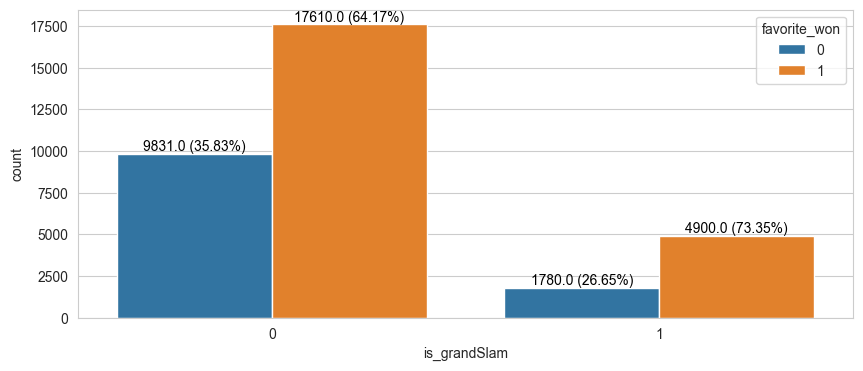

In [12]:
# Calculate the percentages
df_cat = pd.DataFrame(df['is_grandSlam'].value_counts(normalize=True) * 100)
favorite_won_counts = df.groupby('is_grandSlam')['favorite_won'].value_counts().unstack(fill_value=0)
df_cat['favorite_won_%'] = (favorite_won_counts[1] / favorite_won_counts.sum(axis=1) * 100).fillna(0)
df_cat.reset_index(inplace=True)
df_cat.columns = ['is_grandSlam', 'is_grandSlam (%)', 'favorite_won (%)']
display(df_cat)

# Draw the bar chart
plt.figure(figsize=(10, 4))
ax = sns.countplot(x='is_grandSlam', data=df, hue='favorite_won')

# Annotate bars with count and percentage
bars = ax.patches
half = int(len(bars) / 2)
left_bars = bars[:half]
right_bars = bars[half:]

for left, right in zip(left_bars, right_bars):
    height = left.get_height()
    total = height + right.get_height()
    percentage = 100 * height / total if total else 0
    ax.annotate(f"{height} ({percentage:.2f}%)", (left.get_x() + left.get_width() / 2., height),
                ha='center', va='bottom', fontsize=10, color='black')
    height = right.get_height()
    percentage = 100 * height / total if total else 0
    ax.annotate(f"{height} ({percentage:.2f}%)", (right.get_x() + right.get_width() / 2., height),
                ha='center', va='bottom', fontsize=10, color='black')

plt.show()


,favorite_won (%),favorite_won (%)
0,34.03,0.00
1,65.97,100.00


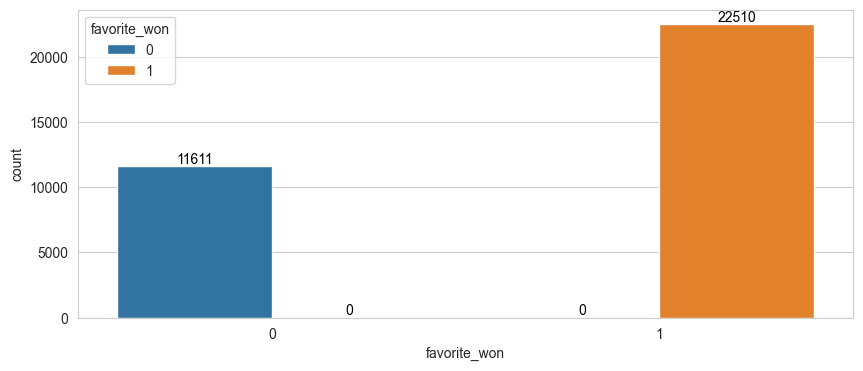

,favorite_won (%),is_grandSlam (%)
0,34.03,15.33
1,65.97,21.77


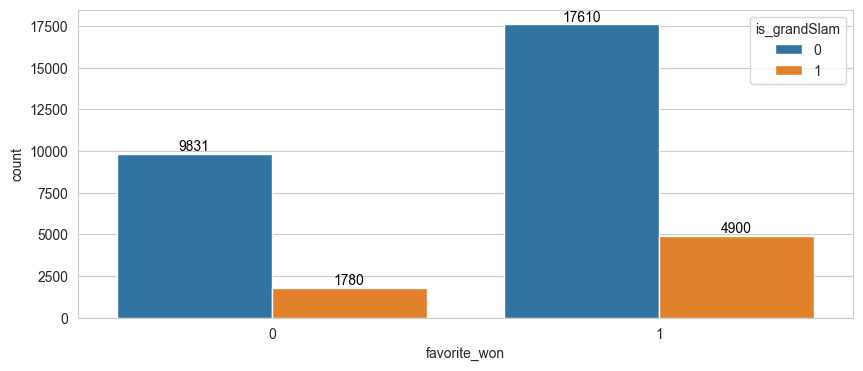

,favorite_won (%),is_formerTop10 (%)
0,34.03,11.68
1,65.97,22.72


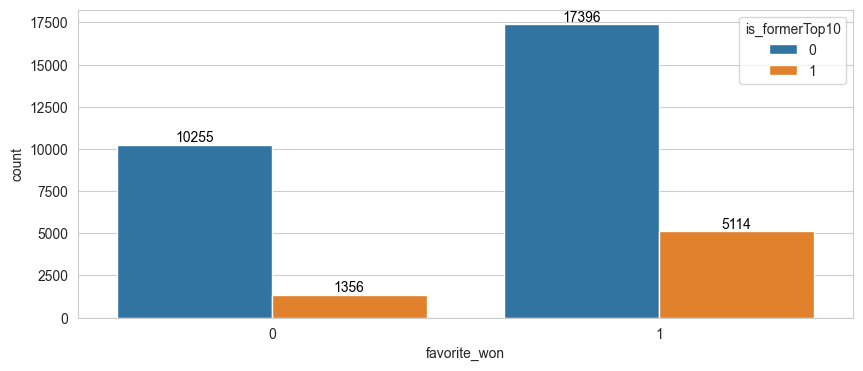

,favorite_won (%),diff_homeAdvantage (%)
0,34.03,0.01
1,65.97,0.02


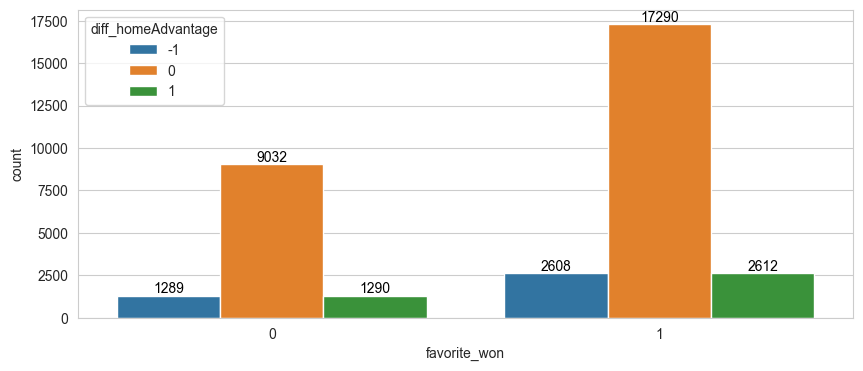

,favorite_won (%),diff_surfaceAdvantage (%)
0,34.03,0.25
1,65.97,0.48


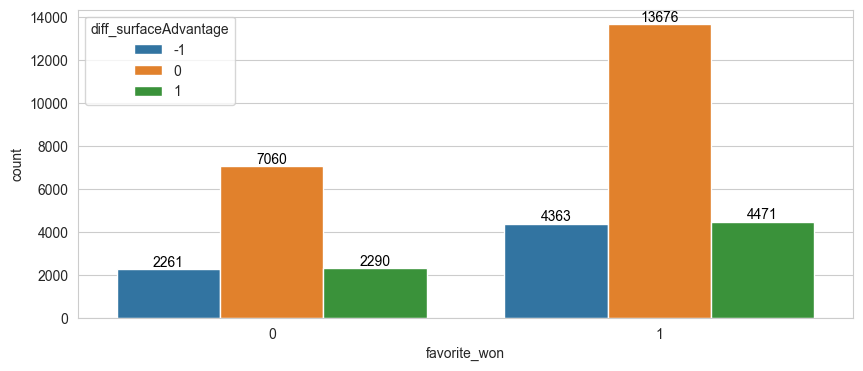

,favorite_won (%),ord_tourneyLevel (%)
0,34.03,168.08
1,65.97,187.51


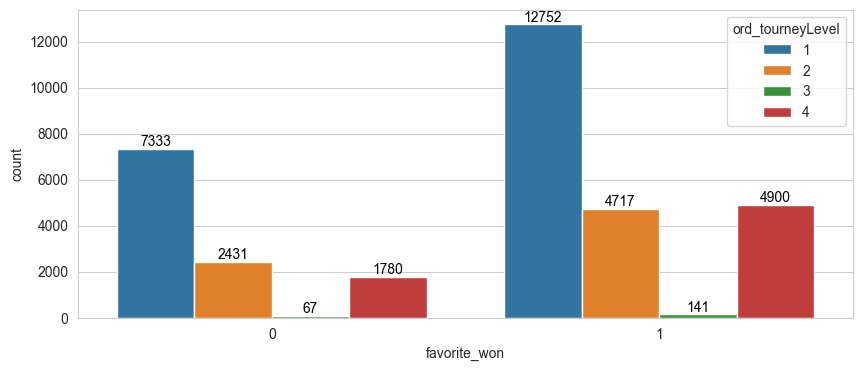

,favorite_won (%),is_outdoor (%)
0,34.03,81.41
1,65.97,82.02


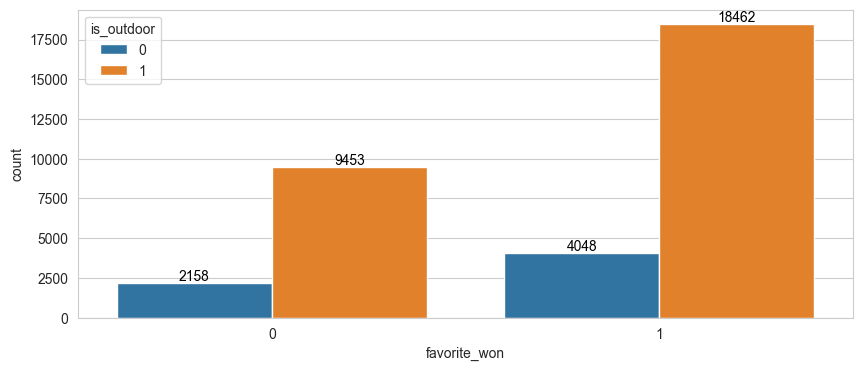

,favorite_won (%),surface_Clay (%)
0,34.03,31.87
1,65.97,30.60


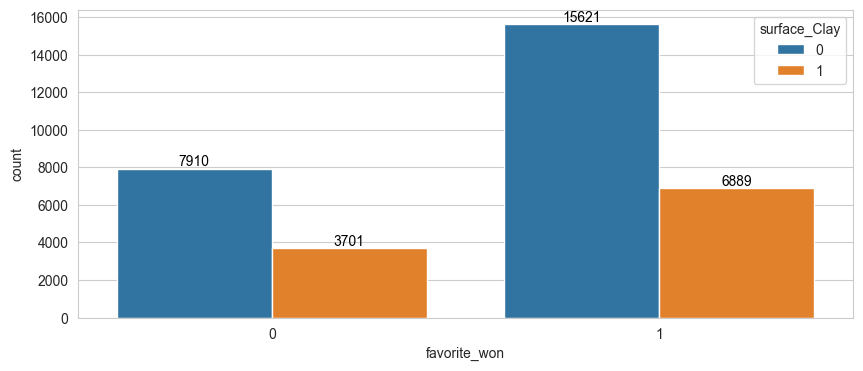

,favorite_won (%),surface_Grass (%)
0,34.03,11.40
1,65.97,11.36


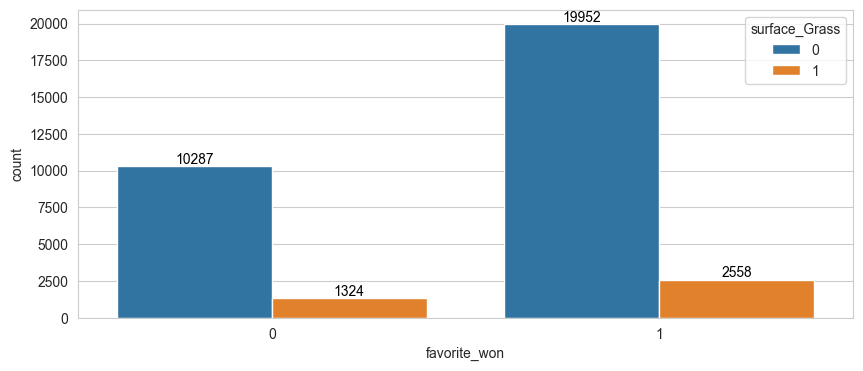

,favorite_won (%),surface_Hard (%)
0,34.03,56.72
1,65.97,58.03


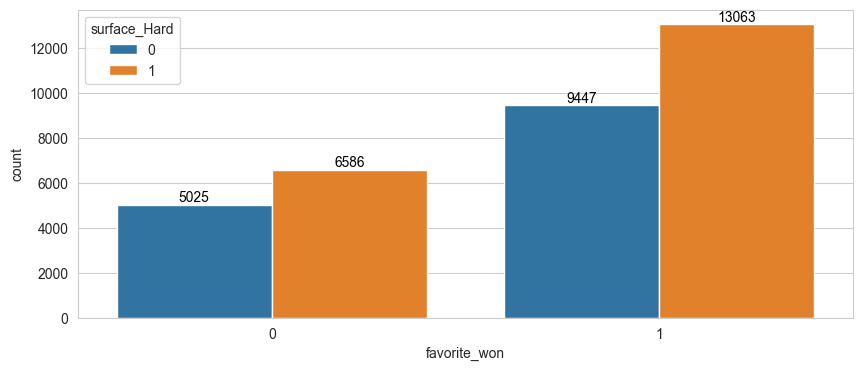

,favorite_won (%),ord_drawSize (%)
0,34.03,542.66
1,65.97,571.55


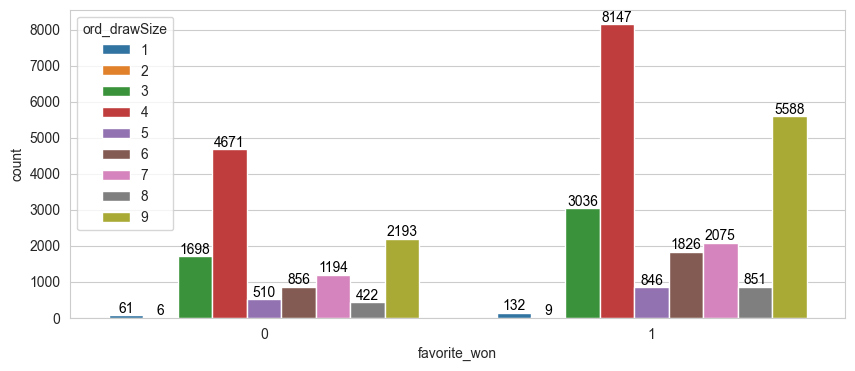

,favorite_won (%),ord_round (%)
0,34.03,327.72
1,65.97,323.35


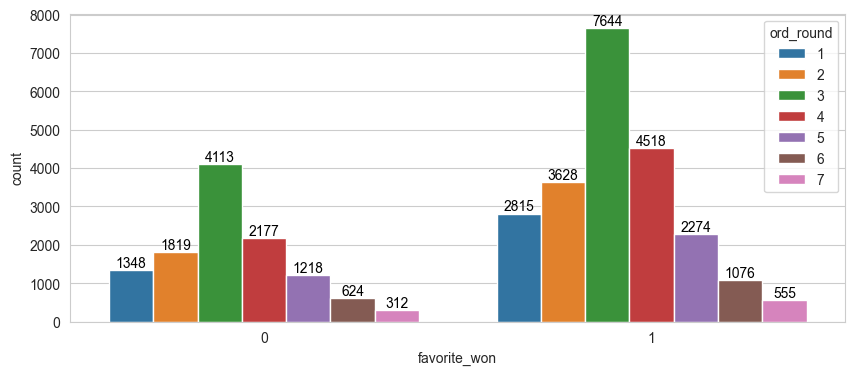

,favorite_won (%),handedness_L (%)
0,34.03,2.29
1,65.97,1.69


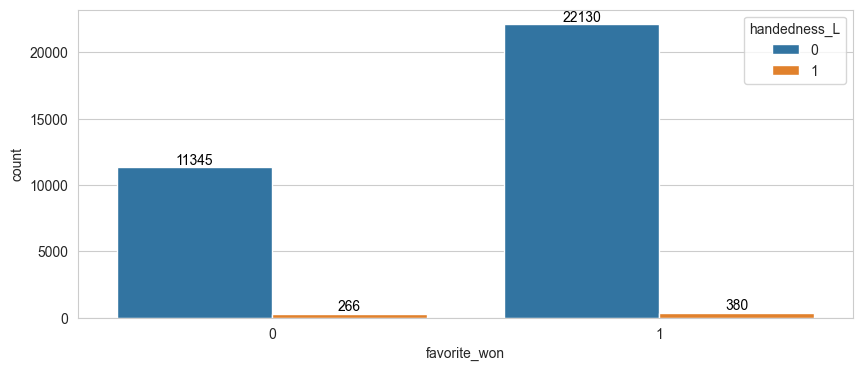

,favorite_won (%),handedness_LR (%)
0,34.03,12.45
1,65.97,11.41


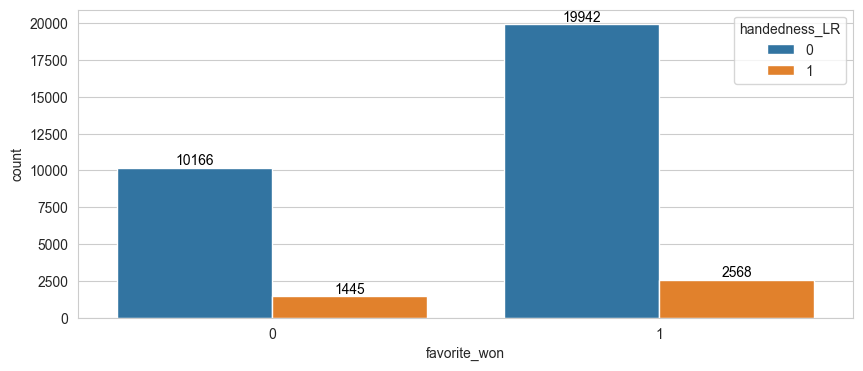

,favorite_won (%),handedness_R (%)
0,34.03,73.46
1,65.97,74.43


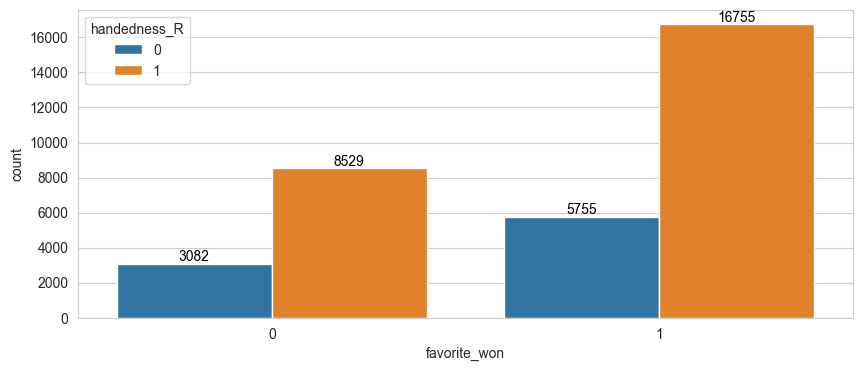

,favorite_won (%),handedness_RL (%)
0,34.03,11.81
1,65.97,12.47


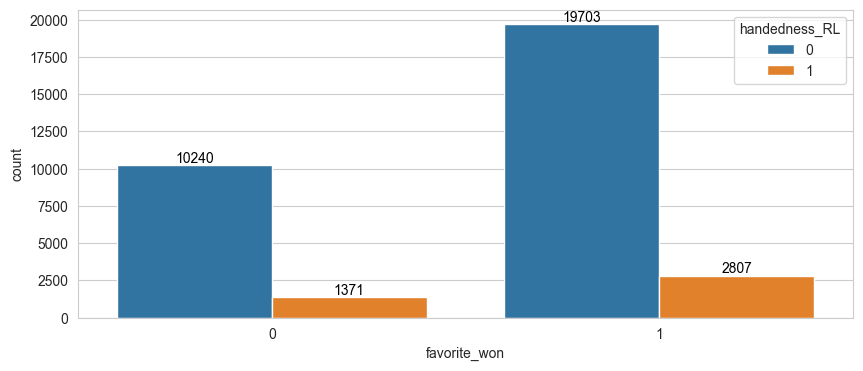

,favorite_won (%),favorite_won (%)
0,34.03,0.00
1,65.97,100.00


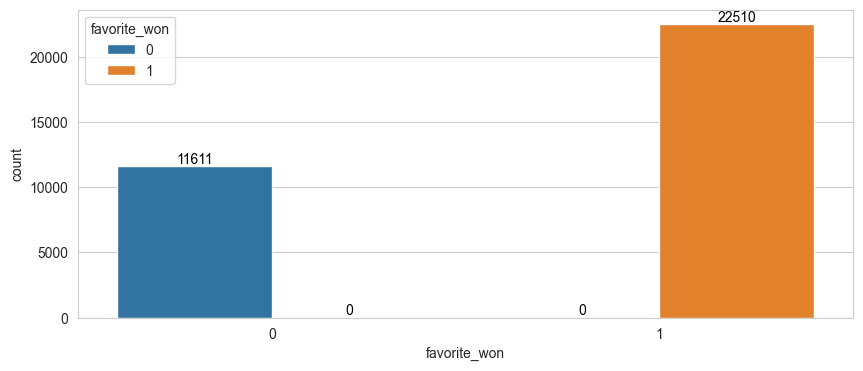

,is_grandSlam (%),favorite_won (%)
0,80.42,64.17
1,19.58,73.35


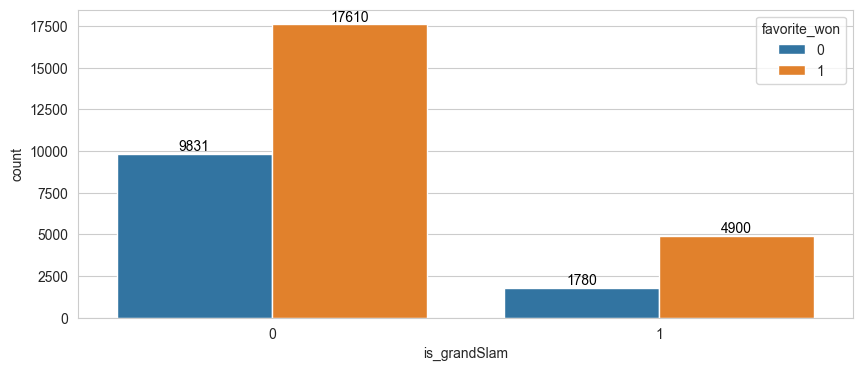

,is_grandSlam (%),is_grandSlam (%)
0,80.42,0.00
1,19.58,100.00


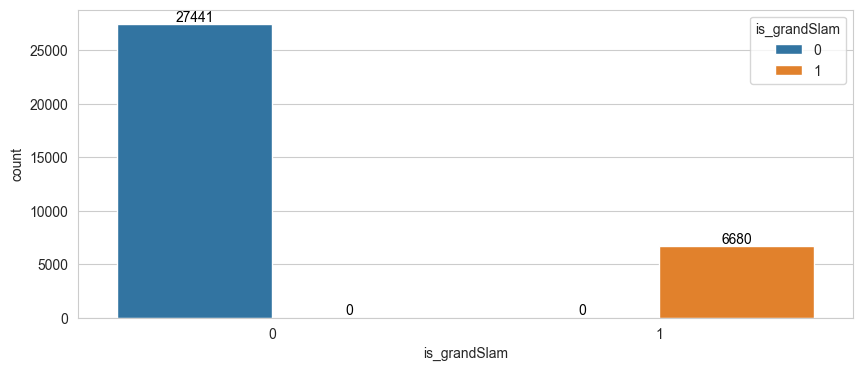

,is_grandSlam (%),is_formerTop10 (%)
0,80.42,16.65
1,19.58,28.44


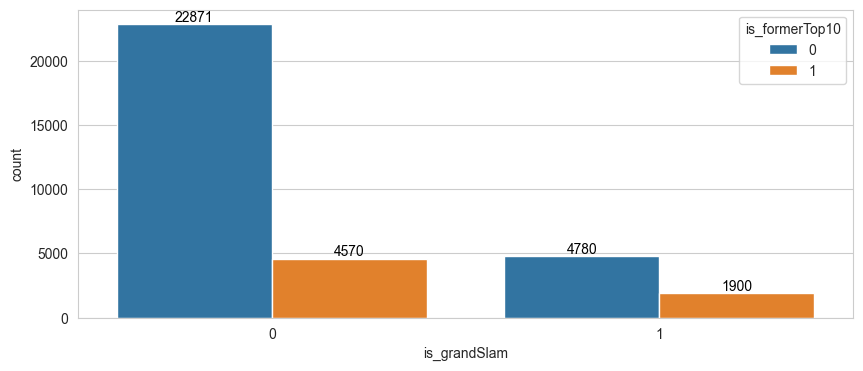

,is_grandSlam (%),diff_homeAdvantage (%)
0,80.42,-0.11
1,19.58,0.52


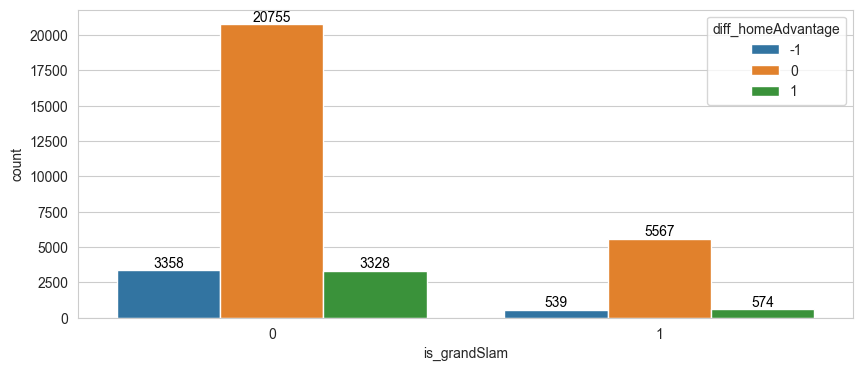

,is_grandSlam (%),diff_surfaceAdvantage (%)
0,80.42,0.41
1,19.58,0.36


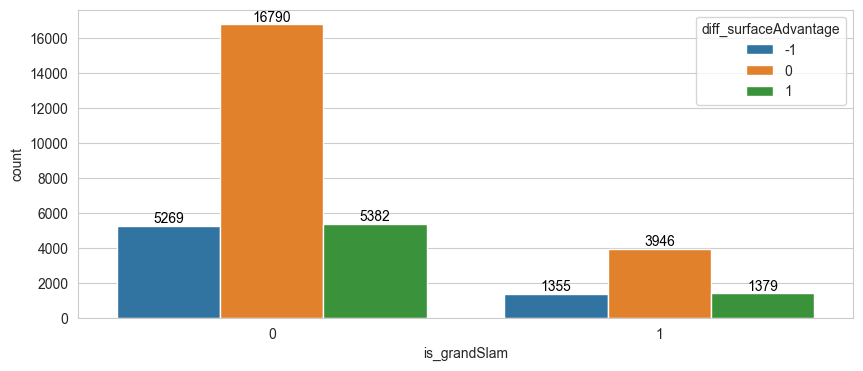

,is_grandSlam (%),ord_tourneyLevel (%)
0,80.42,127.56
1,19.58,400.00


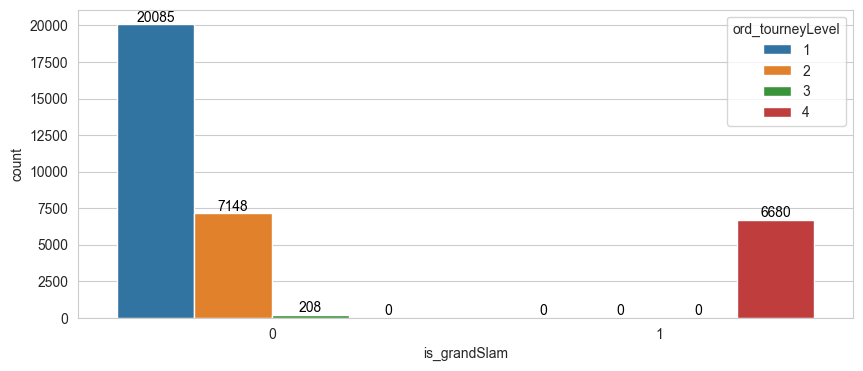

,is_grandSlam (%),is_outdoor (%)
0,80.42,77.38
1,19.58,100.00


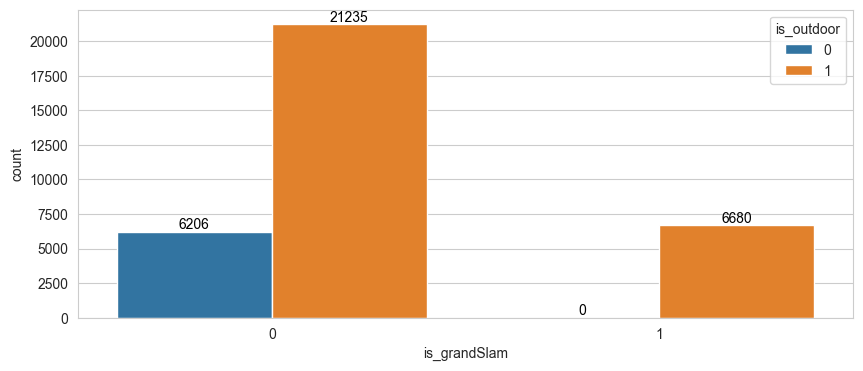

,is_grandSlam (%),surface_Clay (%)
0,80.42,32.33
1,19.58,25.73


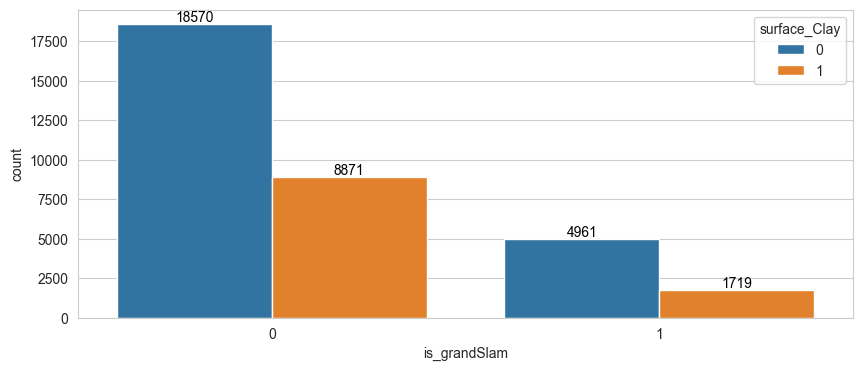

,is_grandSlam (%),surface_Grass (%)
0,80.42,8.36
1,19.58,23.77


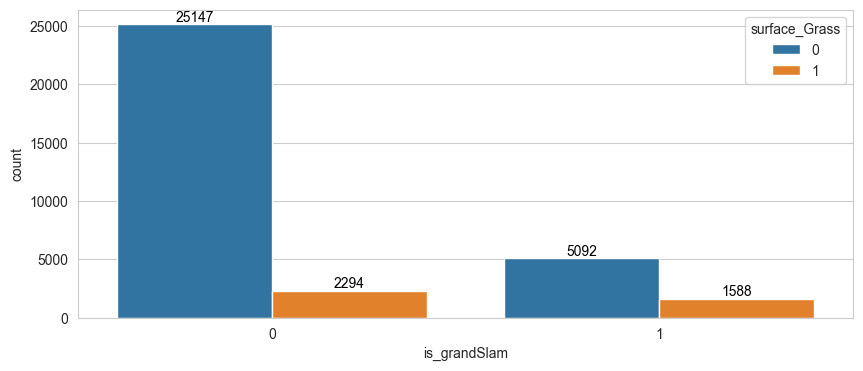

,is_grandSlam (%),surface_Hard (%)
0,80.42,59.31
1,19.58,50.49


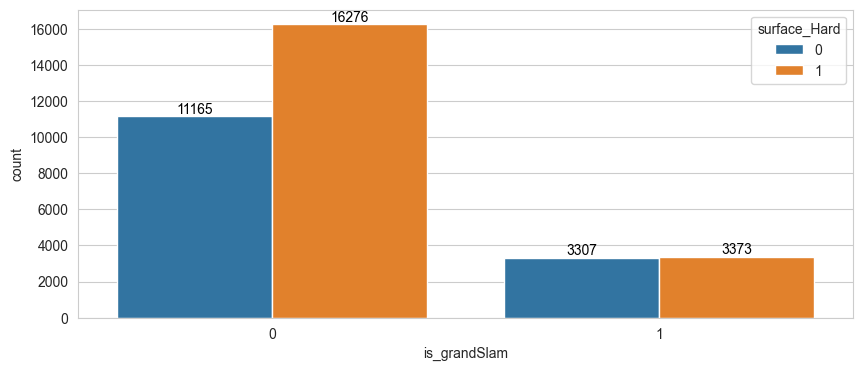

,is_grandSlam (%),ord_drawSize (%)
0,80.42,479.37
1,19.58,900.00


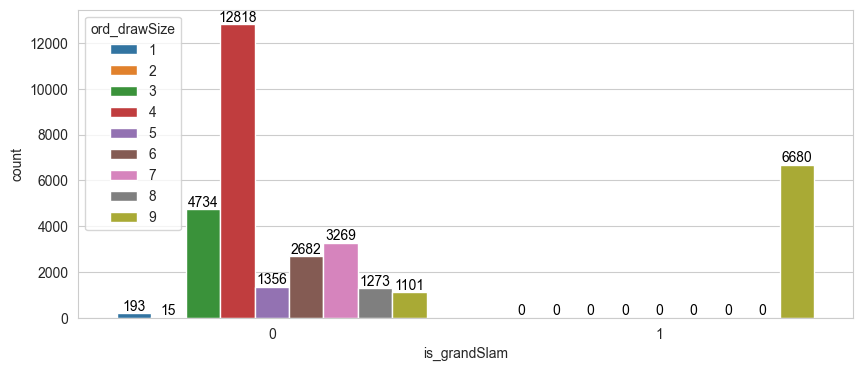

,is_grandSlam (%),ord_round (%)
0,80.42,356.50
1,19.58,194.76


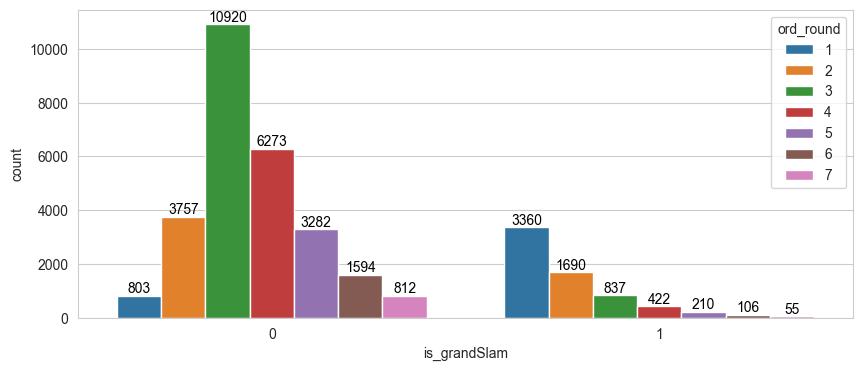

,is_grandSlam (%),handedness_L (%)
0,80.42,1.94
1,19.58,1.69


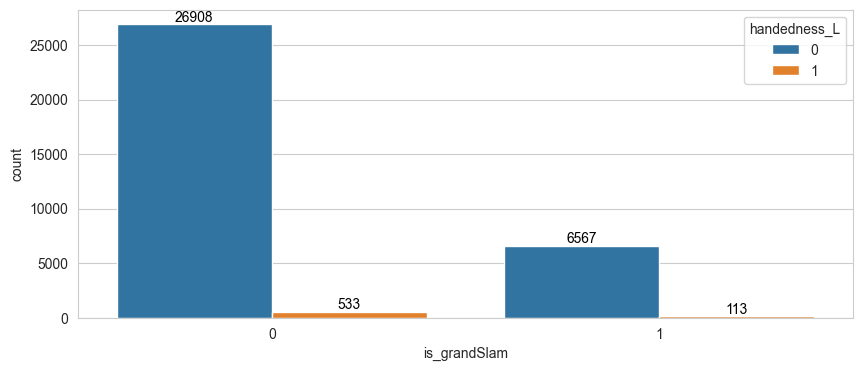

,is_grandSlam (%),handedness_LR (%)
0,80.42,11.84
1,19.58,11.45


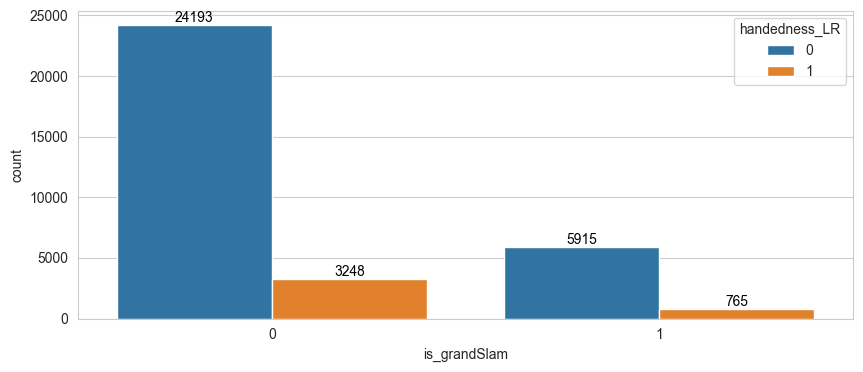

,is_grandSlam (%),handedness_R (%)
0,80.42,73.96
1,19.58,74.70


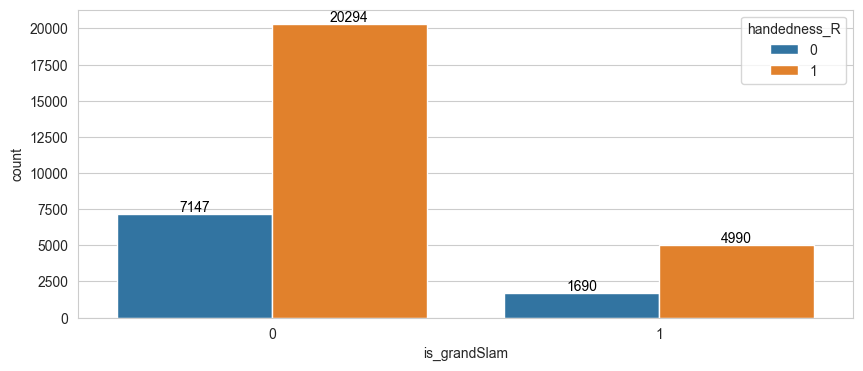

,is_grandSlam (%),handedness_RL (%)
0,80.42,12.27
1,19.58,12.16


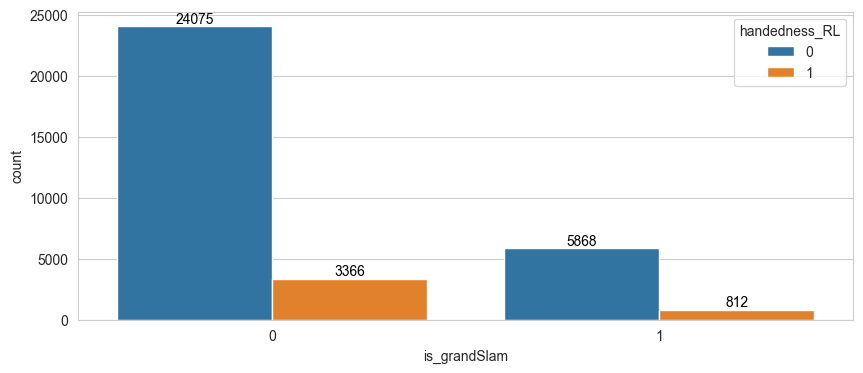

,is_grandSlam (%),favorite_won (%)
0,80.42,64.17
1,19.58,73.35


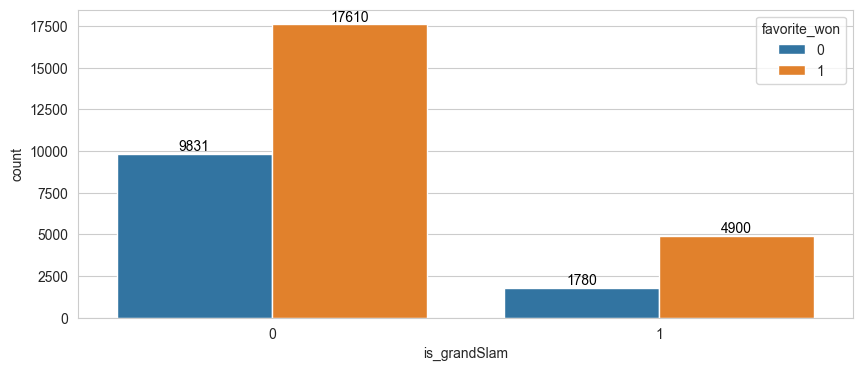

,is_formerTop10 (%),favorite_won (%)
0,81.04,62.91
1,18.96,79.04


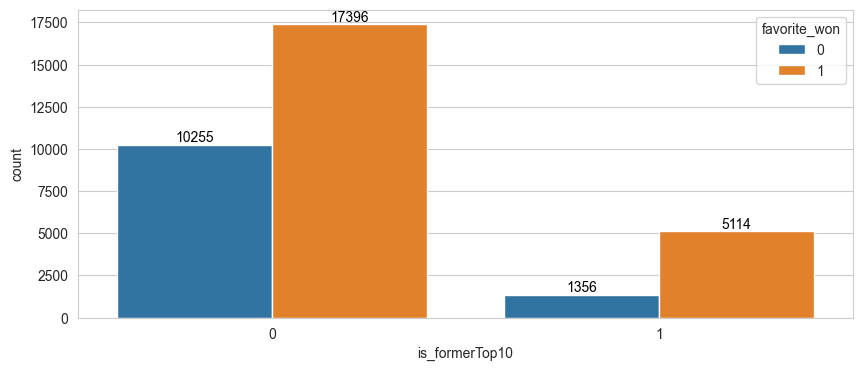

,is_formerTop10 (%),is_grandSlam (%)
0,81.04,17.29
1,18.96,29.37


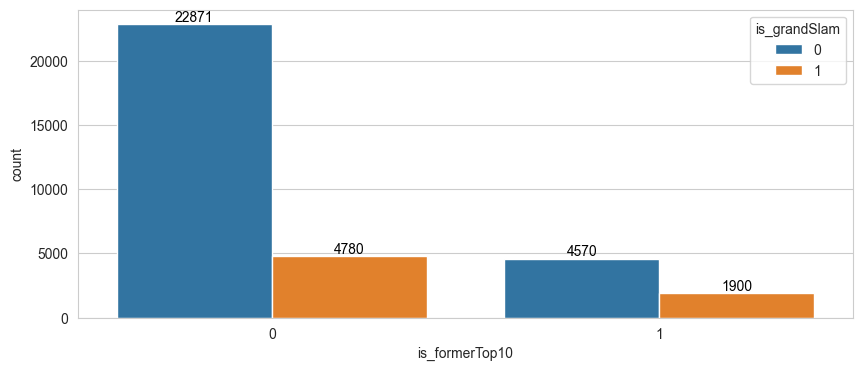

,is_formerTop10 (%),is_formerTop10 (%)
0,81.04,0.00
1,18.96,100.00


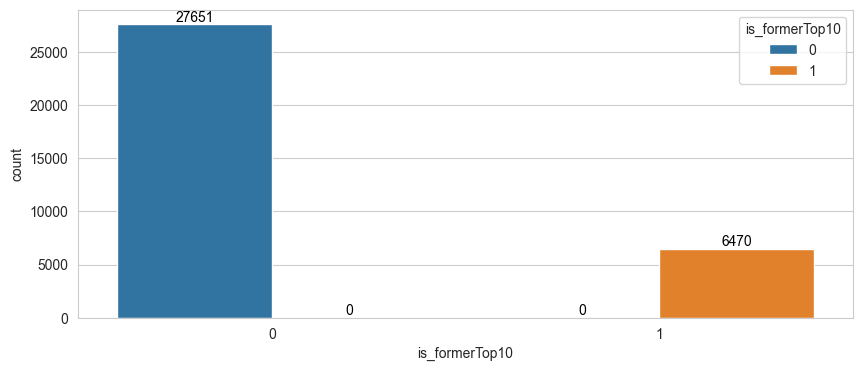

,is_formerTop10 (%),diff_homeAdvantage (%)
0,81.04,0.04
1,18.96,-0.08


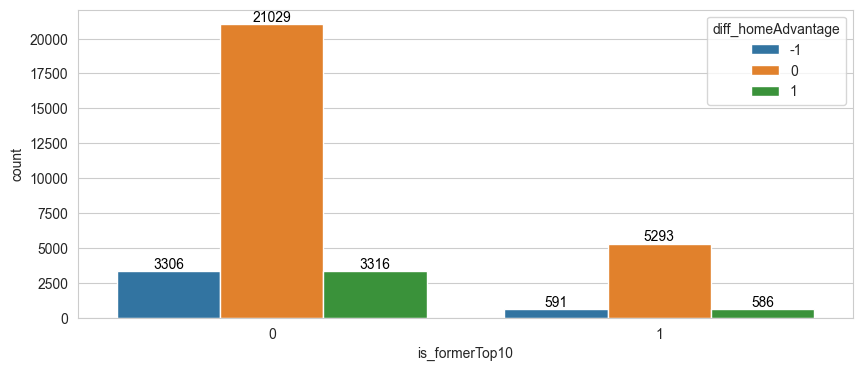

,is_formerTop10 (%),diff_surfaceAdvantage (%)
0,81.04,0.24
1,18.96,1.08


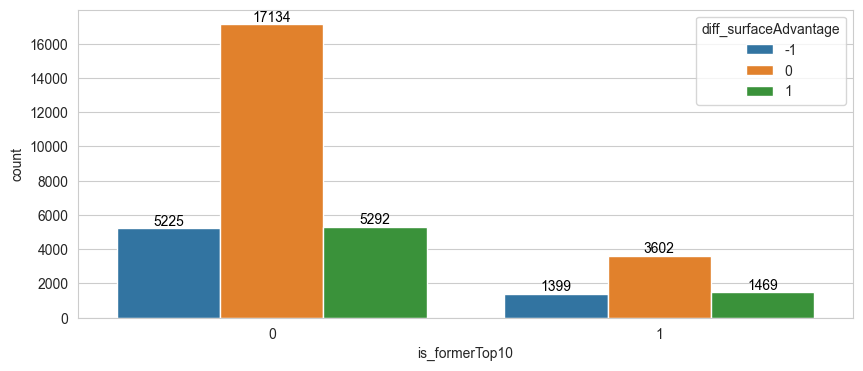

,is_formerTop10 (%),ord_tourneyLevel (%)
0,81.04,169.89
1,18.96,227.96


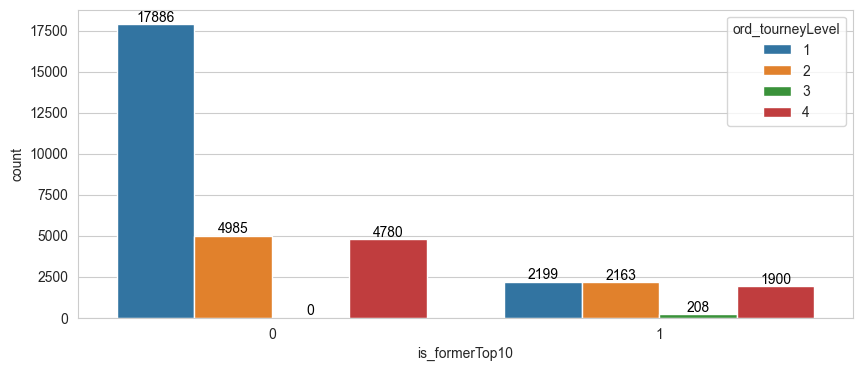

,is_formerTop10 (%),is_outdoor (%)
0,81.04,81.73
1,18.96,82.15


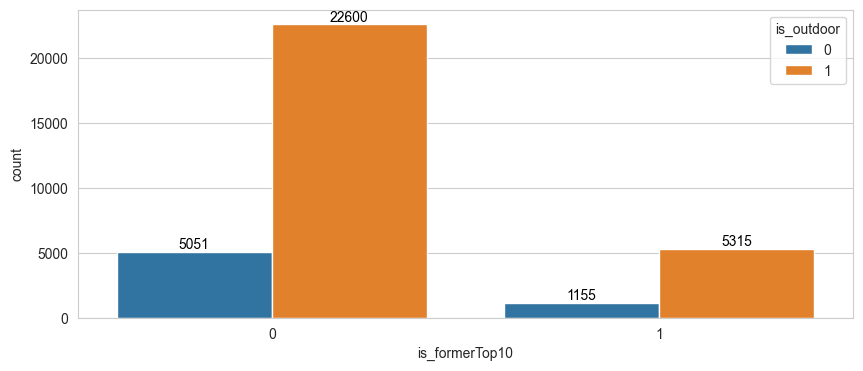

,is_formerTop10 (%),surface_Clay (%)
0,81.04,32.08
1,18.96,26.58


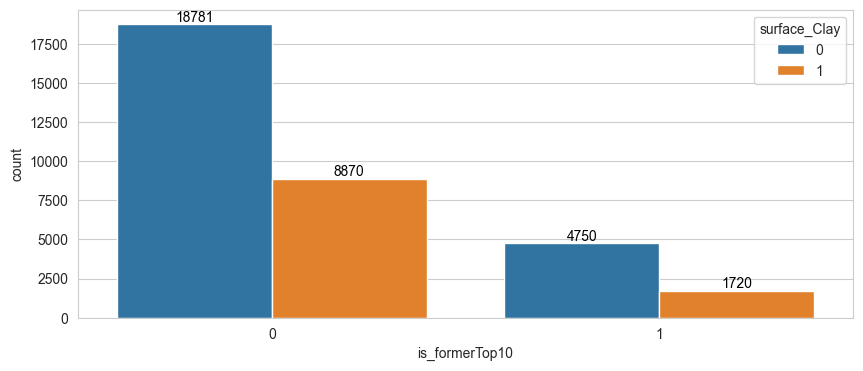

,is_formerTop10 (%),surface_Grass (%)
0,81.04,11.51
1,18.96,10.82


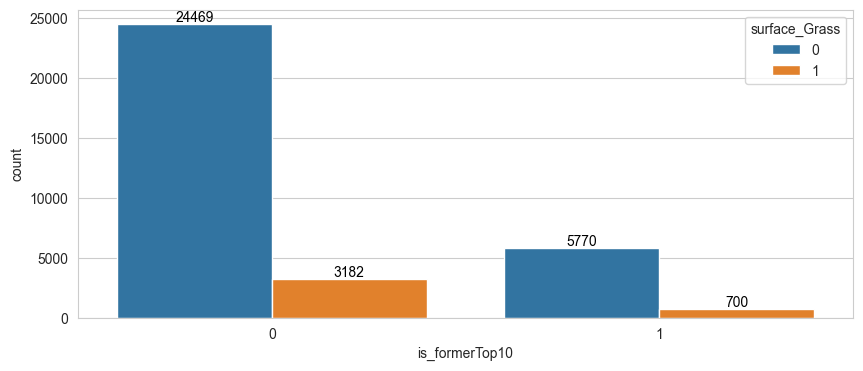

,is_formerTop10 (%),surface_Hard (%)
0,81.04,56.41
1,18.96,62.60


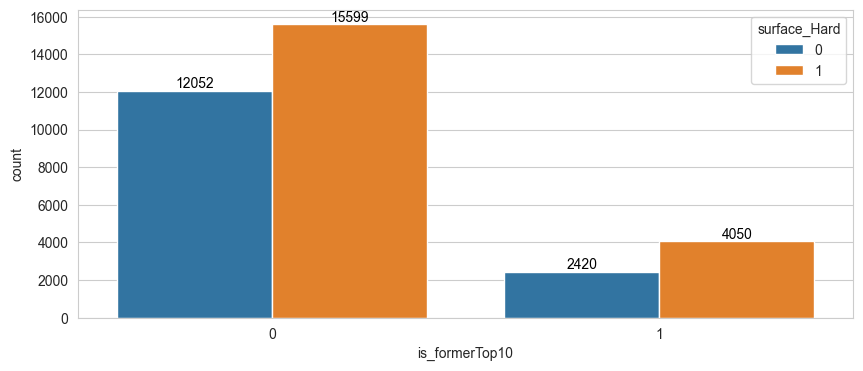

,is_formerTop10 (%),ord_drawSize (%)
0,81.04,543.76
1,18.96,638.49


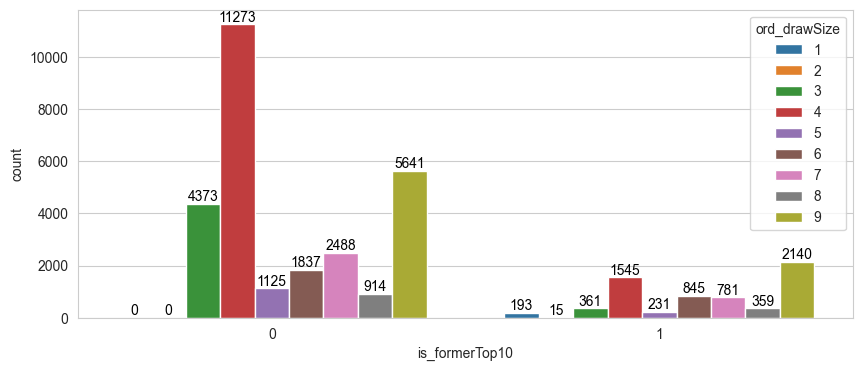

,is_formerTop10 (%),ord_round (%)
0,81.04,305.76
1,18.96,406.37


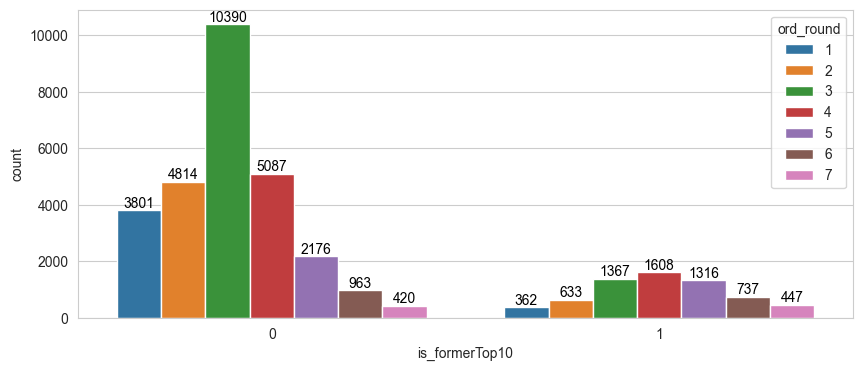

,is_formerTop10 (%),handedness_L (%)
0,81.04,2.05
1,18.96,1.21


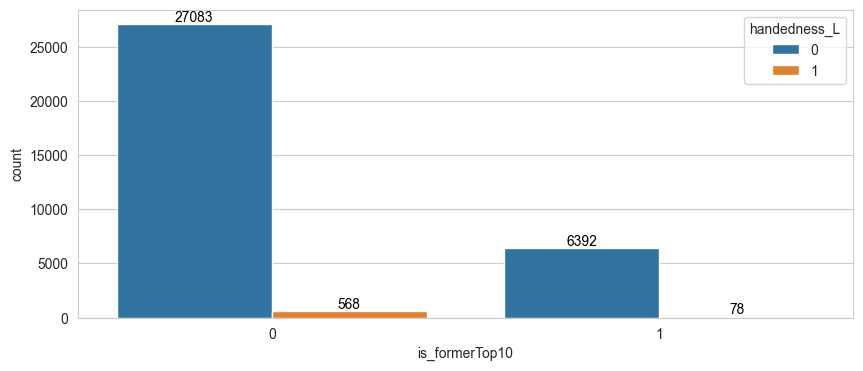

,is_formerTop10 (%),handedness_LR (%)
0,81.04,11.87
1,18.96,11.31


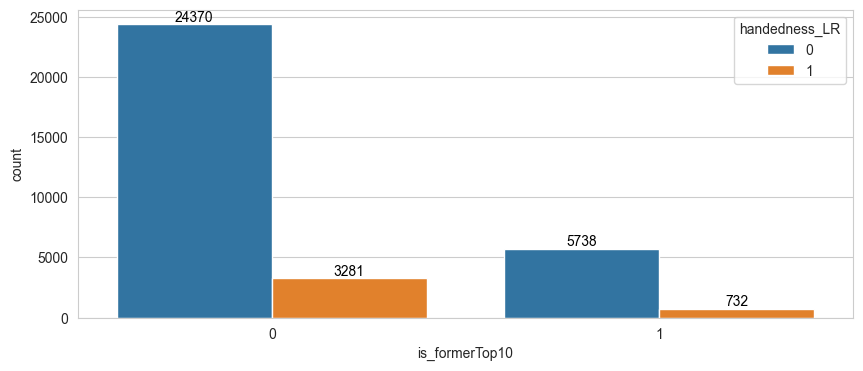

,is_formerTop10 (%),handedness_R (%)
0,81.04,73.53
1,18.96,76.54


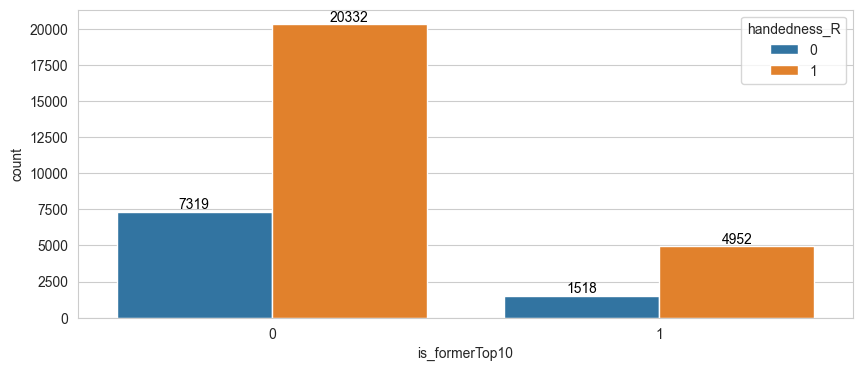

,is_formerTop10 (%),handedness_RL (%)
0,81.04,12.55
1,18.96,10.94


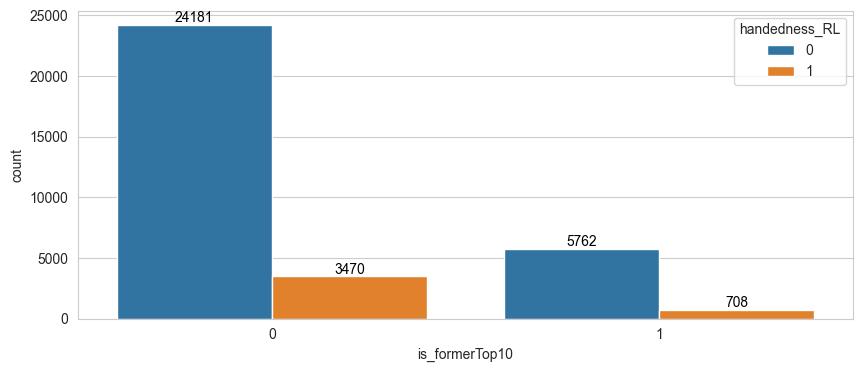

,is_formerTop10 (%),favorite_won (%)
0,81.04,62.91
1,18.96,79.04


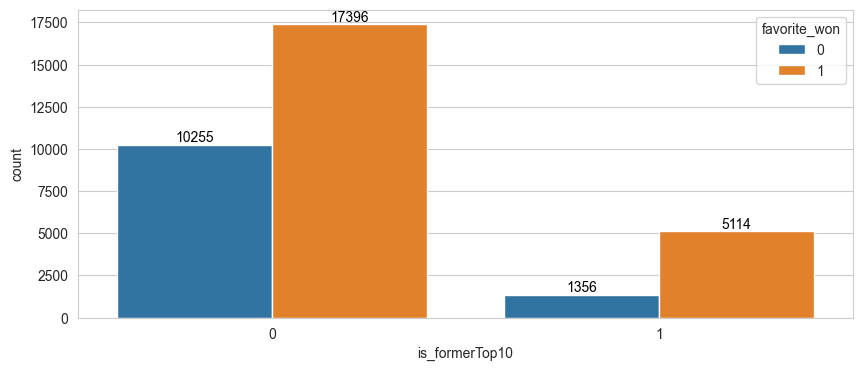

,diff_homeAdvantage (%),favorite_won (%)
-1,11.42,66.92
0,77.14,65.69
1,11.44,66.94


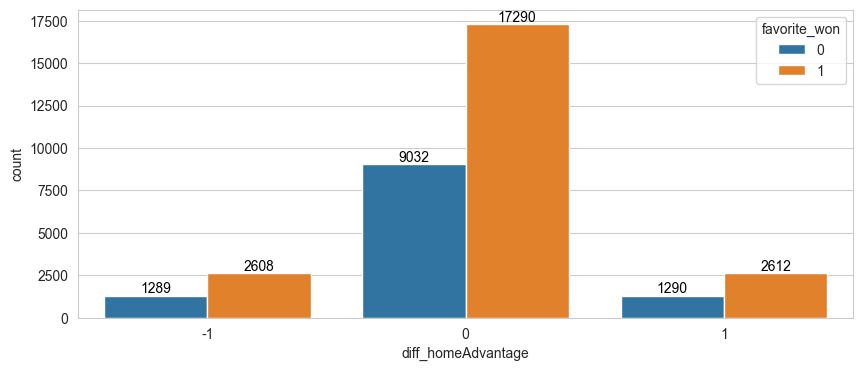

,diff_homeAdvantage (%),is_grandSlam (%)
-1,11.42,13.83
0,77.14,21.15
1,11.44,14.71


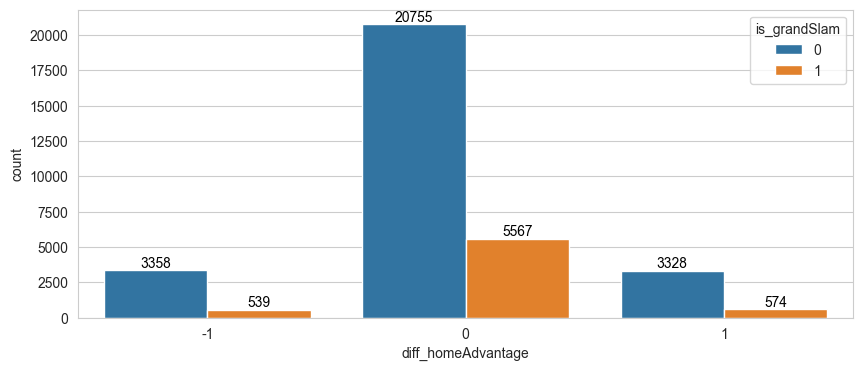

,diff_homeAdvantage (%),is_formerTop10 (%)
-1,11.42,15.17
0,77.14,20.11
1,11.44,15.02


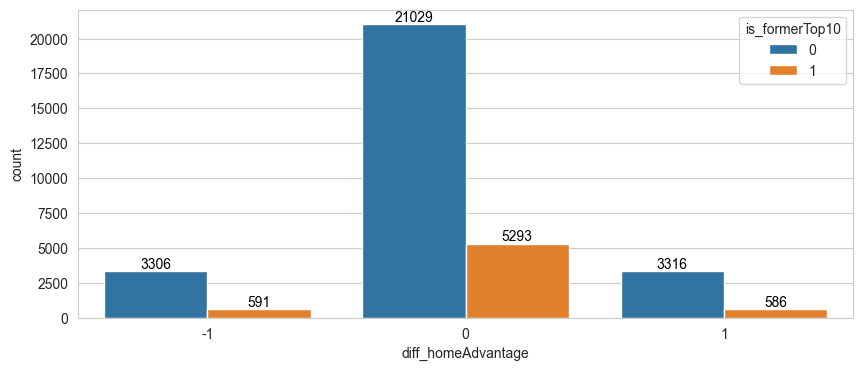

,diff_homeAdvantage (%),diff_homeAdvantage (%)
-1,11.42,-100.00
0,77.14,0.00
1,11.44,100.00


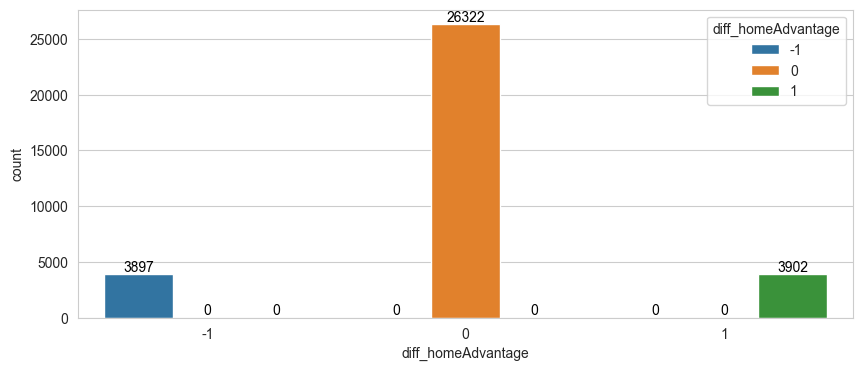

,diff_homeAdvantage (%),diff_surfaceAdvantage (%)
-1,11.42,-7.21
0,77.14,0.84
1,11.44,5.02


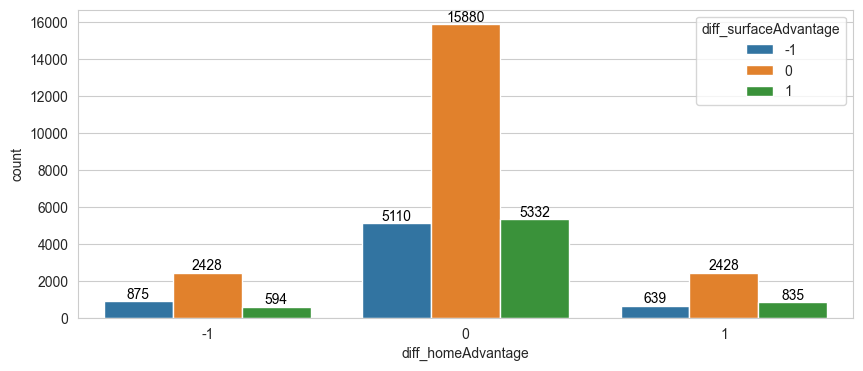

,diff_homeAdvantage (%),ord_tourneyLevel (%)
-1,11.42,160.87
0,77.14,186.49
1,11.44,163.20


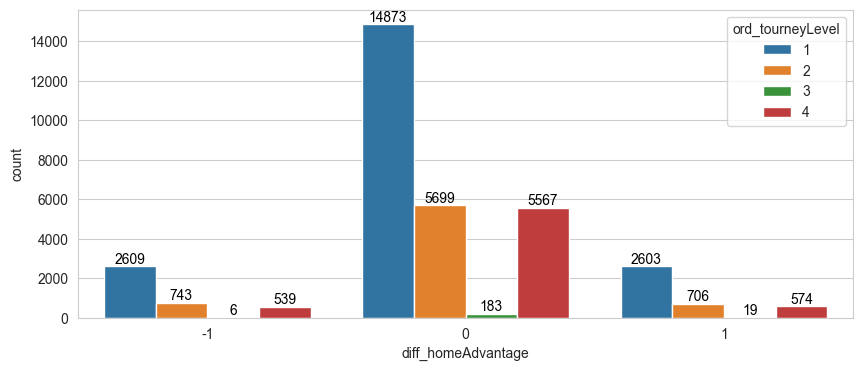

,diff_homeAdvantage (%),is_outdoor (%)
-1,11.42,77.57
0,77.14,83.14
1,11.44,77.06


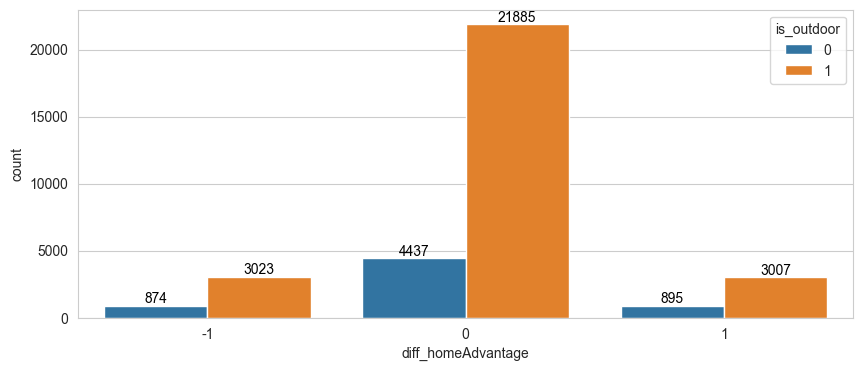

,diff_homeAdvantage (%),surface_Clay (%)
-1,11.42,33.21
0,77.14,30.48
1,11.44,32.65


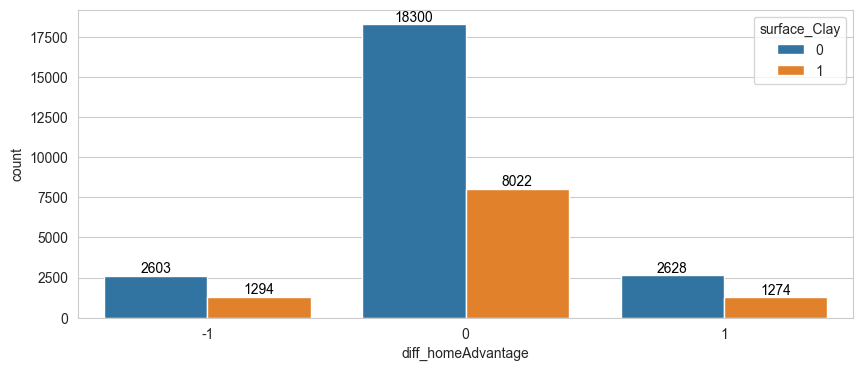

,diff_homeAdvantage (%),surface_Grass (%)
-1,11.42,9.26
0,77.14,11.94
1,11.44,9.71


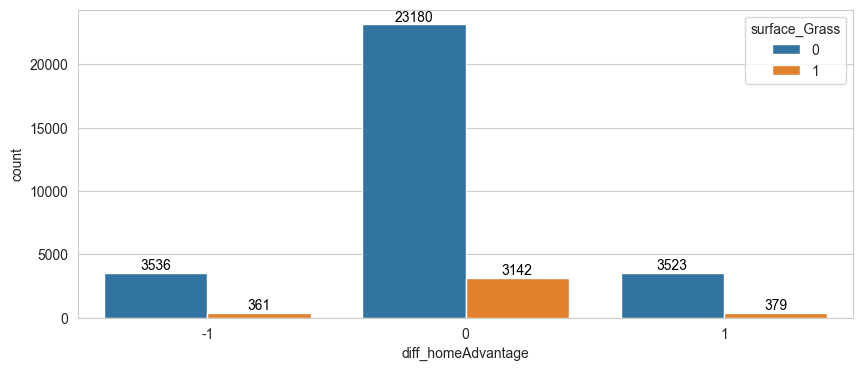

,diff_homeAdvantage (%),surface_Hard (%)
-1,11.42,57.53
0,77.14,57.59
1,11.44,57.64


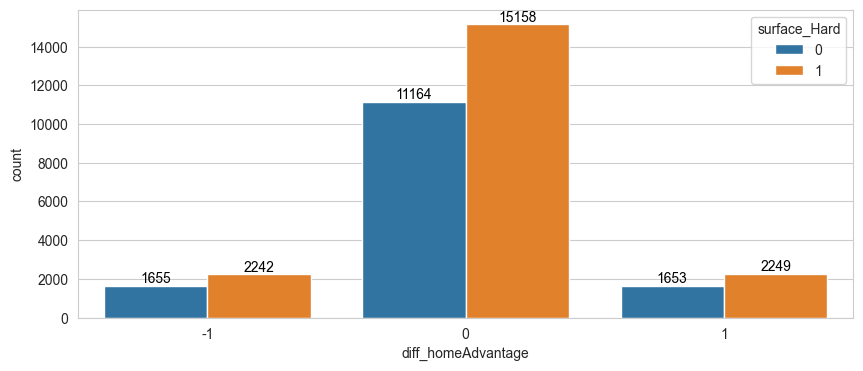

,diff_homeAdvantage (%),ord_drawSize (%)
-1,11.42,534.00
0,77.14,570.03
1,11.44,533.37


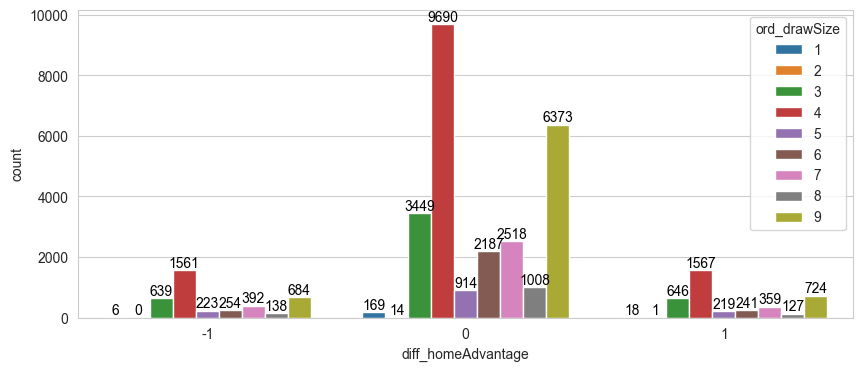

,diff_homeAdvantage (%),ord_round (%)
-1,11.42,325.40
0,77.14,324.25
1,11.44,328.24


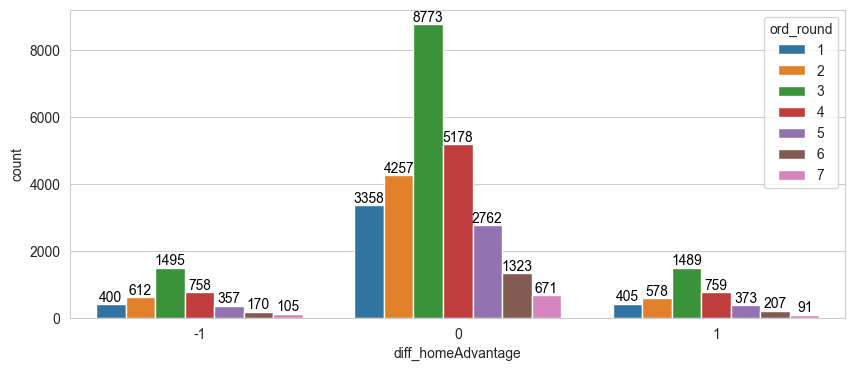

,diff_homeAdvantage (%),handedness_L (%)
-1,11.42,1.74
0,77.14,1.93
1,11.44,1.79


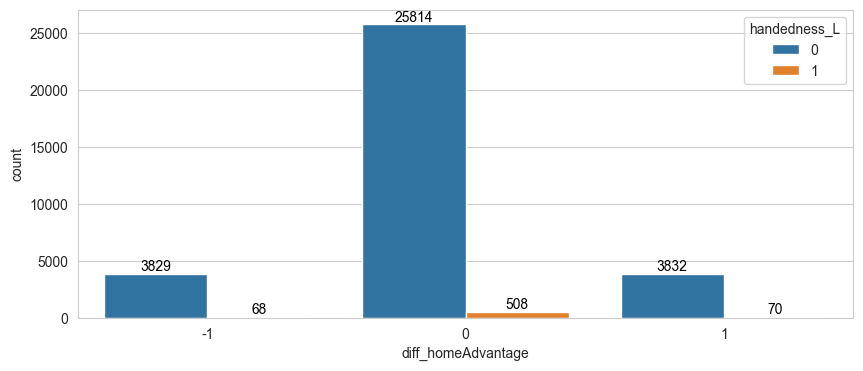

,diff_homeAdvantage (%),handedness_LR (%)
-1,11.42,11.50
0,77.14,11.91
1,11.44,10.99


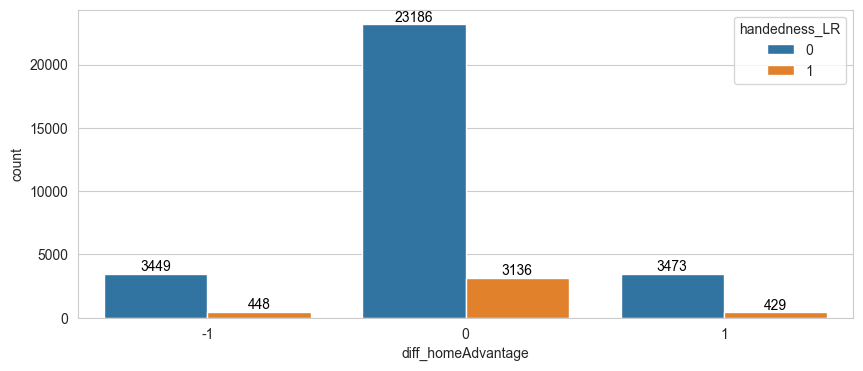

,diff_homeAdvantage (%),handedness_R (%)
-1,11.42,74.34
0,77.14,74.06
1,11.44,74.14


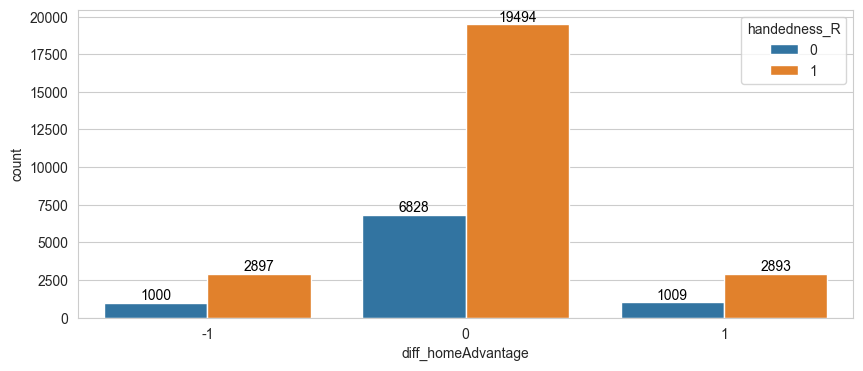

,diff_homeAdvantage (%),handedness_RL (%)
-1,11.42,12.42
0,77.14,12.10
1,11.44,13.07


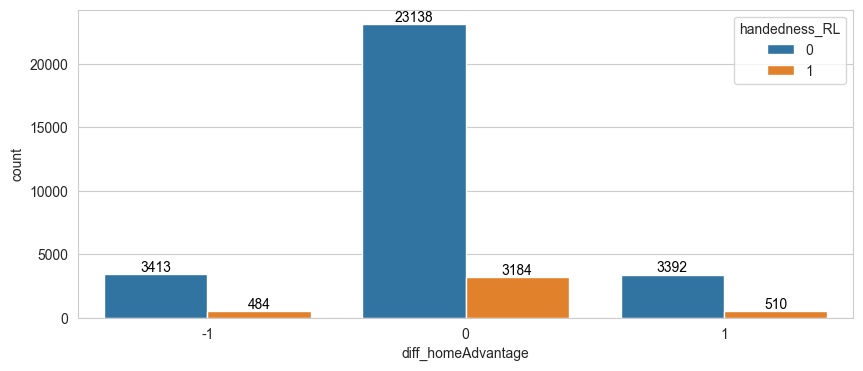

,diff_homeAdvantage (%),favorite_won (%)
-1,11.42,66.92
0,77.14,65.69
1,11.44,66.94


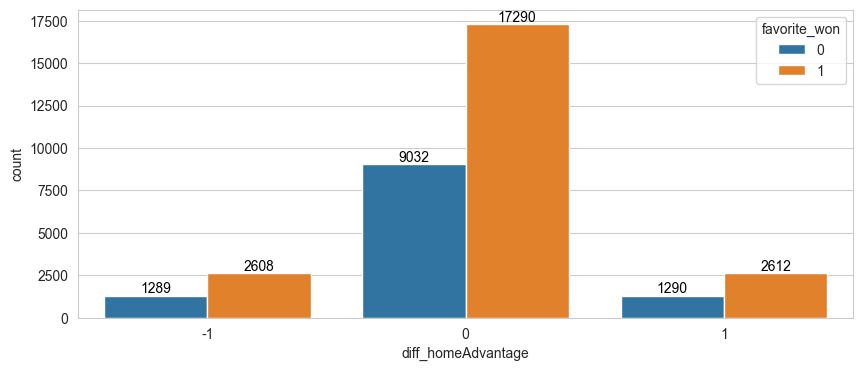

,diff_surfaceAdvantage (%),favorite_won (%)
-1,19.41,65.87
0,60.77,65.95
1,19.81,66.13


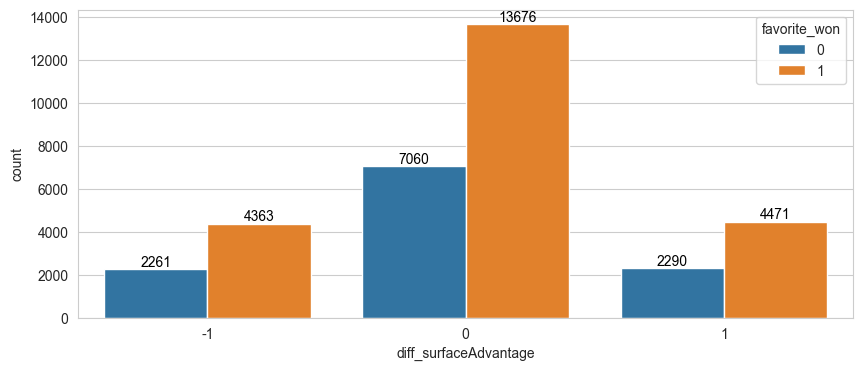

,diff_surfaceAdvantage (%),is_grandSlam (%)
-1,19.41,20.46
0,60.77,19.03
1,19.81,20.40


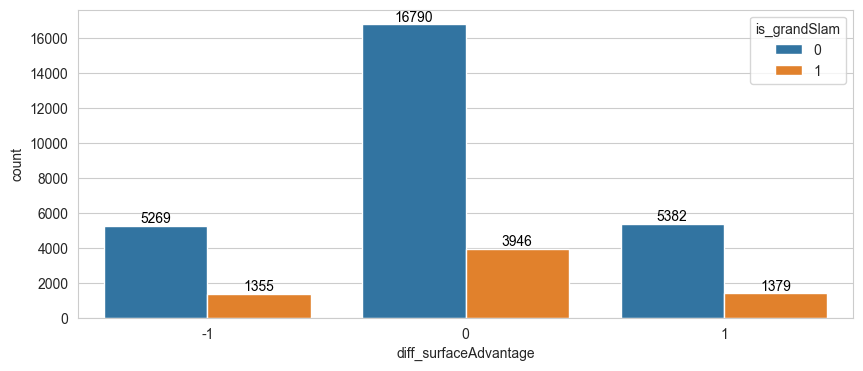

,diff_surfaceAdvantage (%),is_formerTop10 (%)
-1,19.41,21.12
0,60.77,17.37
1,19.81,21.73


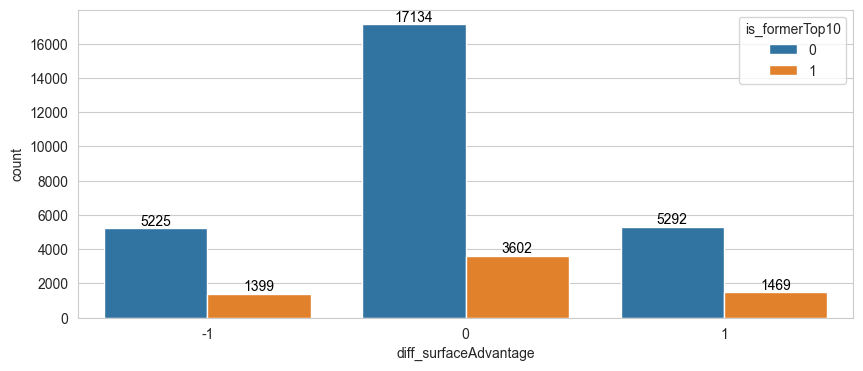

,diff_surfaceAdvantage (%),diff_homeAdvantage (%)
-1,19.41,-3.56
0,60.77,0.00
1,19.81,3.56


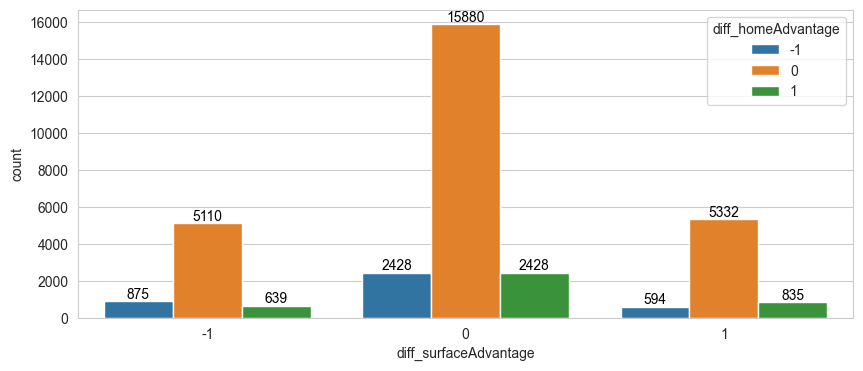

,diff_surfaceAdvantage (%),diff_surfaceAdvantage (%)
-1,19.41,-100.00
0,60.77,0.00
1,19.81,100.00


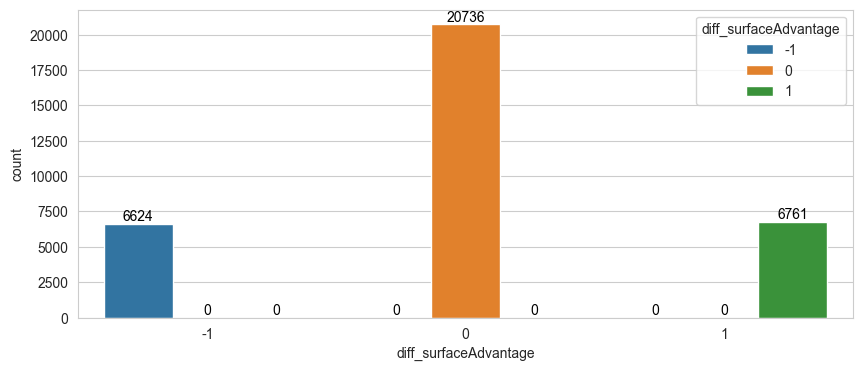

,diff_surfaceAdvantage (%),ord_tourneyLevel (%)
-1,19.41,185.84
0,60.77,177.51
1,19.81,186.45


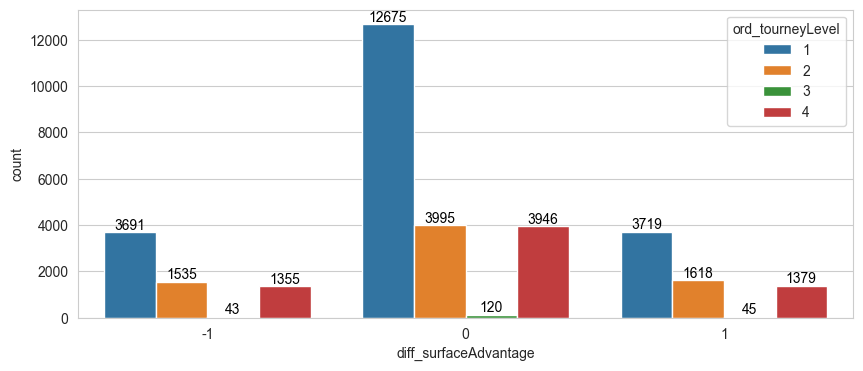

,diff_surfaceAdvantage (%),is_outdoor (%)
-1,19.41,80.37
0,60.77,82.30
1,19.81,81.73


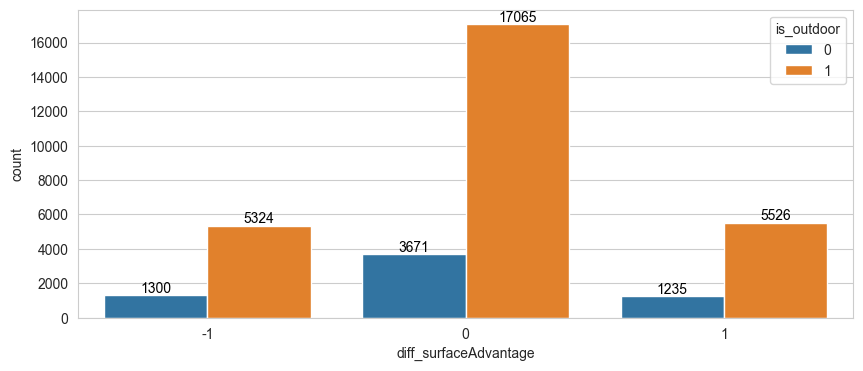

,diff_surfaceAdvantage (%),surface_Clay (%)
-1,19.41,29.03
0,60.77,31.89
1,19.81,30.38


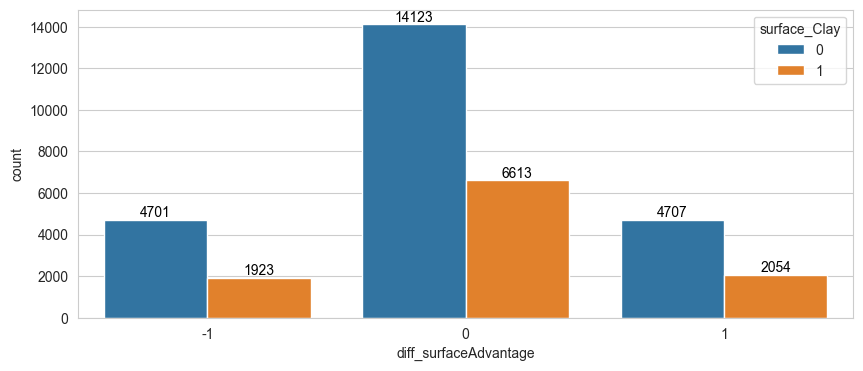

,diff_surfaceAdvantage (%),surface_Grass (%)
-1,19.41,9.04
0,60.77,12.72
1,19.81,9.54


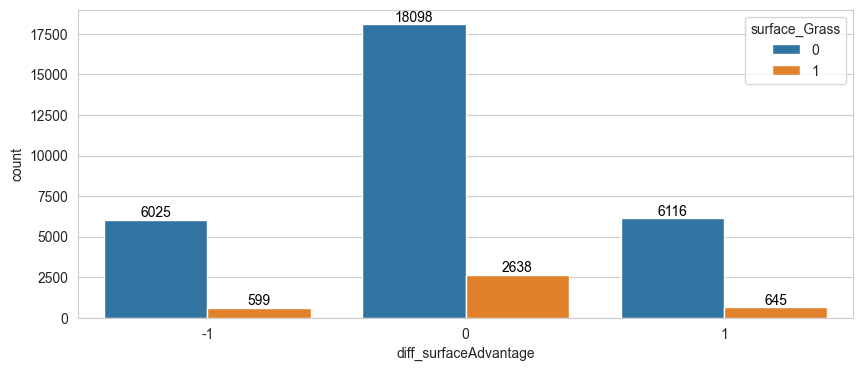

,diff_surfaceAdvantage (%),surface_Hard (%)
-1,19.41,61.93
0,60.77,55.39
1,19.81,60.08


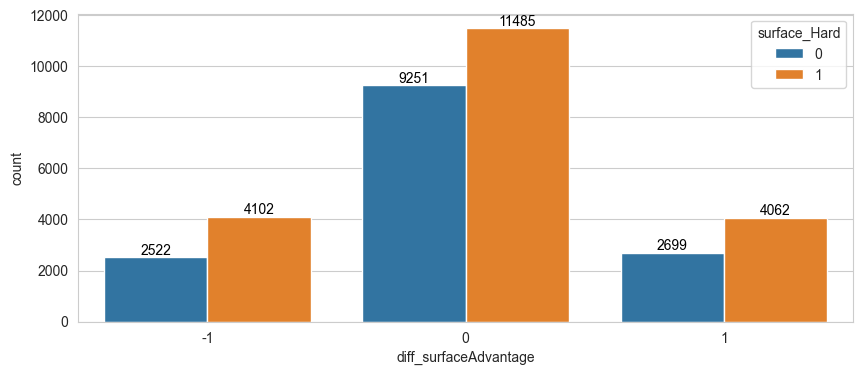

,diff_surfaceAdvantage (%),ord_drawSize (%)
-1,19.41,573.46
0,60.77,553.62
1,19.81,575.06


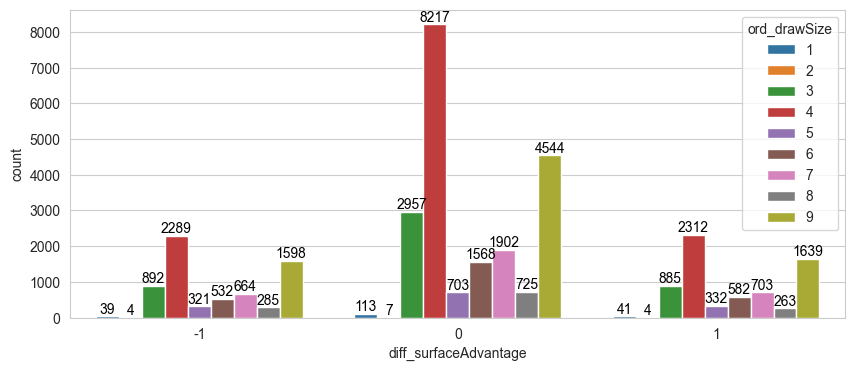

,diff_surfaceAdvantage (%),ord_round (%)
-1,19.41,317.80
0,60.77,328.70
1,19.81,319.88


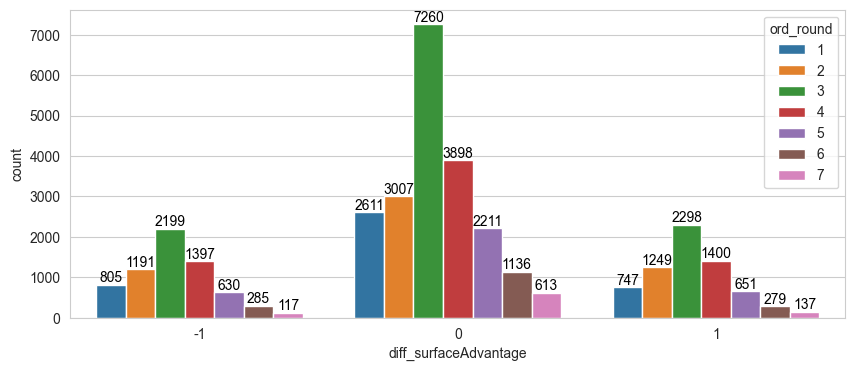

,diff_surfaceAdvantage (%),handedness_L (%)
-1,19.41,1.59
0,60.77,2.03
1,19.81,1.77


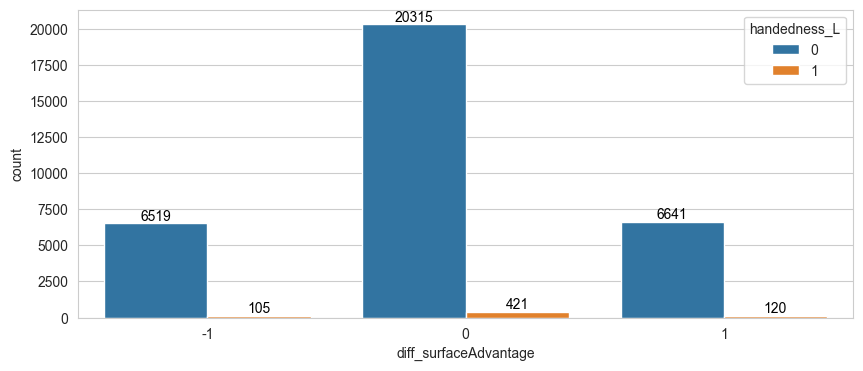

,diff_surfaceAdvantage (%),handedness_LR (%)
-1,19.41,10.78
0,60.77,12.28
1,19.81,11.14


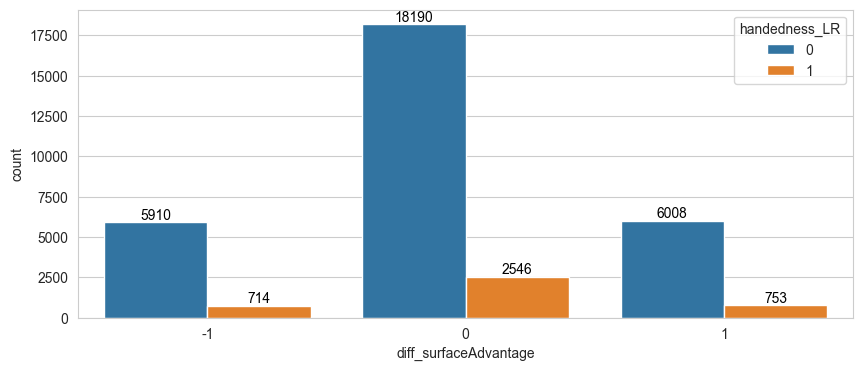

,diff_surfaceAdvantage (%),handedness_R (%)
-1,19.41,75.74
0,60.77,73.26
1,19.81,75.08


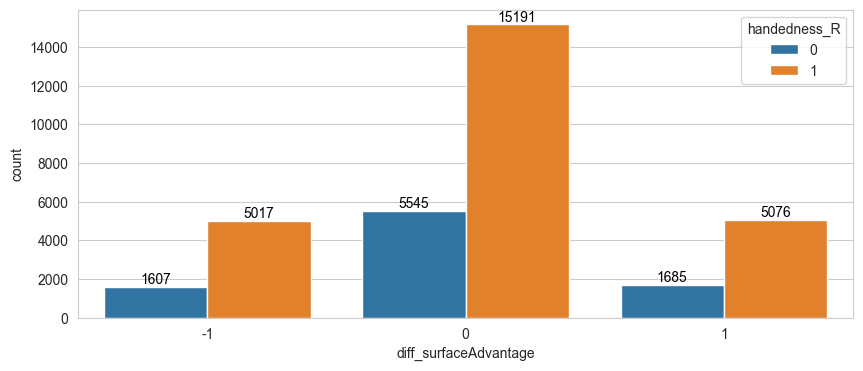

,diff_surfaceAdvantage (%),handedness_RL (%)
-1,19.41,11.90
0,60.77,12.43
1,19.81,12.01


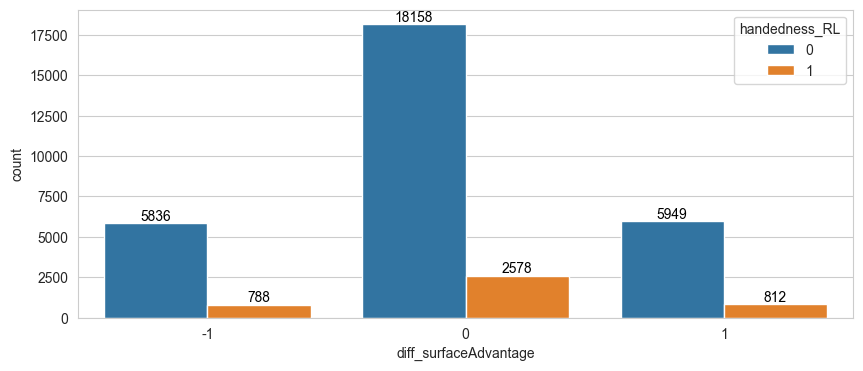

,diff_surfaceAdvantage (%),favorite_won (%)
-1,19.41,65.87
0,60.77,65.95
1,19.81,66.13


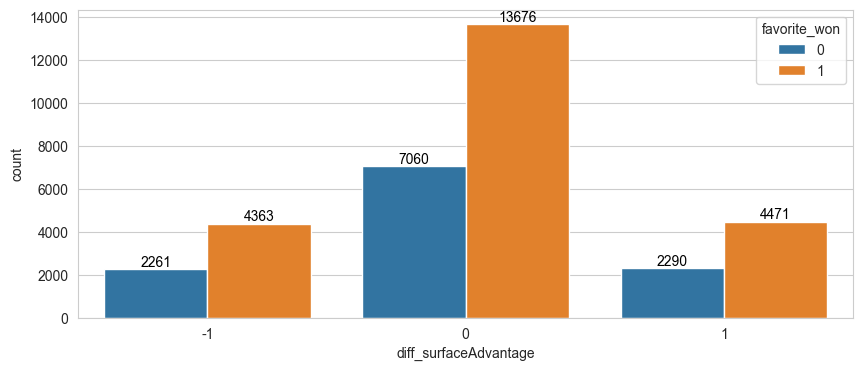

,ord_tourneyLevel (%),favorite_won (%)
1,58.86,63.49
2,20.95,65.99
3,0.61,67.79
4,19.58,73.35


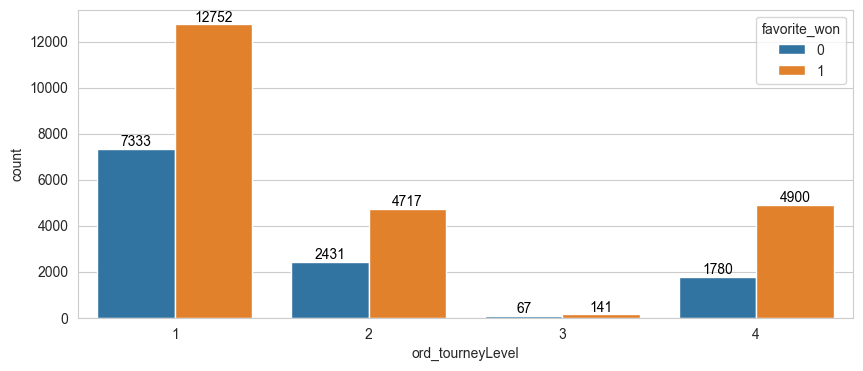

,ord_tourneyLevel (%),is_grandSlam (%)
1,58.86,0.00
2,20.95,0.00
3,0.61,0.00
4,19.58,100.00


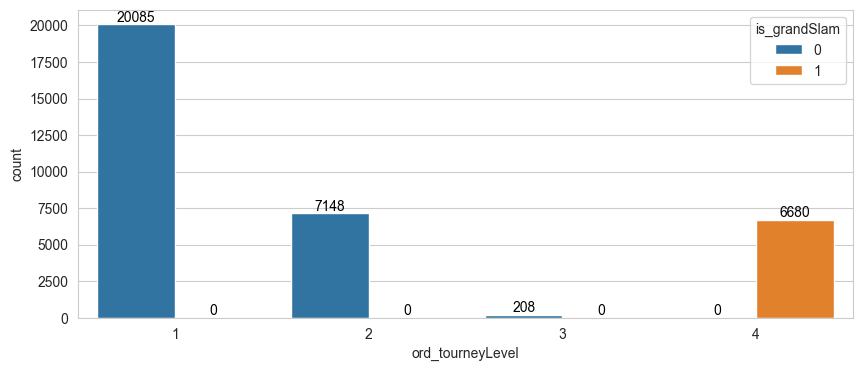

,ord_tourneyLevel (%),is_formerTop10 (%)
1,58.86,10.95
2,20.95,30.26
3,0.61,100.00
4,19.58,28.44


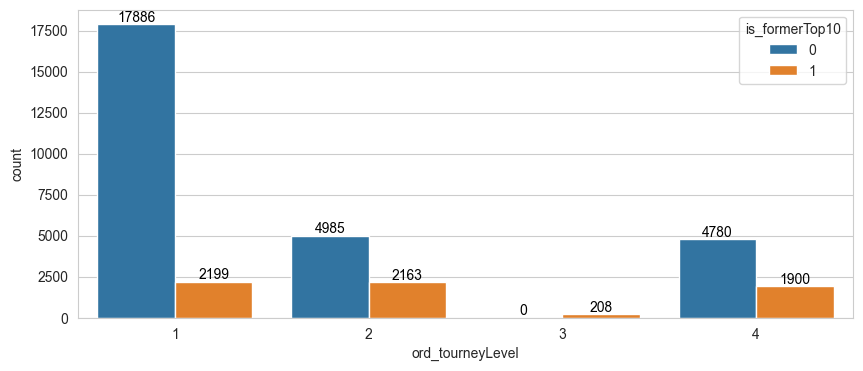

,ord_tourneyLevel (%),diff_homeAdvantage (%)
1,58.86,-0.03
2,20.95,-0.52
3,0.61,6.25
4,19.58,0.52


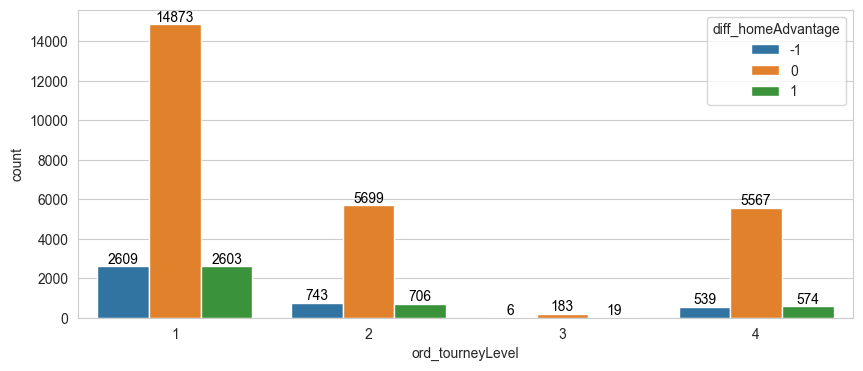

,ord_tourneyLevel (%),diff_surfaceAdvantage (%)
1,58.86,0.14
2,20.95,1.16
3,0.61,0.96
4,19.58,0.36


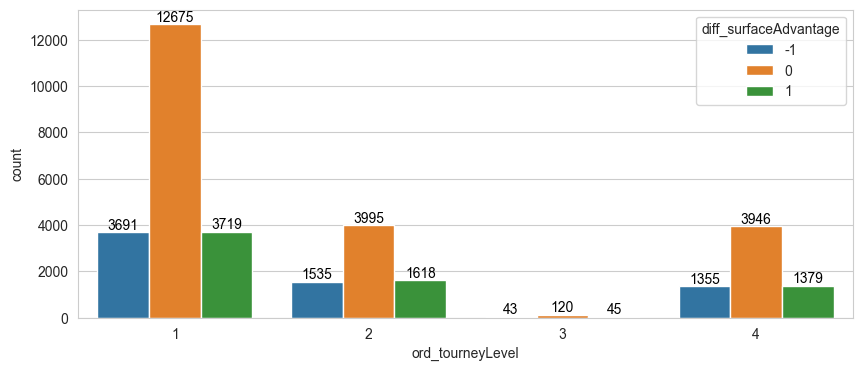

,ord_tourneyLevel (%),ord_tourneyLevel (%)
1,58.86,100.00
2,20.95,200.00
3,0.61,300.00
4,19.58,400.00


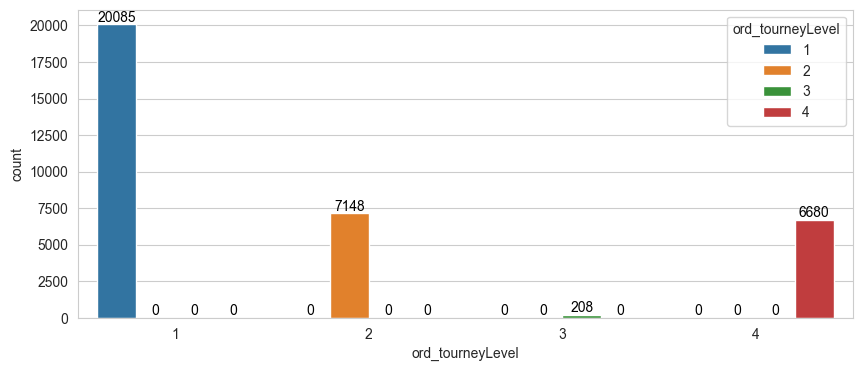

,ord_tourneyLevel (%),is_outdoor (%)
1,58.86,73.37
2,20.95,90.91
3,0.61,0.00
4,19.58,100.00


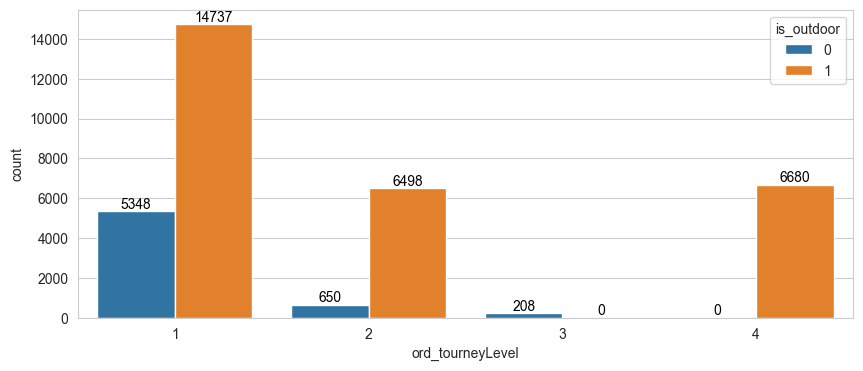

,ord_tourneyLevel (%),surface_Clay (%)
1,58.86,33.60
2,20.95,29.69
3,0.61,0.00
4,19.58,25.73


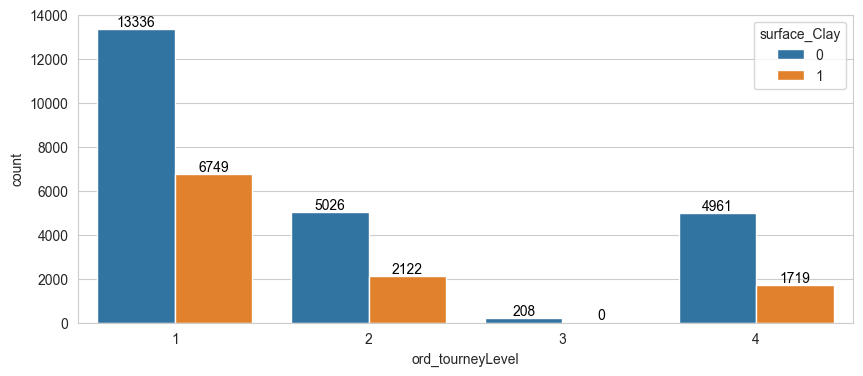

,ord_tourneyLevel (%),surface_Grass (%)
1,58.86,11.42
2,20.95,0.00
3,0.61,0.00
4,19.58,23.77


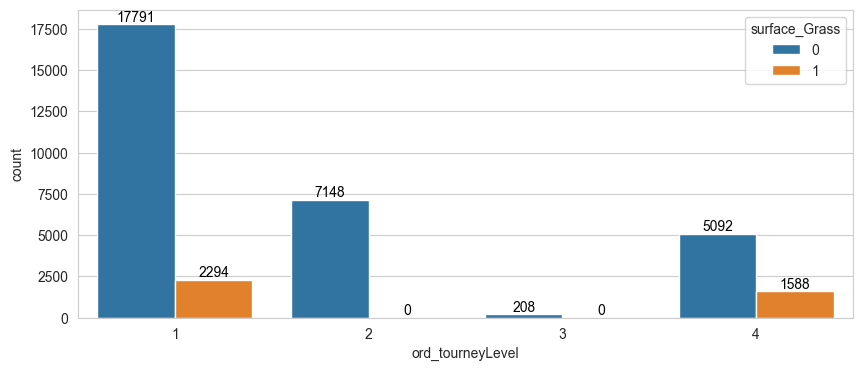

,ord_tourneyLevel (%),surface_Hard (%)
1,58.86,54.98
2,20.95,70.31
3,0.61,100.00
4,19.58,50.49


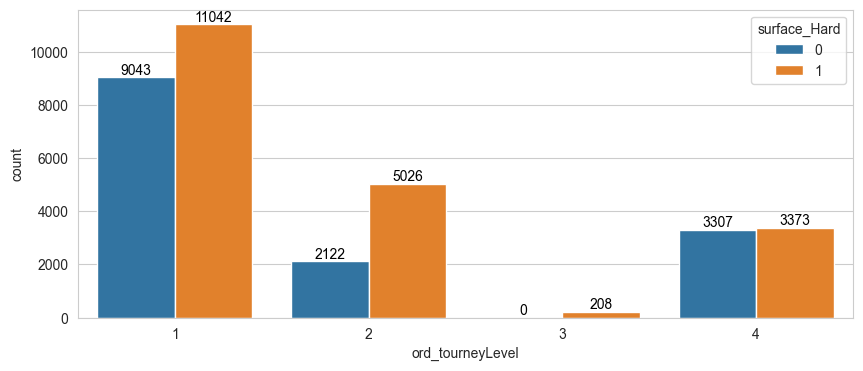

,ord_tourneyLevel (%),ord_drawSize (%)
1,58.86,401.76
2,20.95,708.30
3,0.61,107.21
4,19.58,900.00


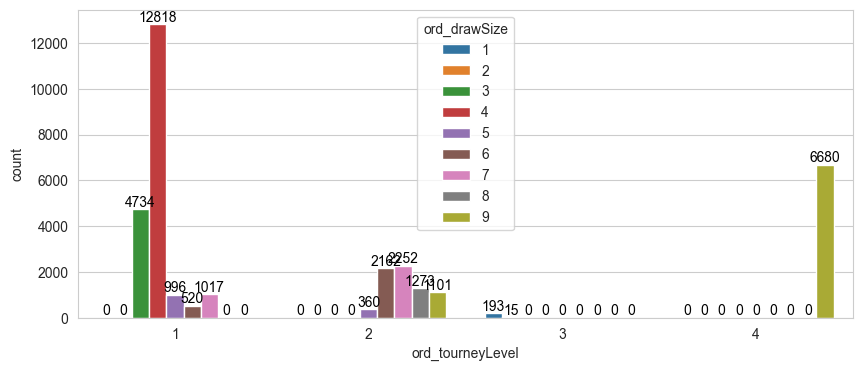

,ord_tourneyLevel (%),ord_round (%)
1,58.86,382.31
2,20.95,279.06
3,0.61,525.96
4,19.58,194.76


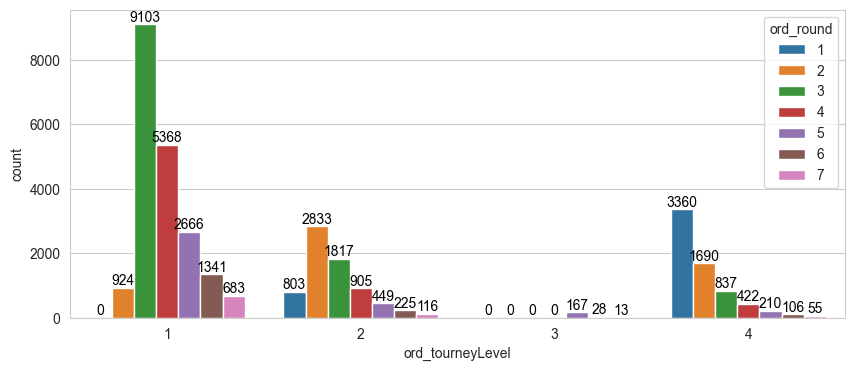

,ord_tourneyLevel (%),handedness_L (%)
1,58.86,2.03
2,20.95,1.76
3,0.61,0.00
4,19.58,1.69


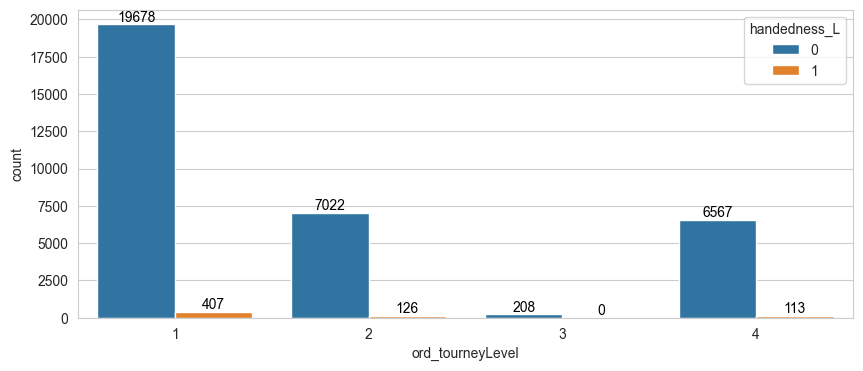

,ord_tourneyLevel (%),handedness_LR (%)
1,58.86,11.93
2,20.95,11.51
3,0.61,13.46
4,19.58,11.45


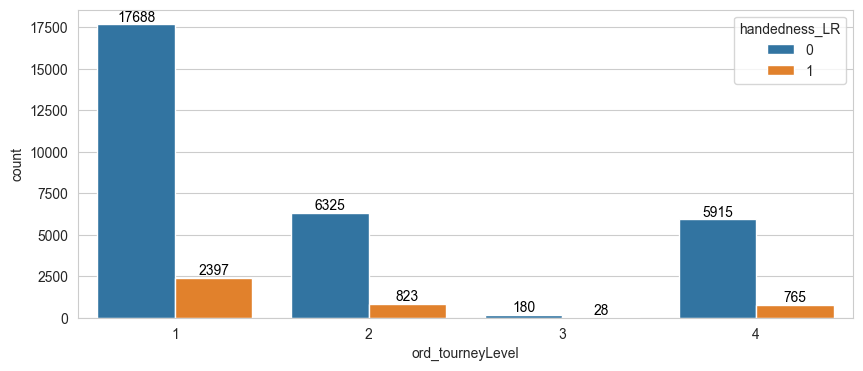

,ord_tourneyLevel (%),handedness_R (%)
1,58.86,73.69
2,20.95,74.45
3,0.61,82.69
4,19.58,74.70


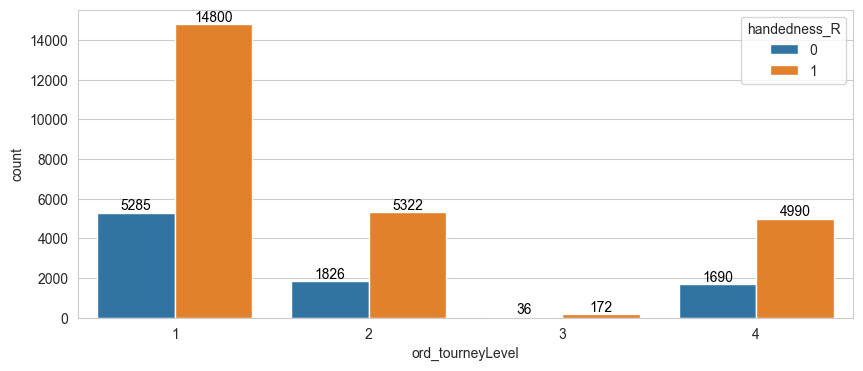

,ord_tourneyLevel (%),handedness_RL (%)
1,58.86,12.35
2,20.95,12.27
3,0.61,3.85
4,19.58,12.16


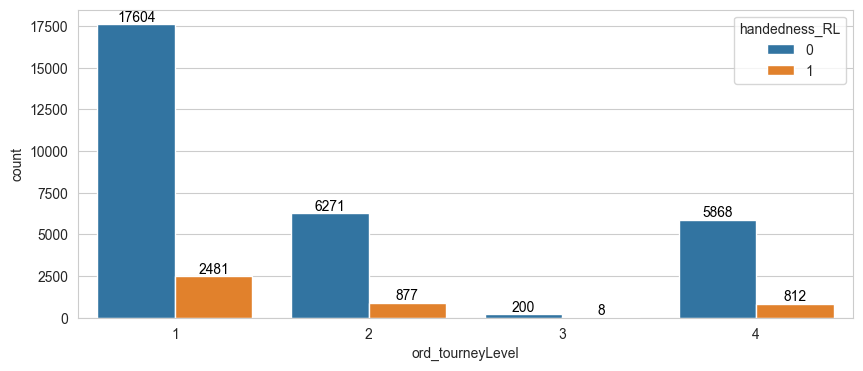

,ord_tourneyLevel (%),favorite_won (%)
1,58.86,63.49
2,20.95,65.99
3,0.61,67.79
4,19.58,73.35


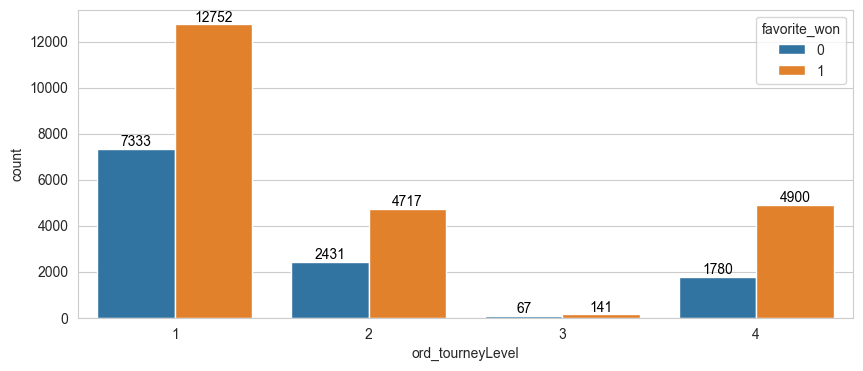

,is_outdoor (%),favorite_won (%)
0,18.19,65.23
1,81.81,66.14


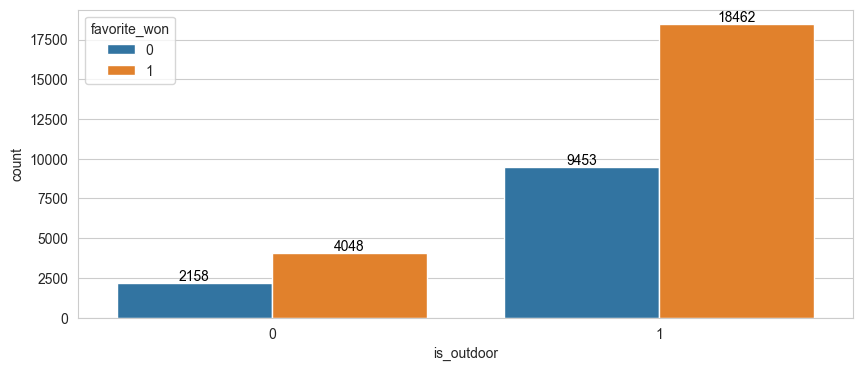

,is_outdoor (%),is_grandSlam (%)
0,18.19,0.00
1,81.81,23.93


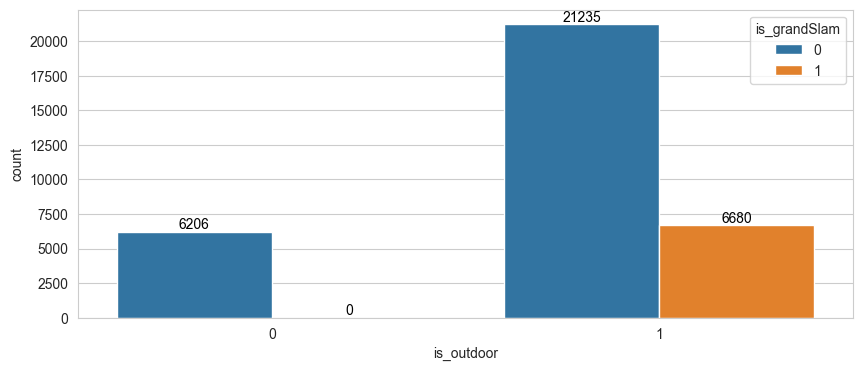

,is_outdoor (%),is_formerTop10 (%)
0,18.19,18.61
1,81.81,19.04


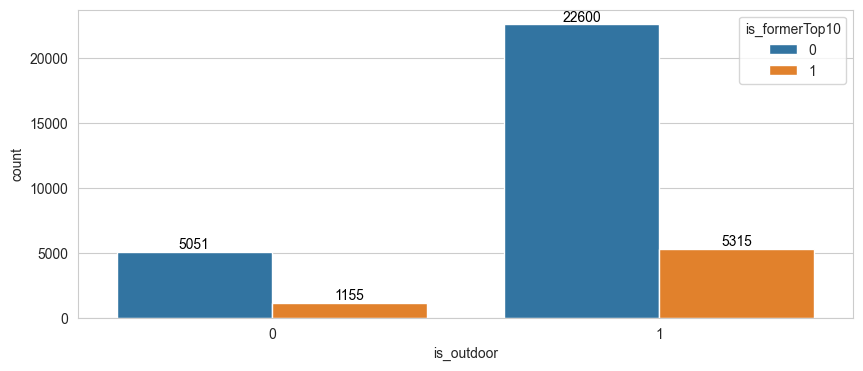

,is_outdoor (%),diff_homeAdvantage (%)
0,18.19,0.34
1,81.81,-0.06


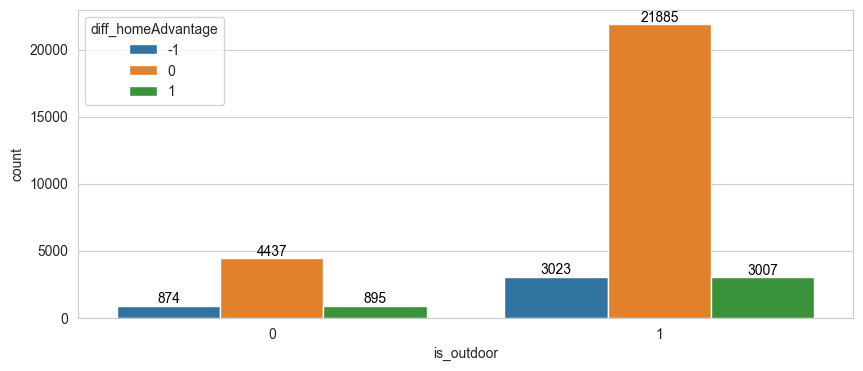

,is_outdoor (%),diff_surfaceAdvantage (%)
0,18.19,-1.05
1,81.81,0.72


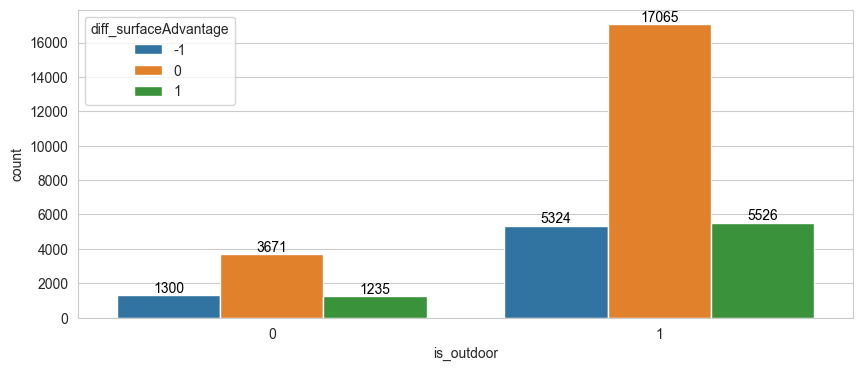

,is_outdoor (%),ord_tourneyLevel (%)
0,18.19,117.18
1,81.81,195.07


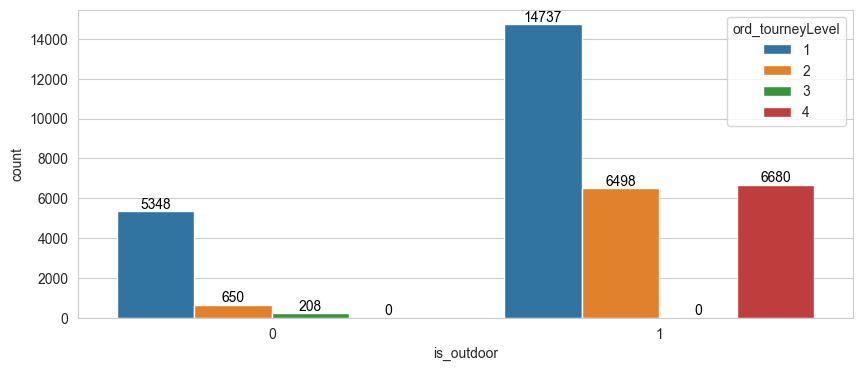

,is_outdoor (%),is_outdoor (%)
0,18.19,0.00
1,81.81,100.00


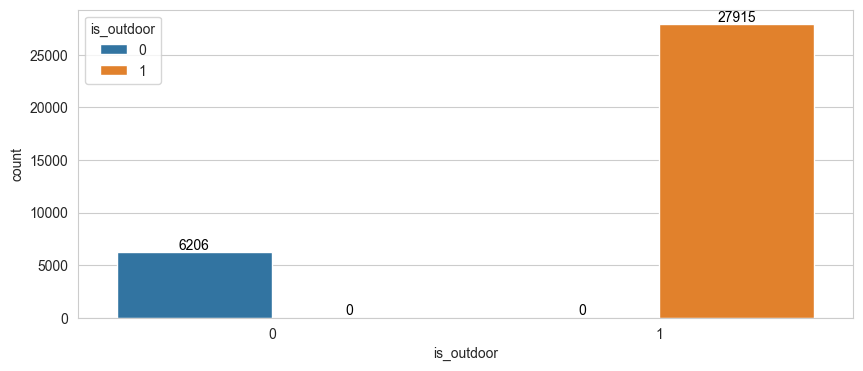

,is_outdoor (%),surface_Clay (%)
0,18.19,4.66
1,81.81,36.90


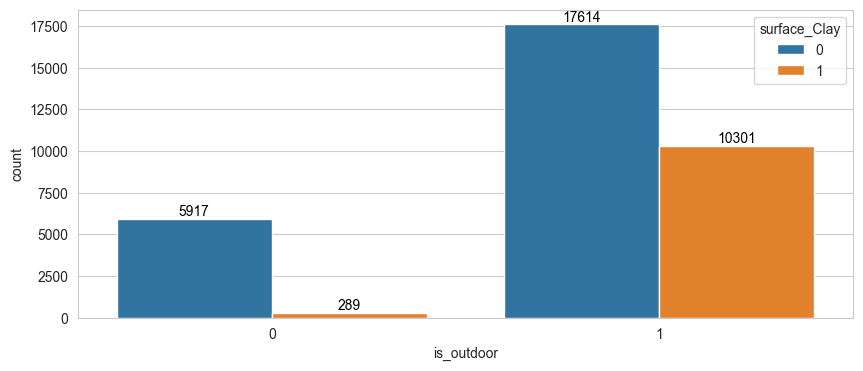

,is_outdoor (%),surface_Grass (%)
0,18.19,0.00
1,81.81,13.91


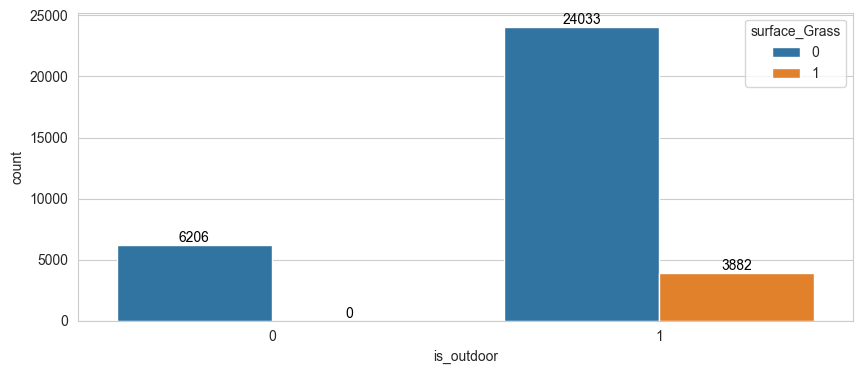

,is_outdoor (%),surface_Hard (%)
0,18.19,95.34
1,81.81,49.19


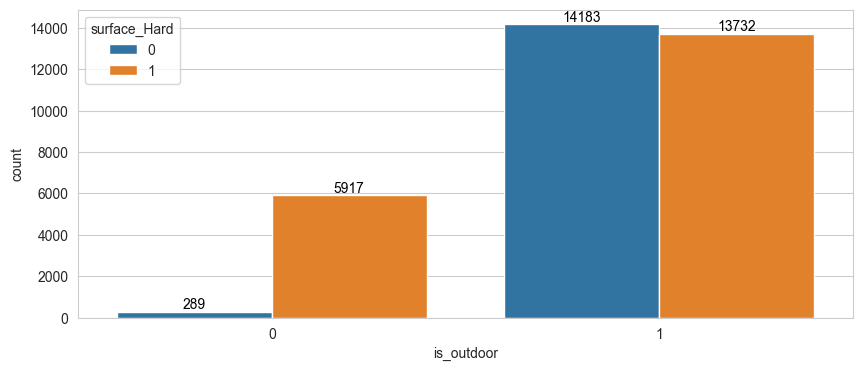

,is_outdoor (%),ord_drawSize (%)
0,18.19,385.98
1,81.81,600.79


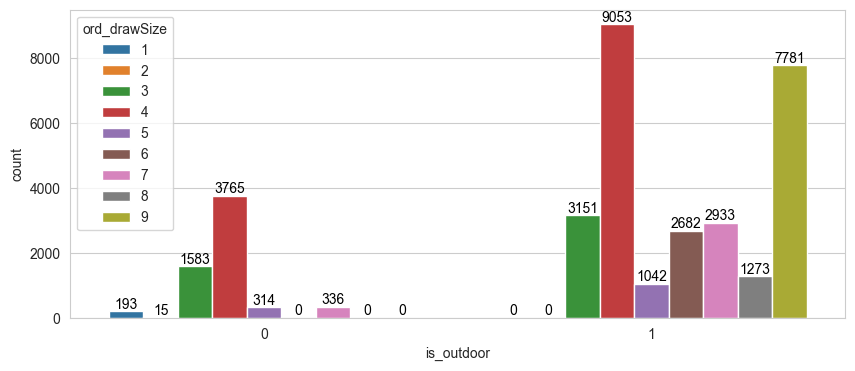

,is_outdoor (%),ord_round (%)
0,18.19,388.53
1,81.81,310.68


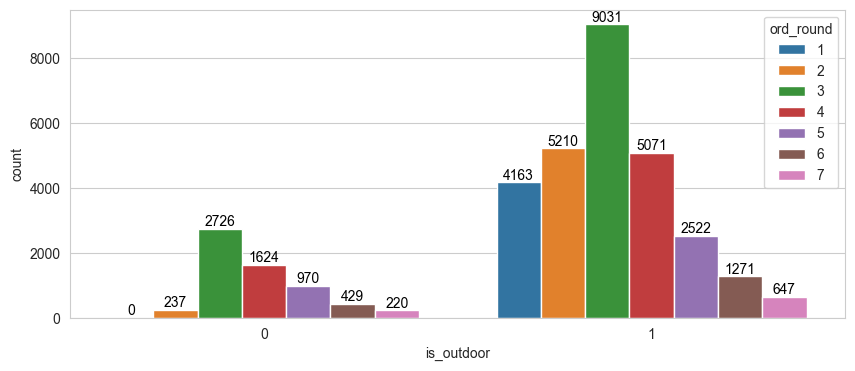

,is_outdoor (%),handedness_L (%)
0,18.19,1.43
1,81.81,2.00


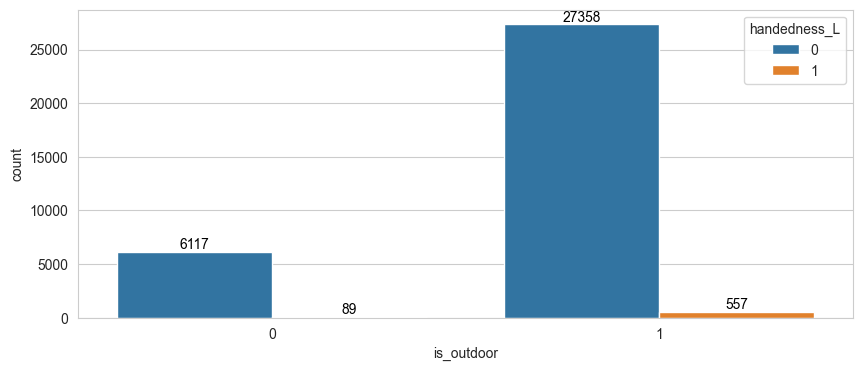

,is_outdoor (%),handedness_LR (%)
0,18.19,10.81
1,81.81,11.97


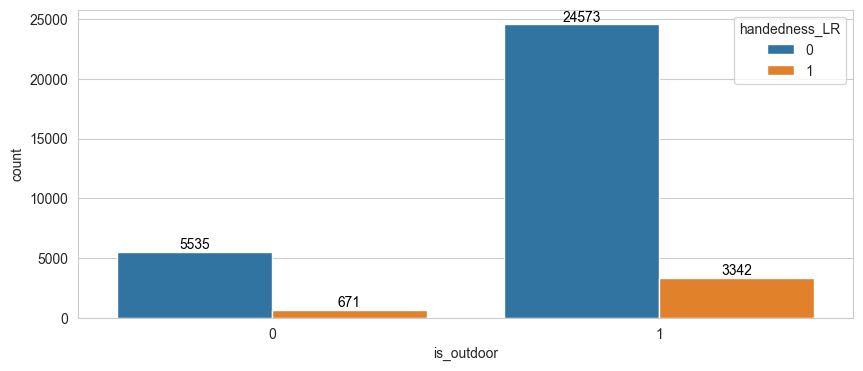

,is_outdoor (%),handedness_R (%)
0,18.19,75.59
1,81.81,73.77


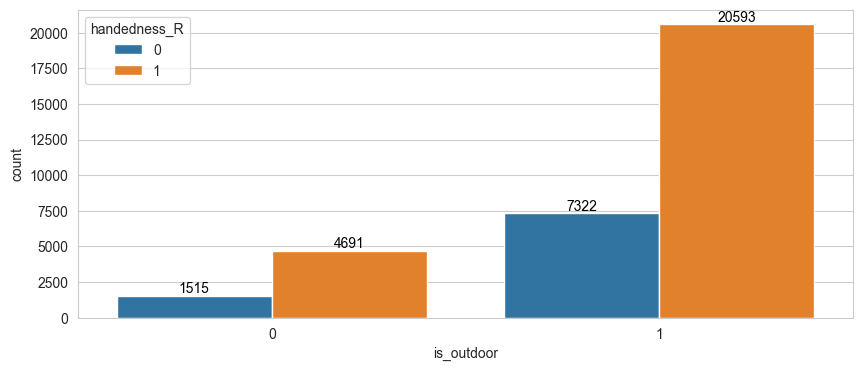

,is_outdoor (%),handedness_RL (%)
0,18.19,12.17
1,81.81,12.26


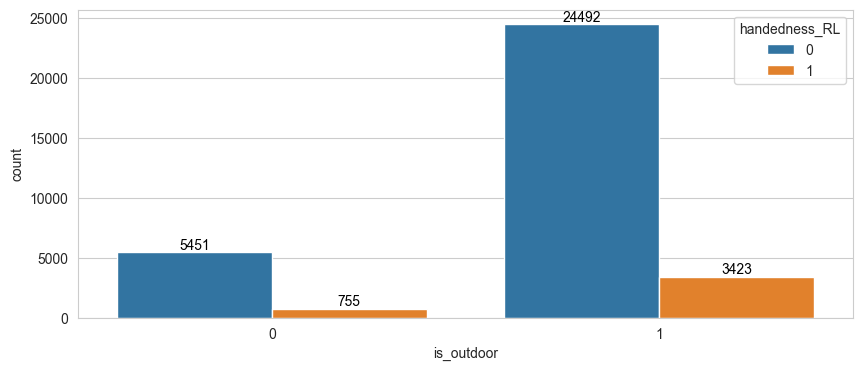

,is_outdoor (%),favorite_won (%)
0,18.19,65.23
1,81.81,66.14


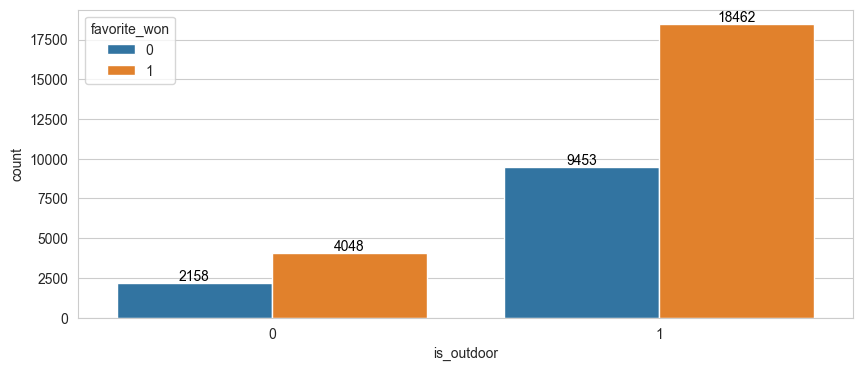

,surface_Clay (%),favorite_won (%)
0,68.96,66.38
1,31.04,65.05


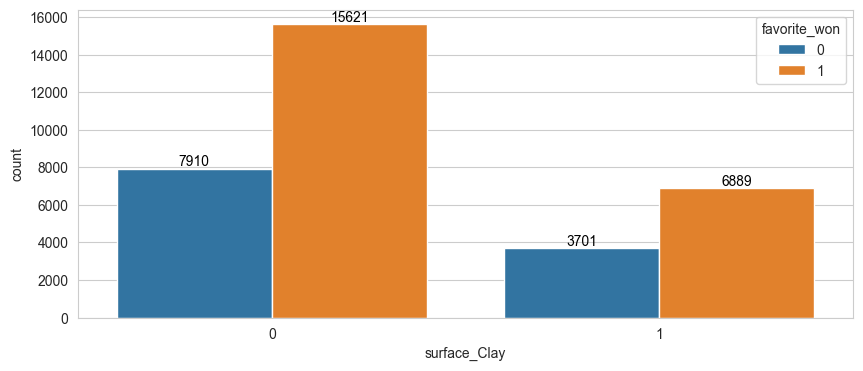

,surface_Clay (%),is_grandSlam (%)
0,68.96,21.08
1,31.04,16.23


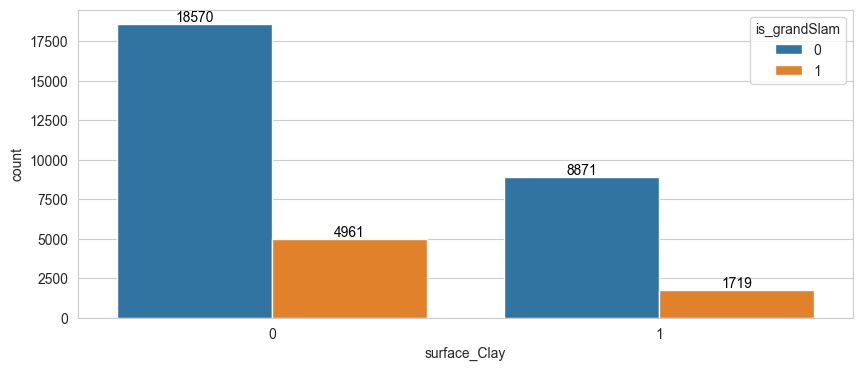

,surface_Clay (%),is_formerTop10 (%)
0,68.96,20.19
1,31.04,16.24


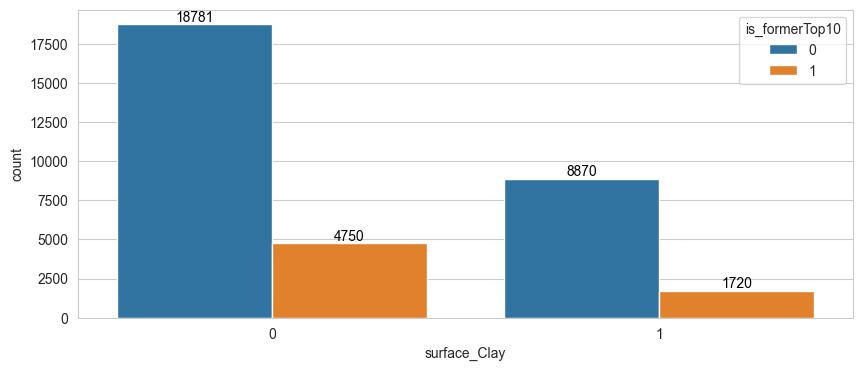

,surface_Clay (%),diff_homeAdvantage (%)
0,68.96,0.11
1,31.04,-0.19


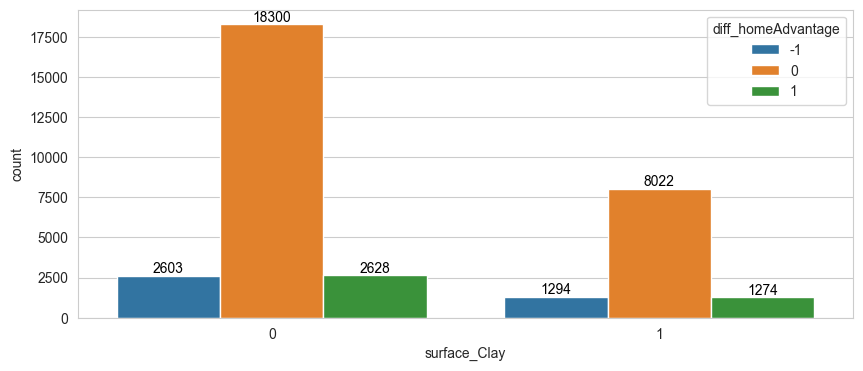

,surface_Clay (%),diff_surfaceAdvantage (%)
0,68.96,0.03
1,31.04,1.24


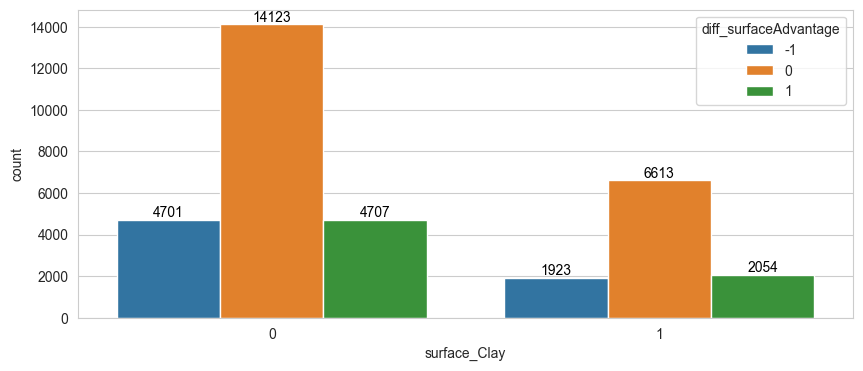

,surface_Clay (%),ord_tourneyLevel (%)
0,68.96,186.38
1,31.04,168.73


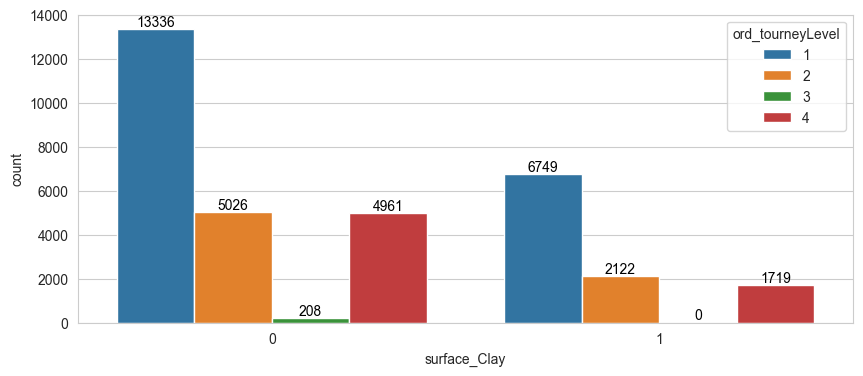

,surface_Clay (%),is_outdoor (%)
0,68.96,74.85
1,31.04,97.27


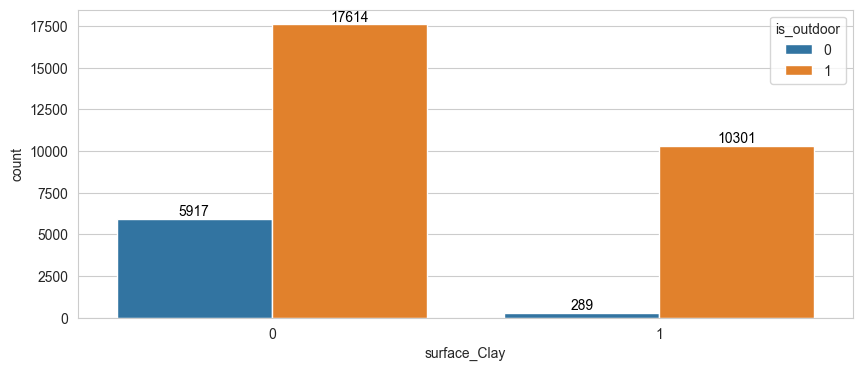

,surface_Clay (%),surface_Clay (%)
0,68.96,0.00
1,31.04,100.00


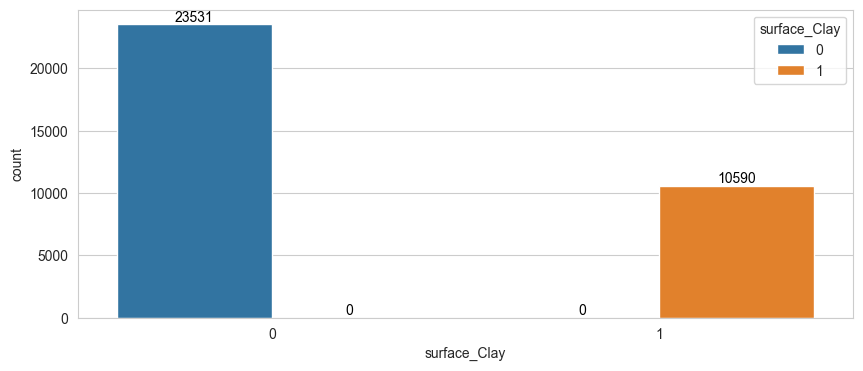

,surface_Clay (%),surface_Grass (%)
0,68.96,16.50
1,31.04,0.00


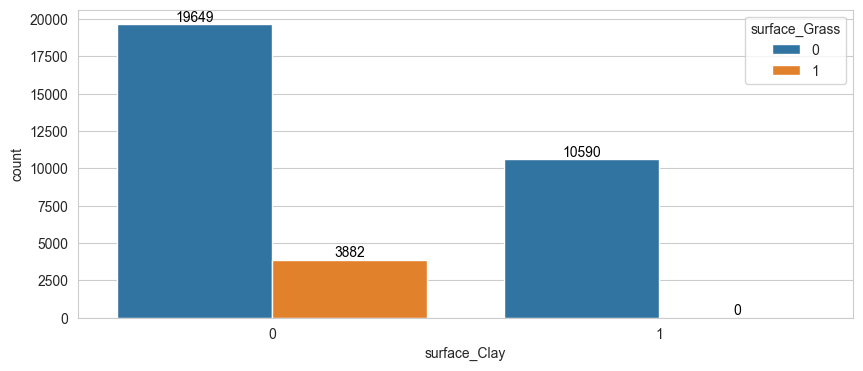

,surface_Clay (%),surface_Hard (%)
0,68.96,83.50
1,31.04,0.00


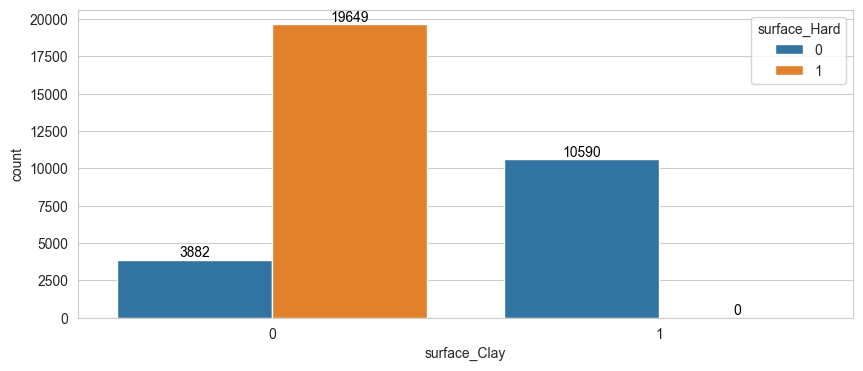

,surface_Clay (%),ord_drawSize (%)
0,68.96,577.66
1,31.04,526.31


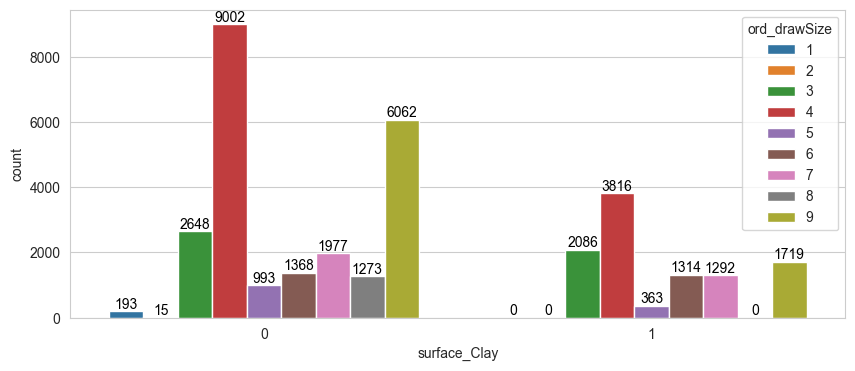

,surface_Clay (%),ord_round (%)
0,68.96,319.29
1,31.04,337.17


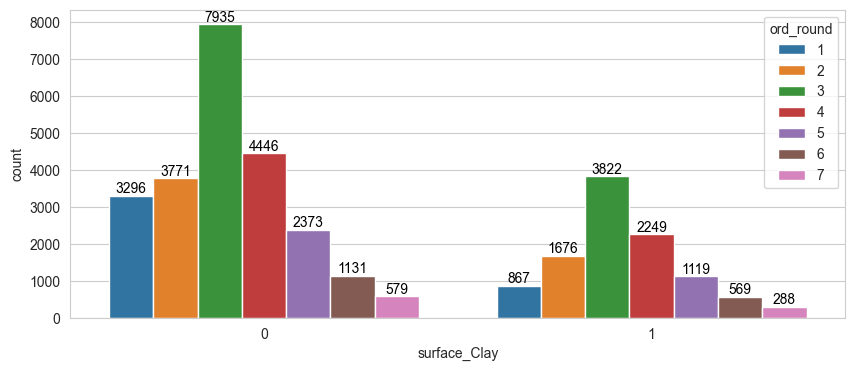

,surface_Clay (%),handedness_L (%)
0,68.96,1.61
1,31.04,2.53


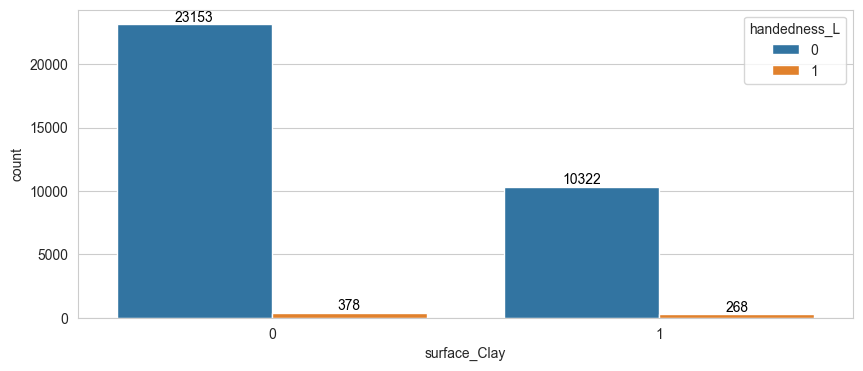

,surface_Clay (%),handedness_LR (%)
0,68.96,10.92
1,31.04,13.64


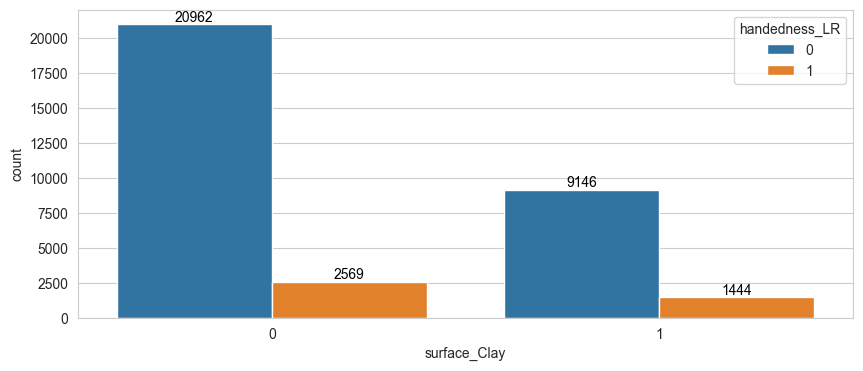

,surface_Clay (%),handedness_R (%)
0,68.96,75.49
1,31.04,71.01


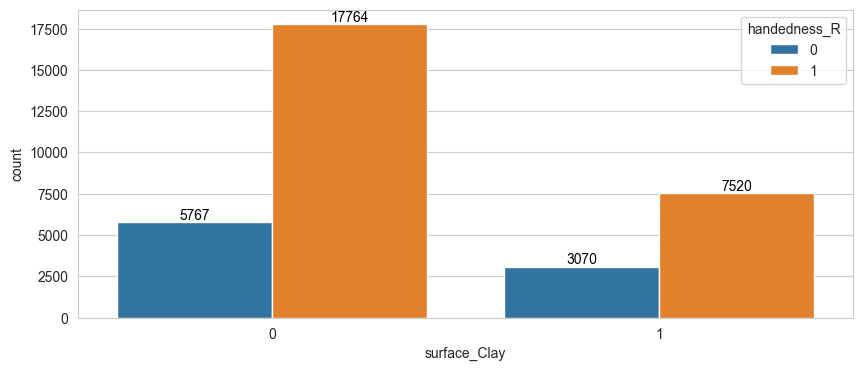

,surface_Clay (%),handedness_RL (%)
0,68.96,11.98
1,31.04,12.82


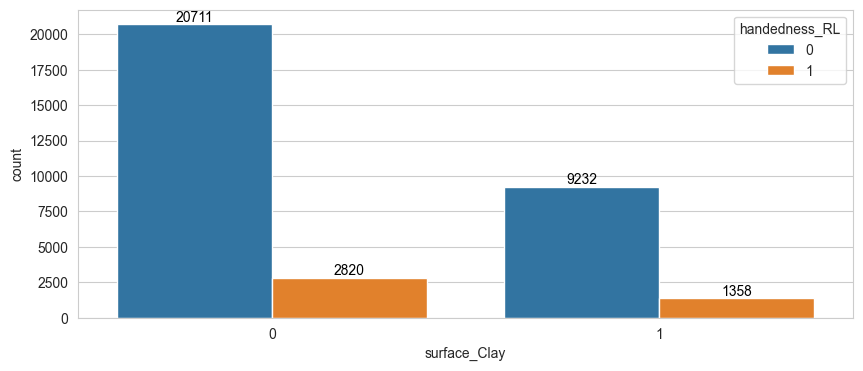

,surface_Clay (%),favorite_won (%)
0,68.96,66.38
1,31.04,65.05


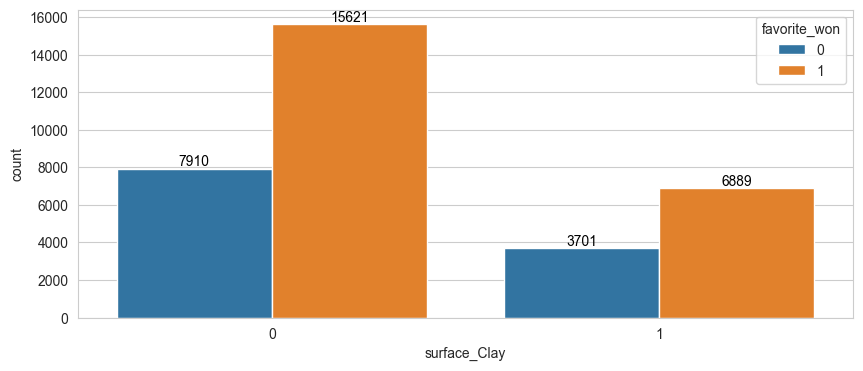

,surface_Grass (%),favorite_won (%)
0,88.62,65.98
1,11.38,65.89


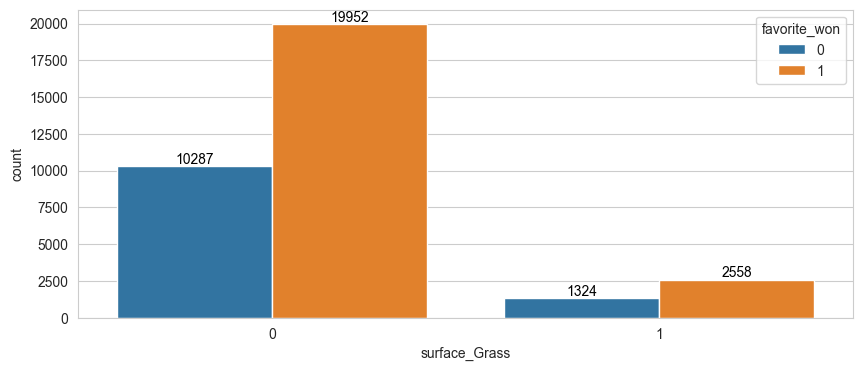

,surface_Grass (%),is_grandSlam (%)
0,88.62,16.84
1,11.38,40.91


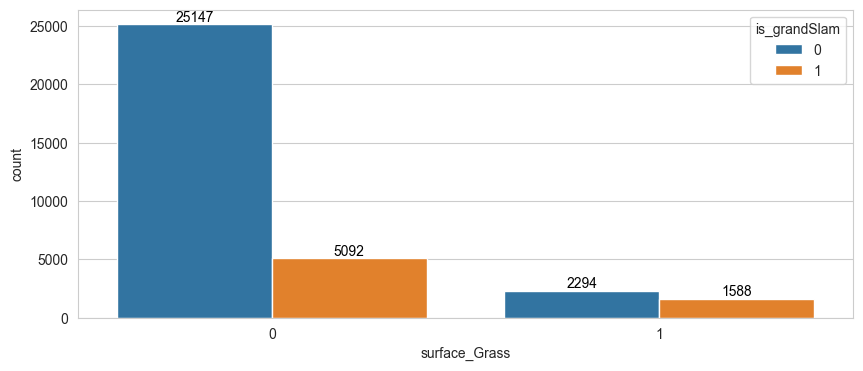

,surface_Grass (%),is_formerTop10 (%)
0,88.62,19.08
1,11.38,18.03


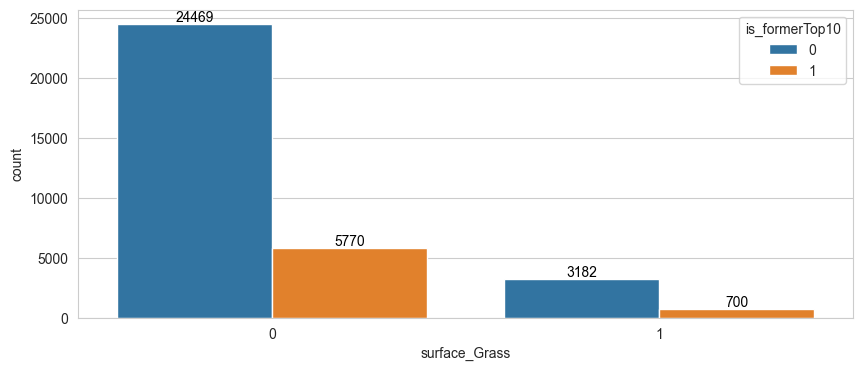

,surface_Grass (%),diff_homeAdvantage (%)
0,88.62,-0.04
1,11.38,0.46


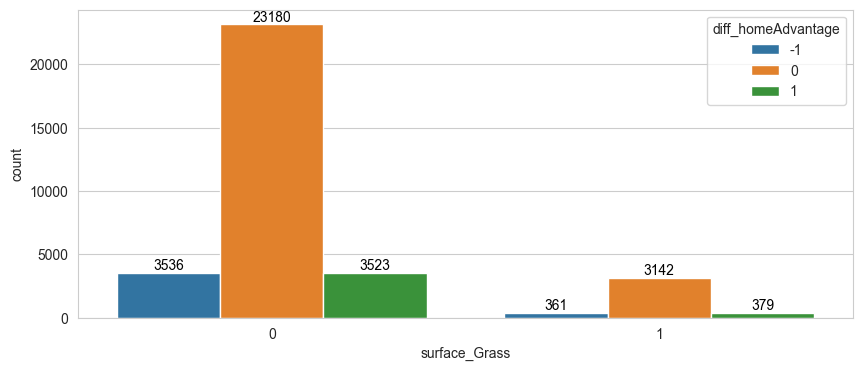

,surface_Grass (%),diff_surfaceAdvantage (%)
0,88.62,0.30
1,11.38,1.18


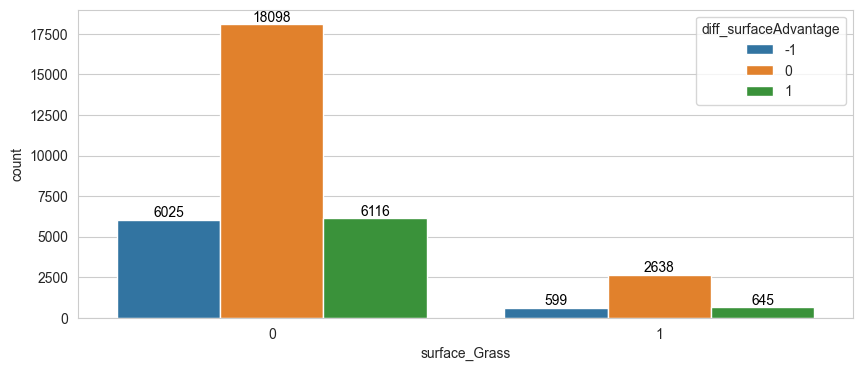

,surface_Grass (%),ord_tourneyLevel (%)
0,88.62,175.53
1,11.38,222.72


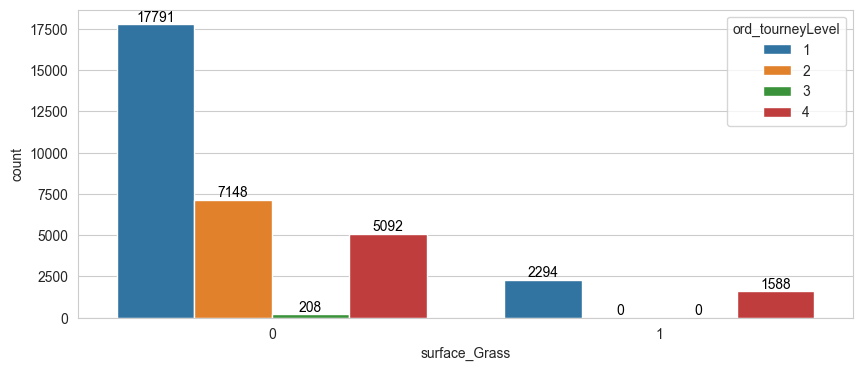

,surface_Grass (%),is_outdoor (%)
0,88.62,79.48
1,11.38,100.00


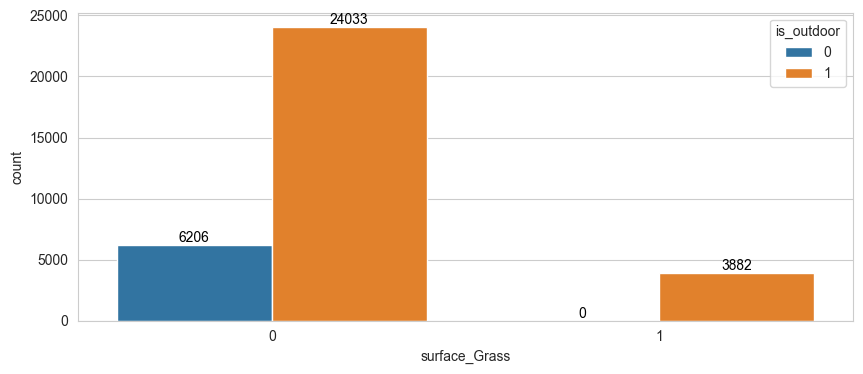

,surface_Grass (%),surface_Clay (%)
0,88.62,35.02
1,11.38,0.00


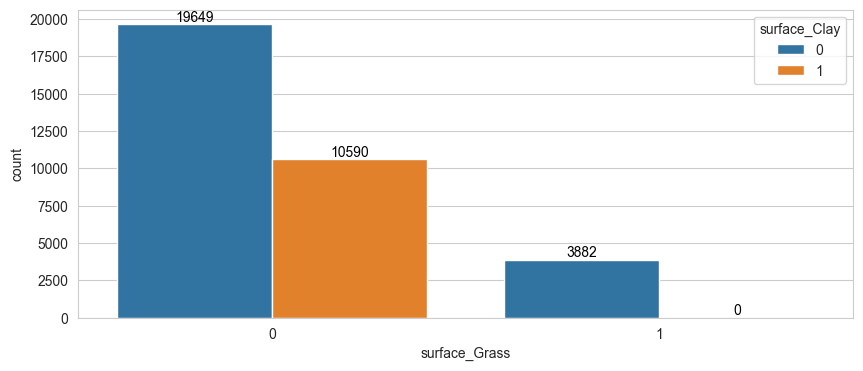

,surface_Grass (%),surface_Grass (%)
0,88.62,0.00
1,11.38,100.00


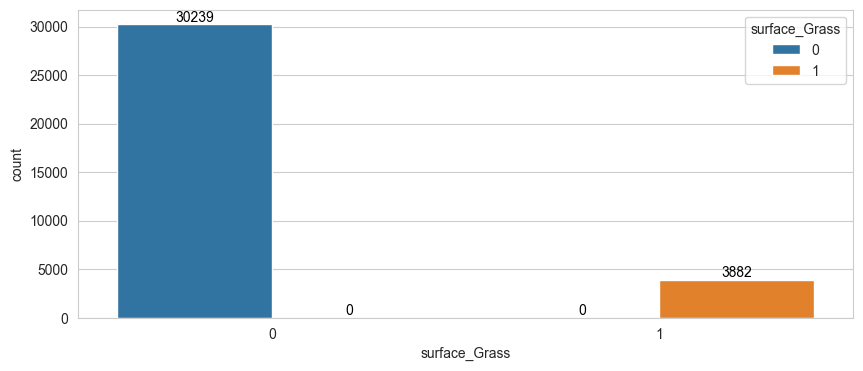

,surface_Grass (%),surface_Hard (%)
0,88.62,64.98
1,11.38,0.00


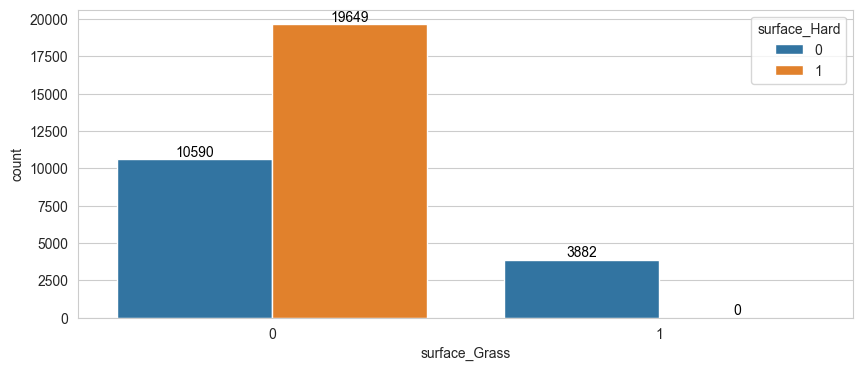

,surface_Grass (%),ord_drawSize (%)
0,88.62,554.32
1,11.38,619.40


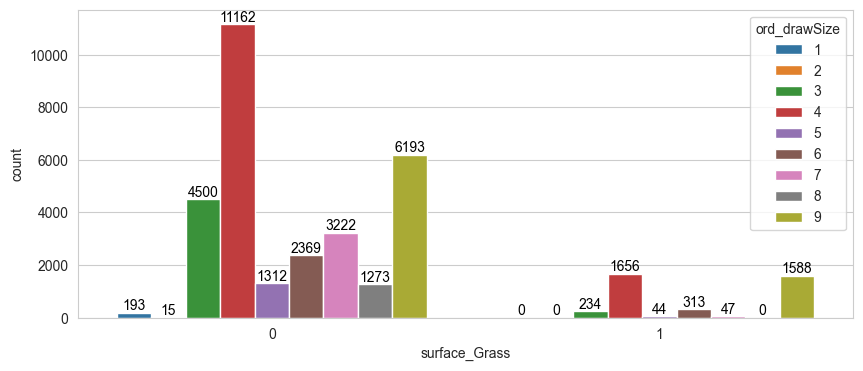

,surface_Grass (%),ord_round (%)
0,88.62,327.86
1,11.38,301.29


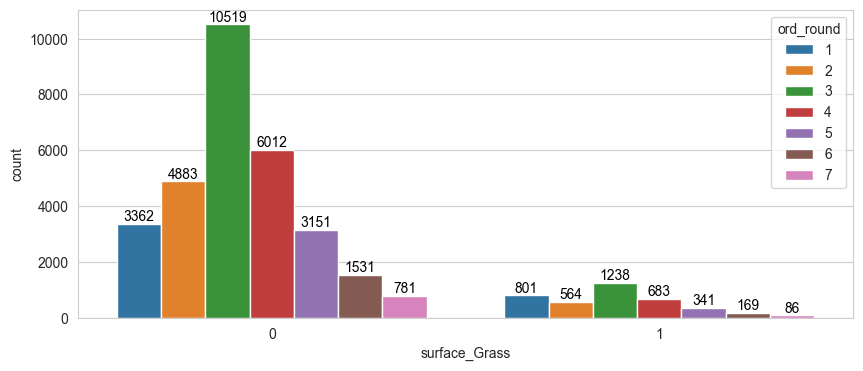

,surface_Grass (%),handedness_L (%)
0,88.62,1.90
1,11.38,1.80


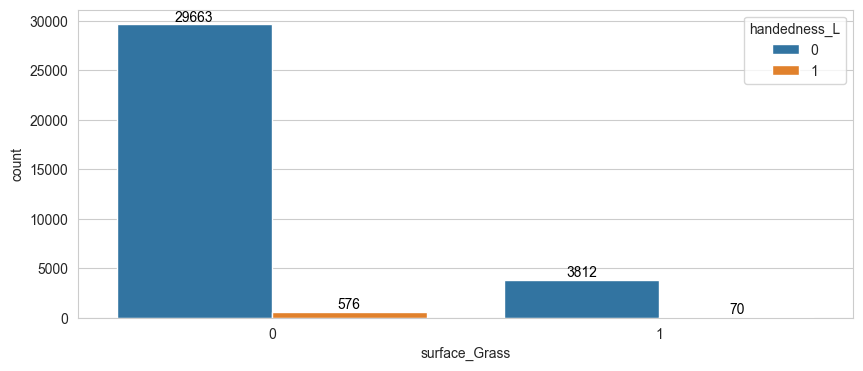

,surface_Grass (%),handedness_LR (%)
0,88.62,11.81
1,11.38,11.41


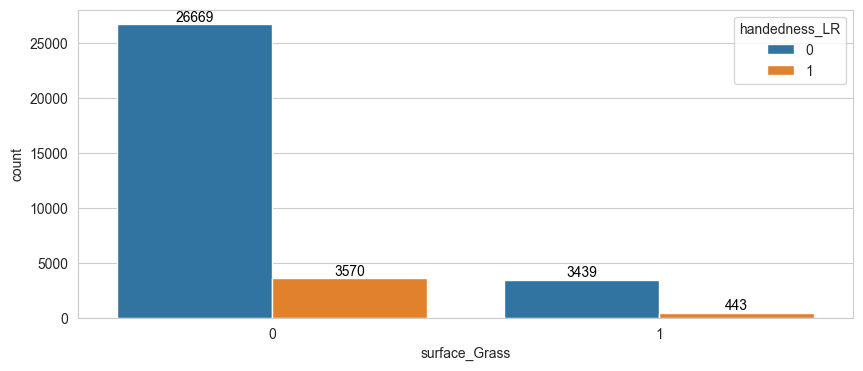

,surface_Grass (%),handedness_R (%)
0,88.62,74.11
1,11.38,74.06


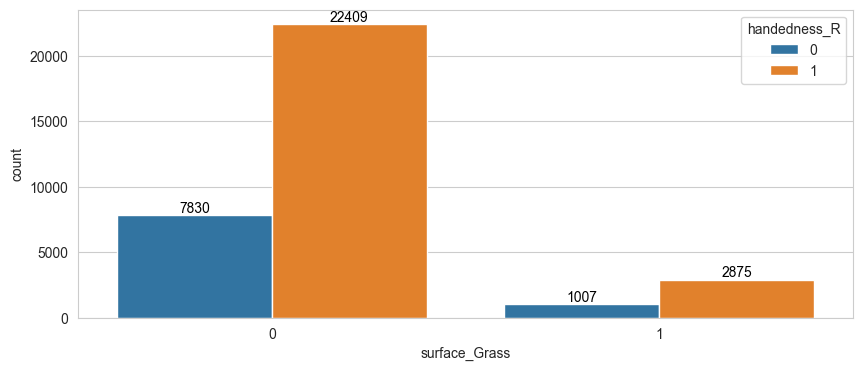

,surface_Grass (%),handedness_RL (%)
0,88.62,12.18
1,11.38,12.73


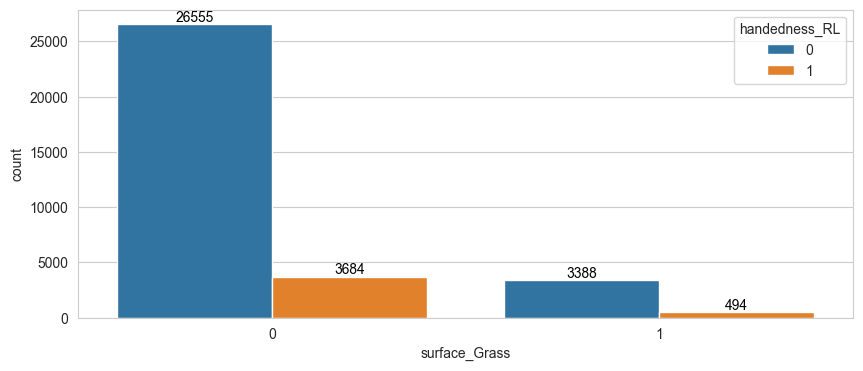

,surface_Grass (%),favorite_won (%)
0,88.62,65.98
1,11.38,65.89


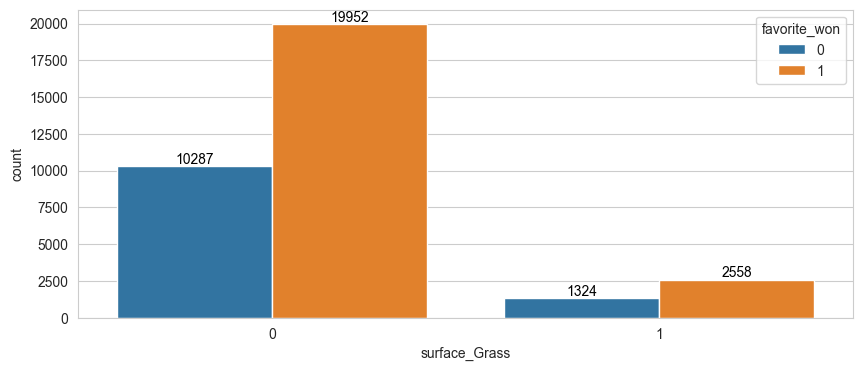

,surface_Hard (%),favorite_won (%)
0,42.41,65.28
1,57.59,66.48


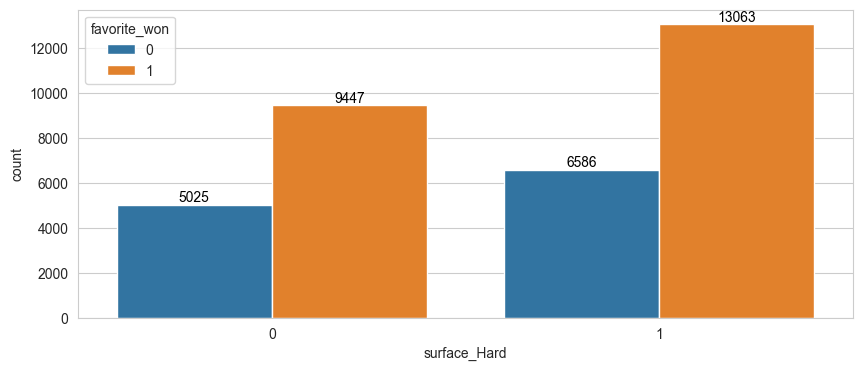

,surface_Hard (%),is_grandSlam (%)
0,42.41,22.85
1,57.59,17.17


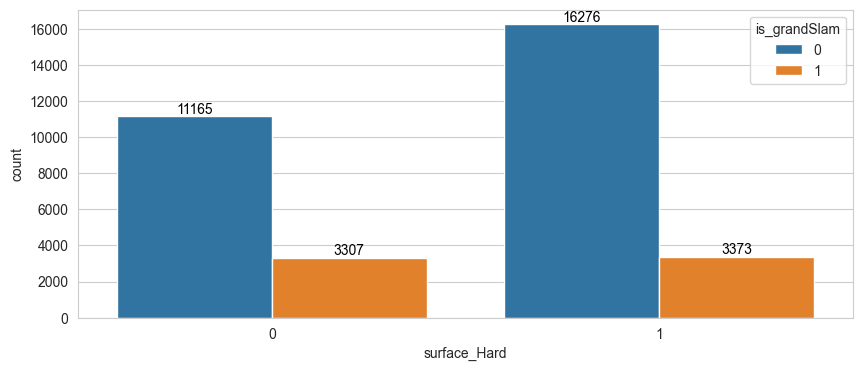

,surface_Hard (%),is_formerTop10 (%)
0,42.41,16.72
1,57.59,20.61


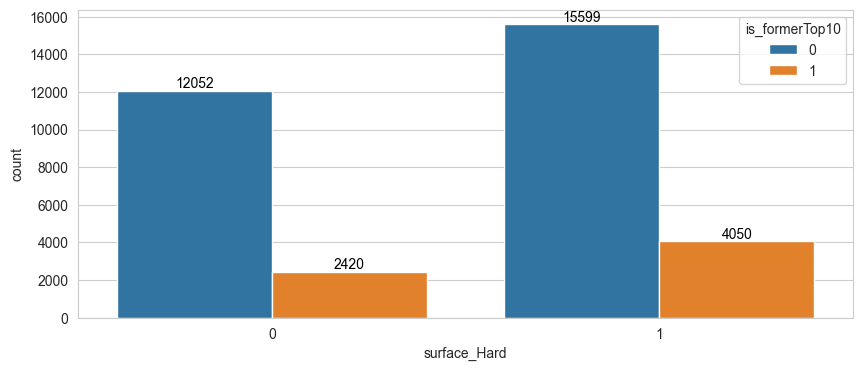

,surface_Hard (%),diff_homeAdvantage (%)
0,42.41,-0.01
1,57.59,0.04


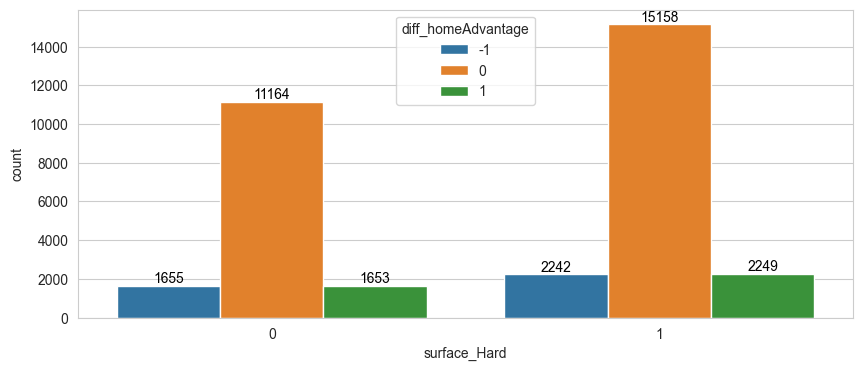

,surface_Hard (%),diff_surfaceAdvantage (%)
0,42.41,1.22
1,57.59,-0.20


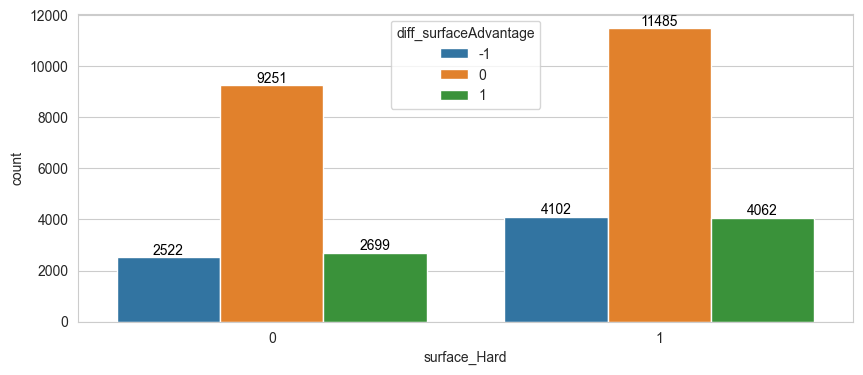

,surface_Hard (%),ord_tourneyLevel (%)
0,42.41,183.22
1,57.59,179.19


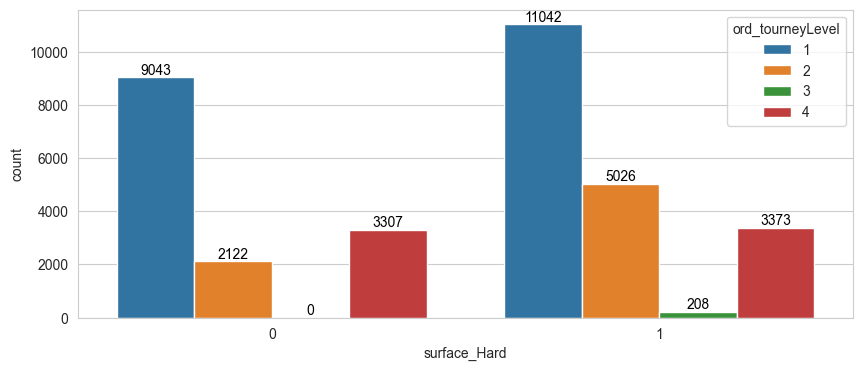

,surface_Hard (%),is_outdoor (%)
0,42.41,98.00
1,57.59,69.89


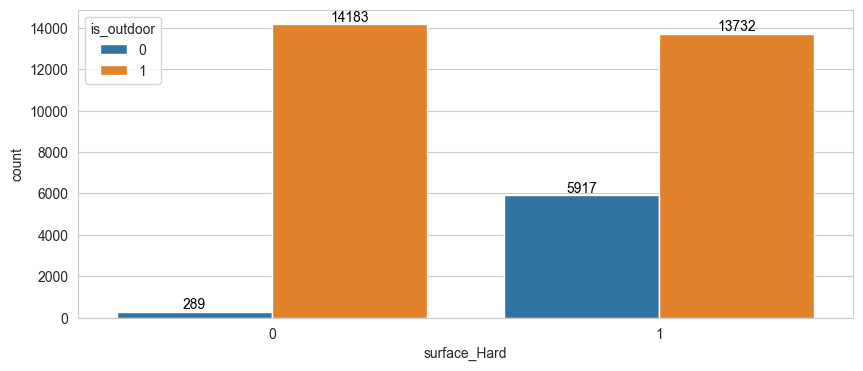

,surface_Hard (%),surface_Clay (%)
0,42.41,73.18
1,57.59,0.00


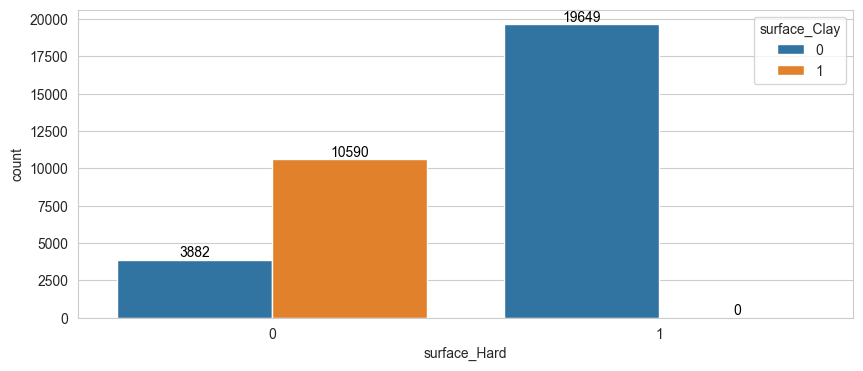

,surface_Hard (%),surface_Grass (%)
0,42.41,26.82
1,57.59,0.00


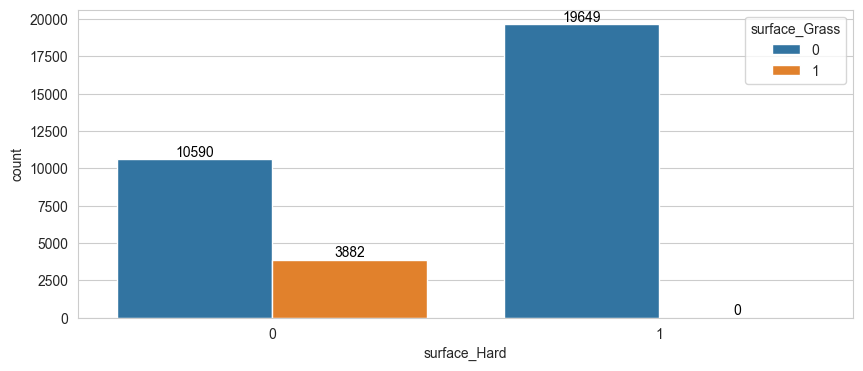

,surface_Hard (%),surface_Hard (%)
0,42.41,0.00
1,57.59,100.00


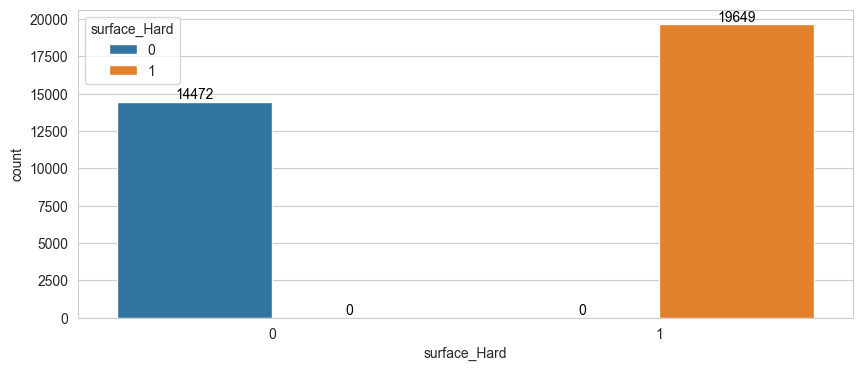

,surface_Hard (%),ord_drawSize (%)
0,42.41,551.28
1,57.59,569.41


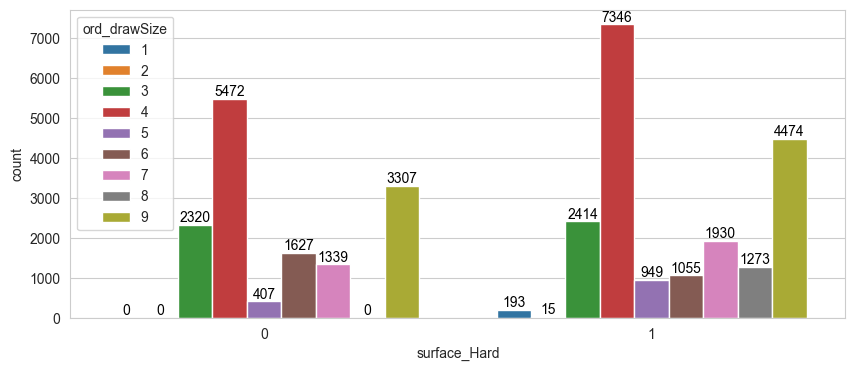

,surface_Hard (%),ord_round (%)
0,42.41,327.54
1,57.59,322.84


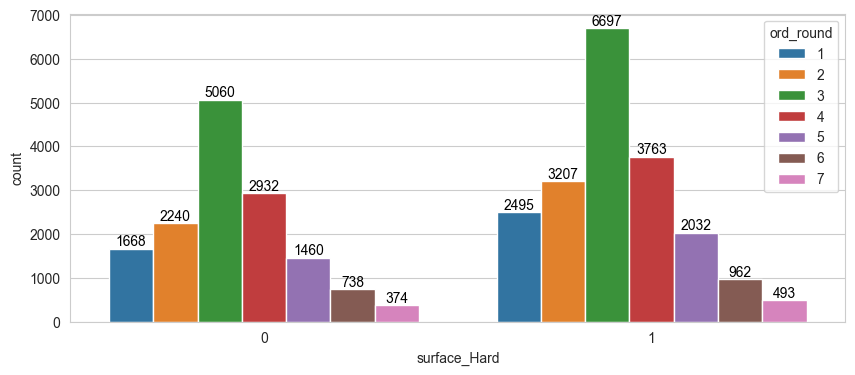

,surface_Hard (%),handedness_L (%)
0,42.41,2.34
1,57.59,1.57


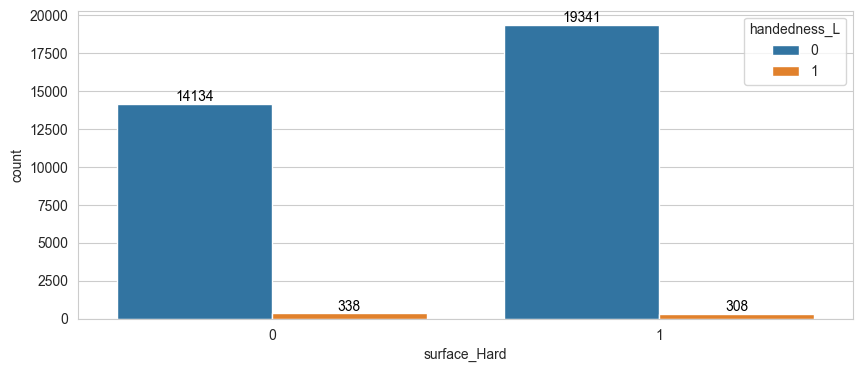

,surface_Hard (%),handedness_LR (%)
0,42.41,13.04
1,57.59,10.82


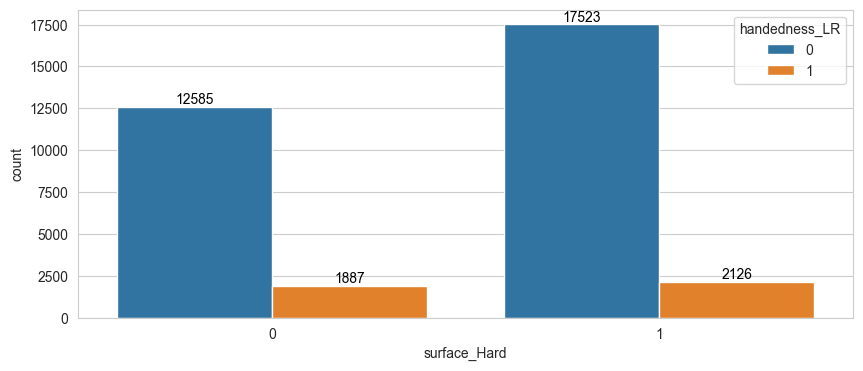

,surface_Hard (%),handedness_R (%)
0,42.41,71.83
1,57.59,75.77


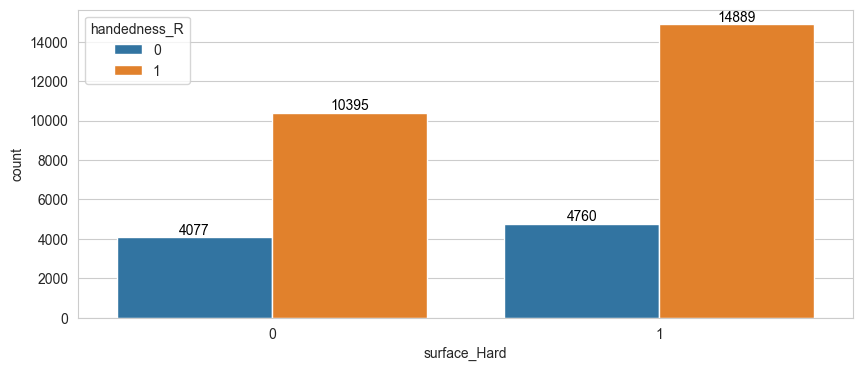

,surface_Hard (%),handedness_RL (%)
0,42.41,12.80
1,57.59,11.84


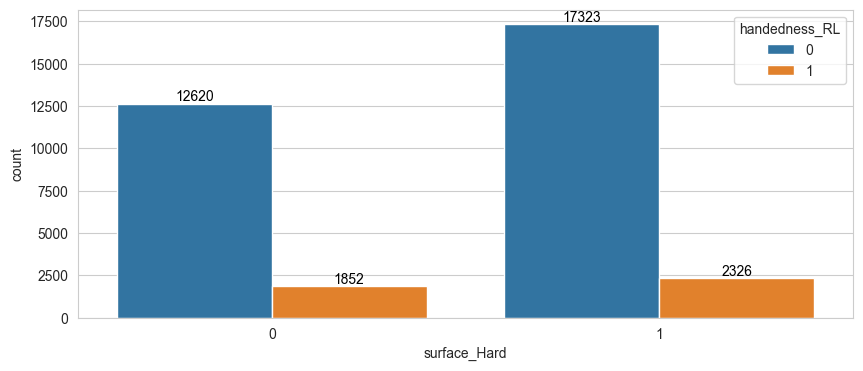

,surface_Hard (%),favorite_won (%)
0,42.41,65.28
1,57.59,66.48


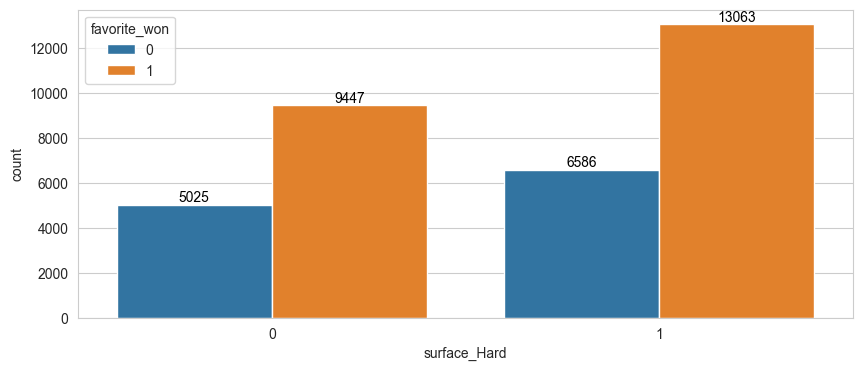

,ord_drawSize (%),favorite_won (%)
1,0.57,68.39
2,0.04,60.00
3,13.87,64.13
4,37.57,63.56
5,3.97,62.39
6,7.86,68.08
7,9.58,63.48
8,3.73,66.85
9,22.80,71.82


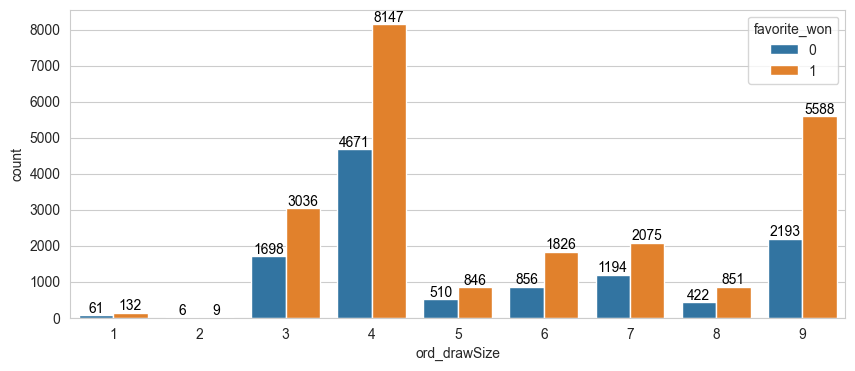

,ord_drawSize (%),is_grandSlam (%)
1,0.57,0.00
2,0.04,0.00
3,13.87,0.00
4,37.57,0.00
5,3.97,0.00
6,7.86,0.00
7,9.58,0.00
8,3.73,0.00
9,22.80,85.85


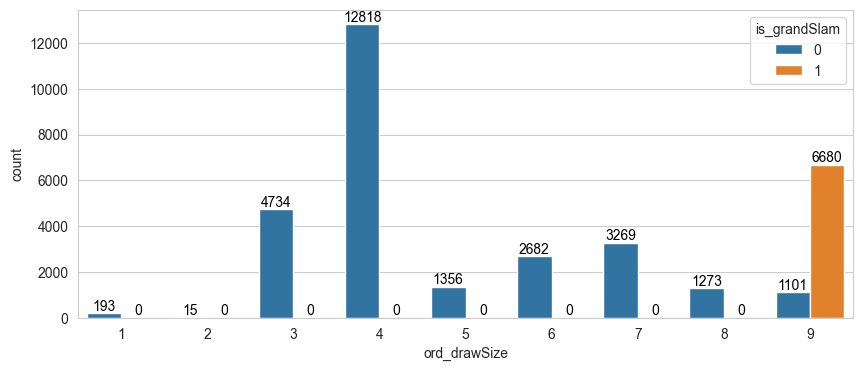

,ord_drawSize (%),is_formerTop10 (%)
1,0.57,100.00
2,0.04,100.00
3,13.87,7.63
4,37.57,12.05
5,3.97,17.04
6,7.86,31.51
7,9.58,23.89
8,3.73,28.20
9,22.80,27.50


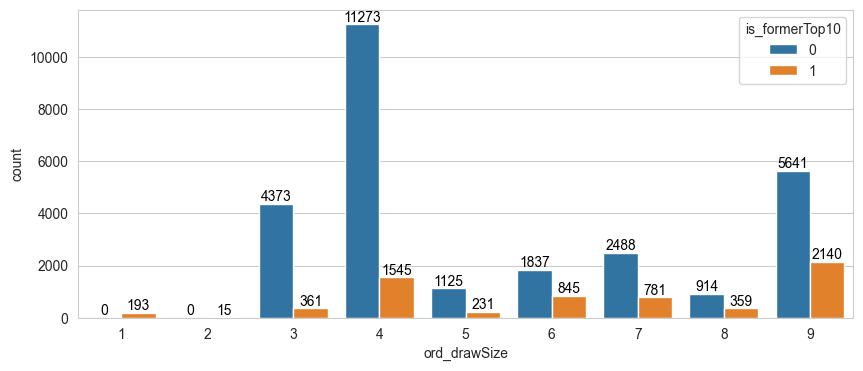

,ord_drawSize (%),diff_homeAdvantage (%)
1,0.57,6.22
2,0.04,6.67
3,13.87,0.15
4,37.57,0.05
5,3.97,-0.29
6,7.86,-0.48
7,9.58,-1.01
8,3.73,-0.86
9,22.80,0.51


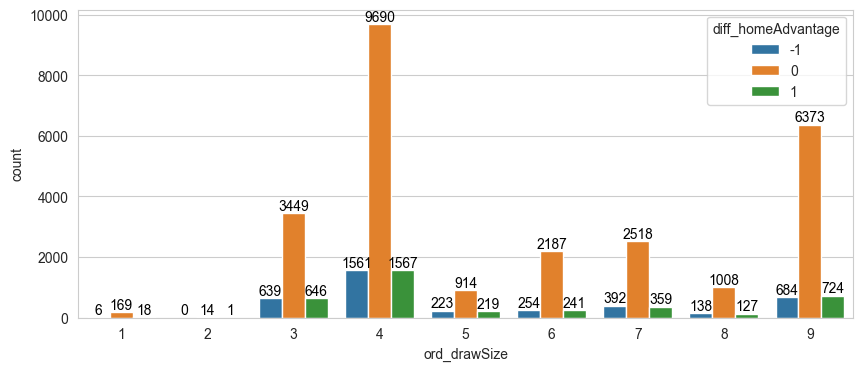

,ord_drawSize (%),diff_surfaceAdvantage (%)
1,0.57,1.04
2,0.04,0.00
3,13.87,-0.15
4,37.57,0.18
5,3.97,0.81
6,7.86,1.86
7,9.58,1.19
8,3.73,-1.73
9,22.80,0.53


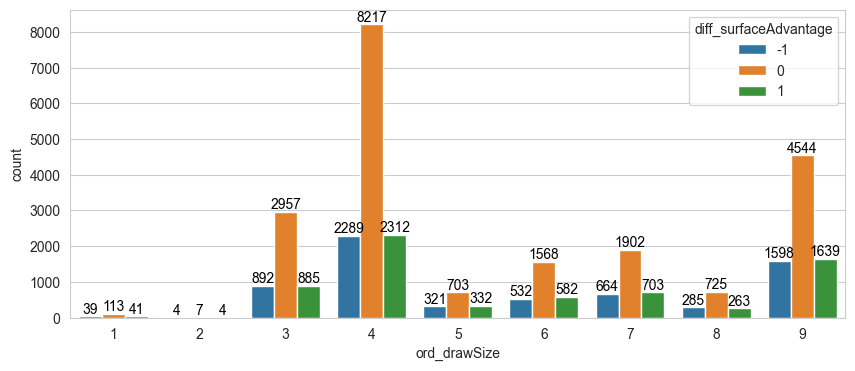

,ord_drawSize (%),ord_tourneyLevel (%)
1,0.57,300.00
2,0.04,300.00
3,13.87,100.00
4,37.57,100.00
5,3.97,126.55
6,7.86,180.61
7,9.58,168.89
8,3.73,200.00
9,22.80,371.70


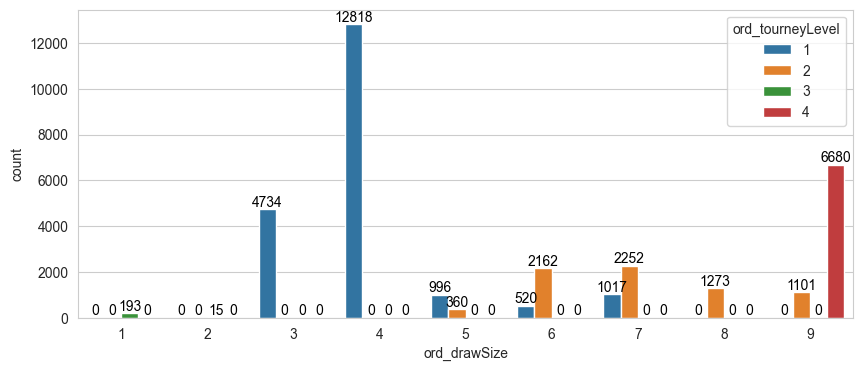

,ord_drawSize (%),is_outdoor (%)
1,0.57,0.00
2,0.04,0.00
3,13.87,66.56
4,37.57,70.63
5,3.97,76.84
6,7.86,100.00
7,9.58,89.72
8,3.73,100.00
9,22.80,100.00


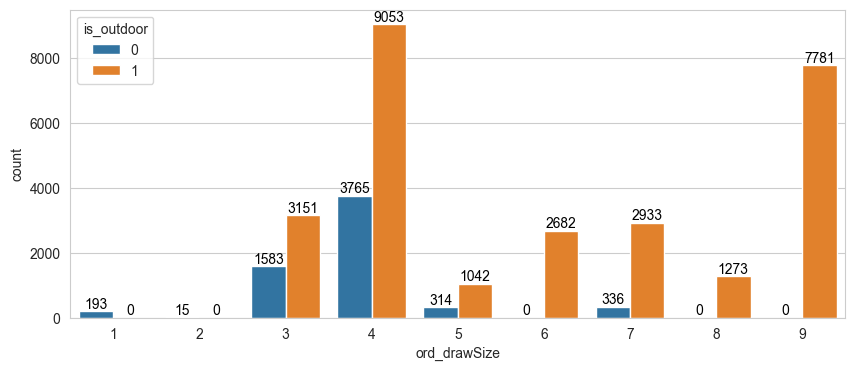

,ord_drawSize (%),surface_Clay (%)
1,0.57,0.00
2,0.04,0.00
3,13.87,44.06
4,37.57,29.77
5,3.97,26.77
6,7.86,48.99
7,9.58,39.52
8,3.73,0.00
9,22.80,22.09


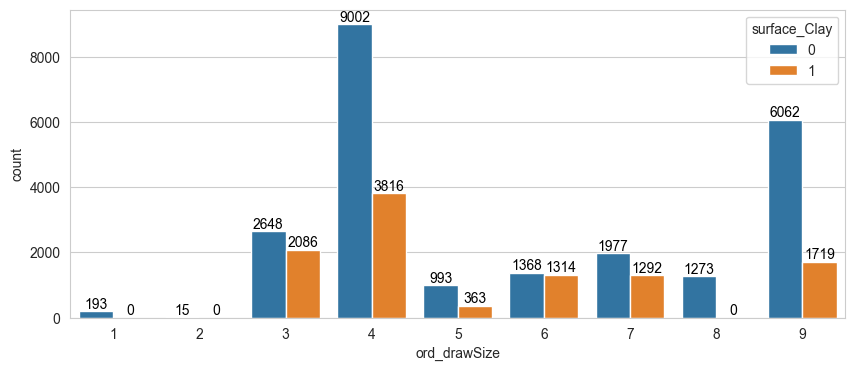

,ord_drawSize (%),surface_Grass (%)
1,0.57,0.00
2,0.04,0.00
3,13.87,4.94
4,37.57,12.92
5,3.97,3.24
6,7.86,11.67
7,9.58,1.44
8,3.73,0.00
9,22.80,20.41


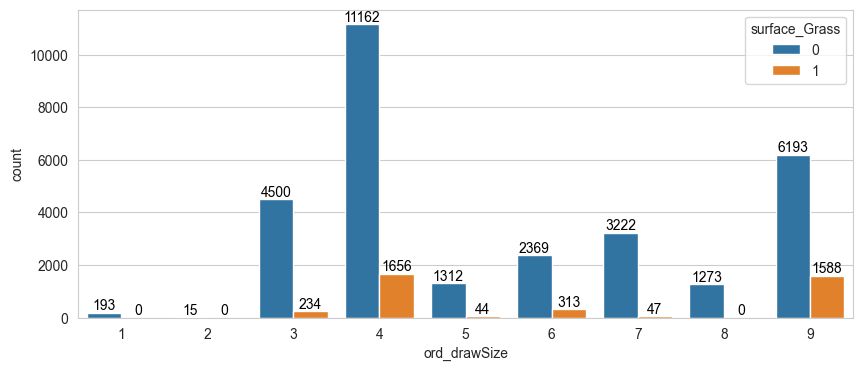

,ord_drawSize (%),surface_Hard (%)
1,0.57,100.00
2,0.04,100.00
3,13.87,50.99
4,37.57,57.31
5,3.97,69.99
6,7.86,39.34
7,9.58,59.04
8,3.73,100.00
9,22.80,57.50


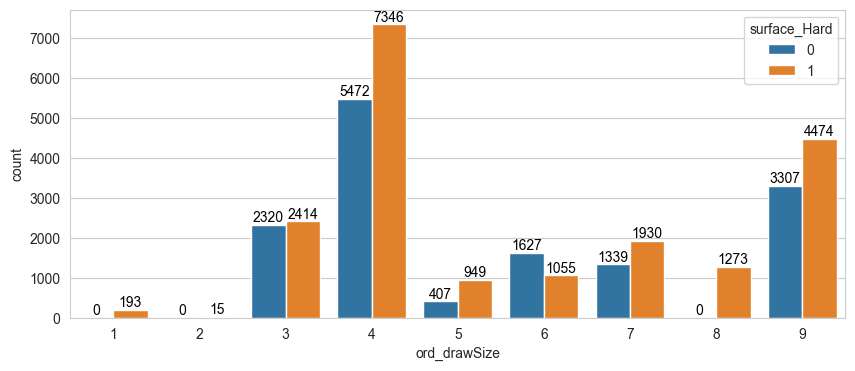

,ord_drawSize (%),ord_drawSize (%)
1,0.57,100.00
2,0.04,200.00
3,13.87,300.00
4,37.57,400.00
5,3.97,500.00
6,7.86,600.00
7,9.58,700.00
8,3.73,800.00
9,22.80,900.00


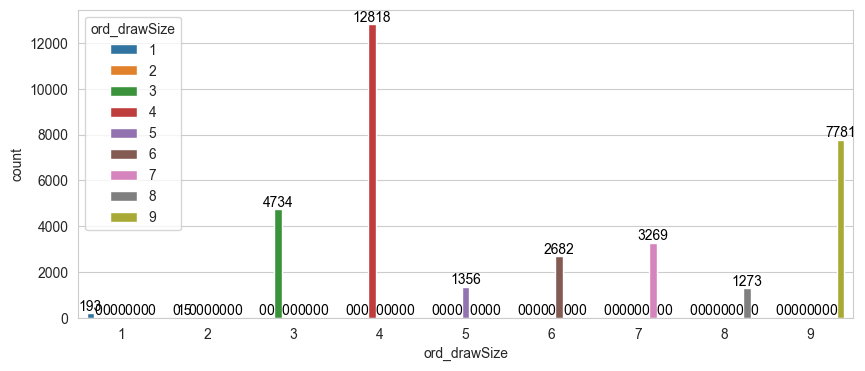

,ord_drawSize (%),ord_round (%)
1,0.57,525.91
2,0.04,526.67
3,13.87,396.68
4,37.57,389.95
5,3.97,321.17
6,7.86,303.13
7,9.58,309.54
8,3.73,226.16
9,22.80,199.16


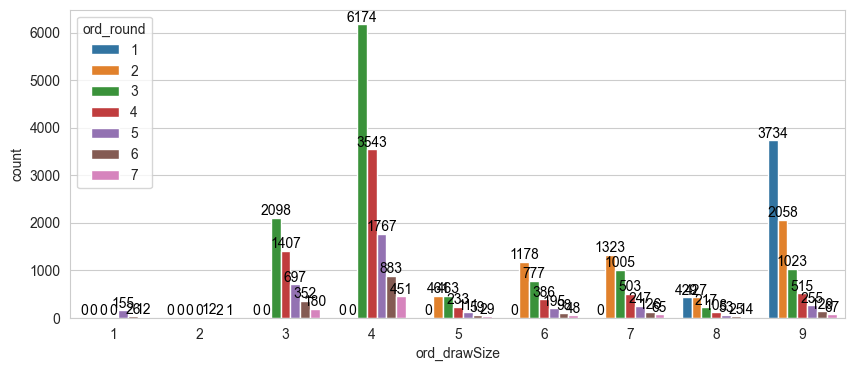

,ord_drawSize (%),handedness_L (%)
1,0.57,0.00
2,0.04,0.00
3,13.87,2.05
4,37.57,2.05
5,3.97,1.47
6,7.86,1.75
7,9.58,1.77
8,3.73,2.28
9,22.80,1.70


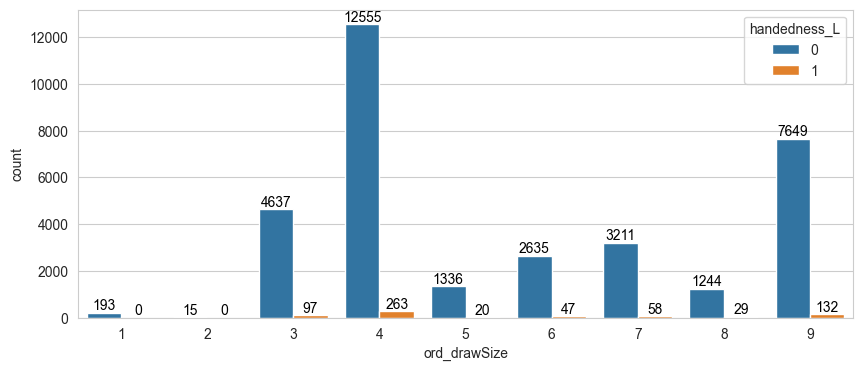

,ord_drawSize (%),handedness_LR (%)
1,0.57,12.95
2,0.04,20.00
3,13.87,11.93
4,37.57,11.64
5,3.97,11.14
6,7.86,13.20
7,9.58,11.01
8,3.73,13.12
9,22.80,11.52


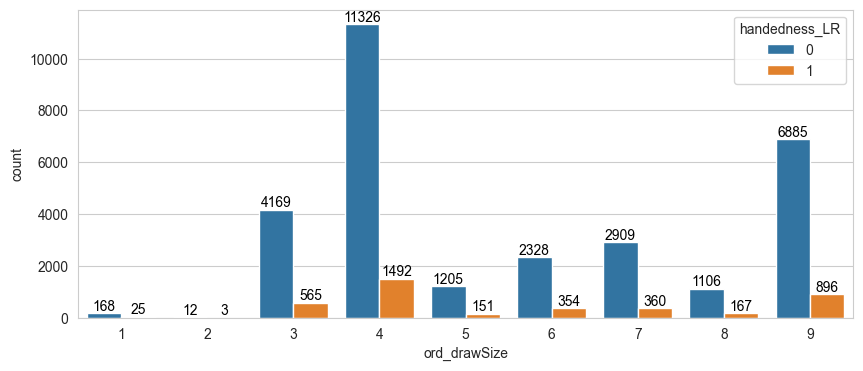

,ord_drawSize (%),handedness_R (%)
1,0.57,82.90
2,0.04,80.00
3,13.87,73.91
4,37.57,73.47
5,3.97,75.81
6,7.86,73.90
7,9.58,75.25
8,3.73,73.92
9,22.80,74.33


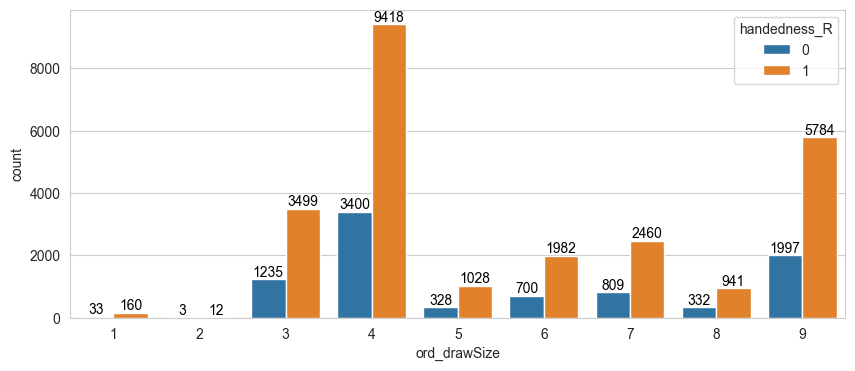

,ord_drawSize (%),handedness_RL (%)
1,0.57,4.15
2,0.04,0.00
3,13.87,12.10
4,37.57,12.83
5,3.97,11.58
6,7.86,11.15
7,9.58,11.96
8,3.73,10.68
9,22.80,12.45


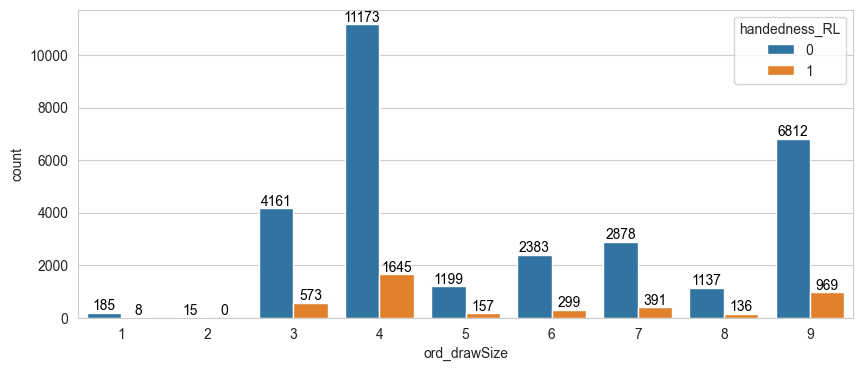

,ord_drawSize (%),favorite_won (%)
1,0.57,68.39
2,0.04,60.00
3,13.87,64.13
4,37.57,63.56
5,3.97,62.39
6,7.86,68.08
7,9.58,63.48
8,3.73,66.85
9,22.80,71.82


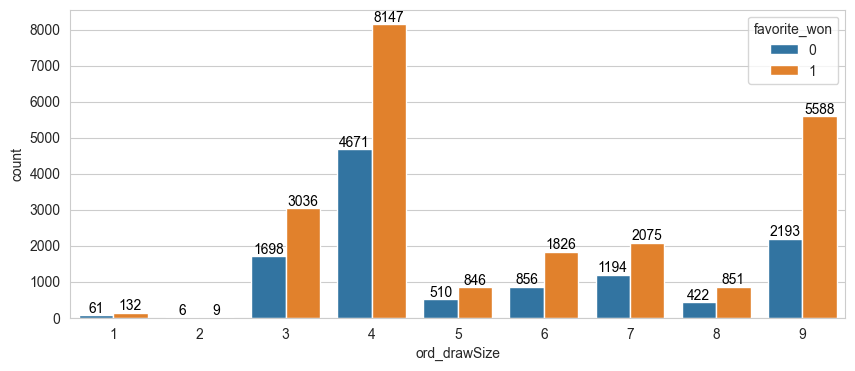

,ord_round (%),favorite_won (%)
1,12.20,67.62
2,15.96,66.61
3,34.46,65.02
4,19.62,67.48
5,10.23,65.12
6,4.98,63.29
7,2.54,64.01


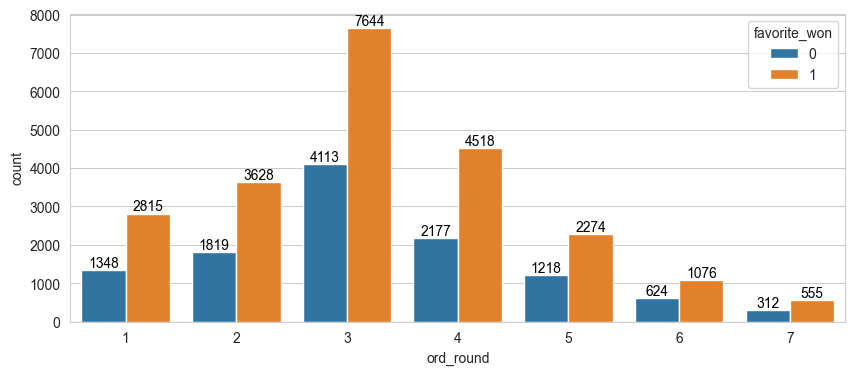

,ord_round (%),is_grandSlam (%)
1,12.20,80.71
2,15.96,31.03
3,34.46,7.12
4,19.62,6.30
5,10.23,6.01
6,4.98,6.24
7,2.54,6.34


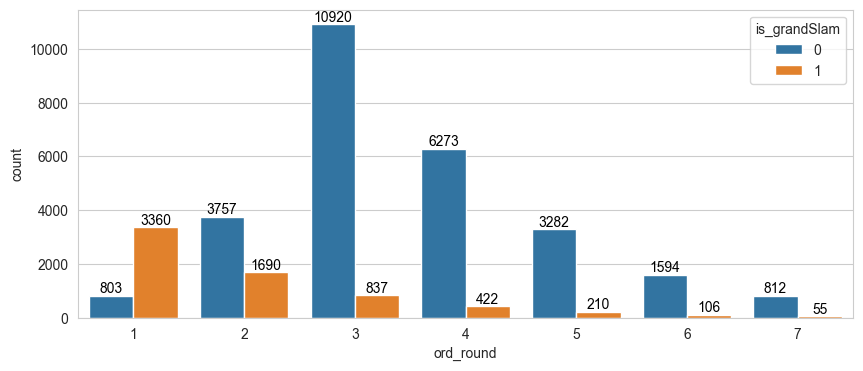

,ord_round (%),is_formerTop10 (%)
1,12.20,8.70
2,15.96,11.62
3,34.46,11.63
4,19.62,24.02
5,10.23,37.69
6,4.98,43.35
7,2.54,51.56


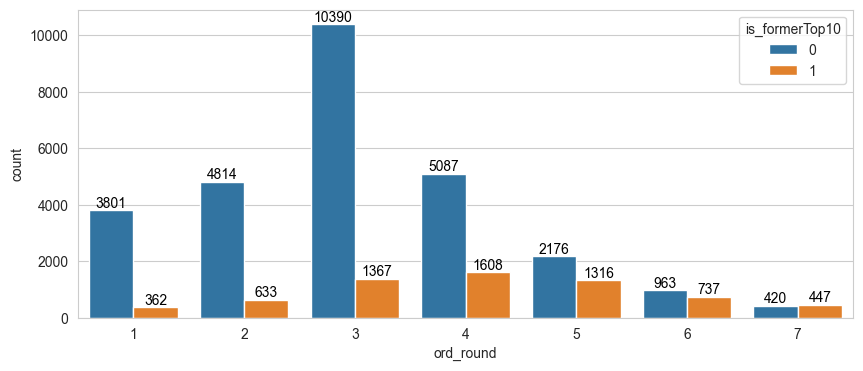

,ord_round (%),diff_homeAdvantage (%)
1,12.20,0.12
2,15.96,-0.62
3,34.46,-0.05
4,19.62,0.01
5,10.23,0.46
6,4.98,2.18
7,2.54,-1.61


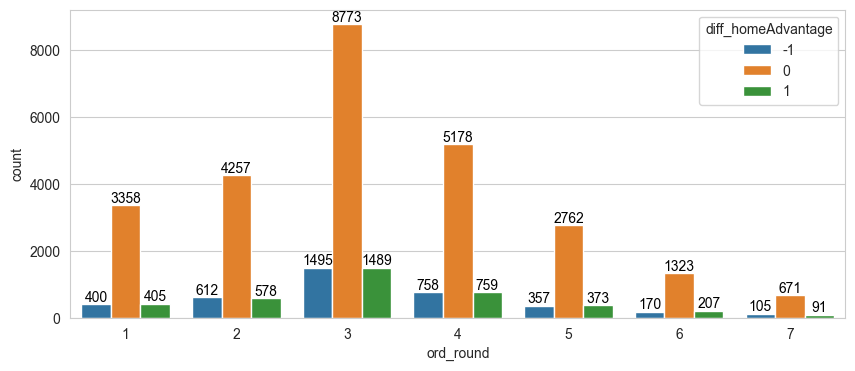

,ord_round (%),diff_surfaceAdvantage (%)
1,12.20,-1.39
2,15.96,1.06
3,34.46,0.84
4,19.62,0.04
5,10.23,0.60
6,4.98,-0.35
7,2.54,2.31


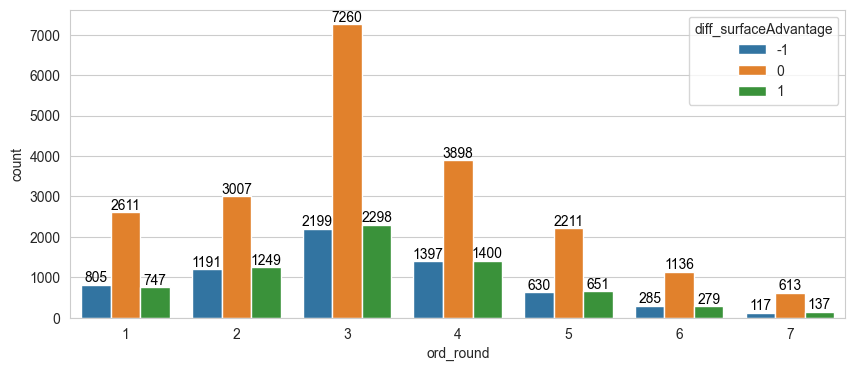

,ord_round (%),ord_tourneyLevel (%)
1,12.20,361.42
2,15.96,245.09
3,34.46,136.81
4,19.62,132.43
5,10.23,140.46
6,4.98,135.24
7,2.54,135.41


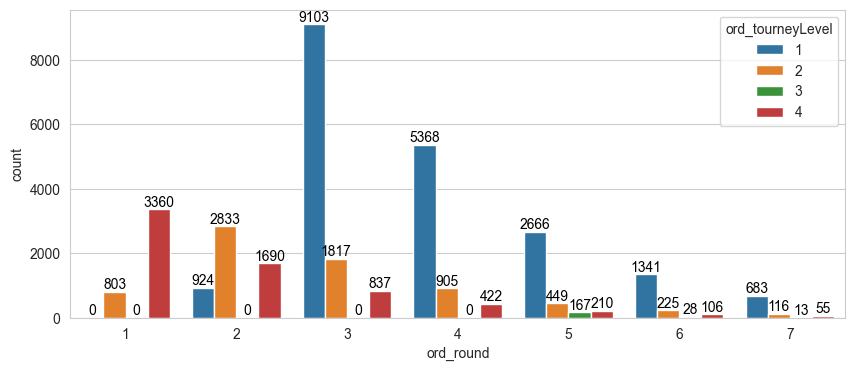

,ord_round (%),is_outdoor (%)
1,12.20,100.00
2,15.96,95.65
3,34.46,76.81
4,19.62,75.74
5,10.23,72.22
6,4.98,74.76
7,2.54,74.63


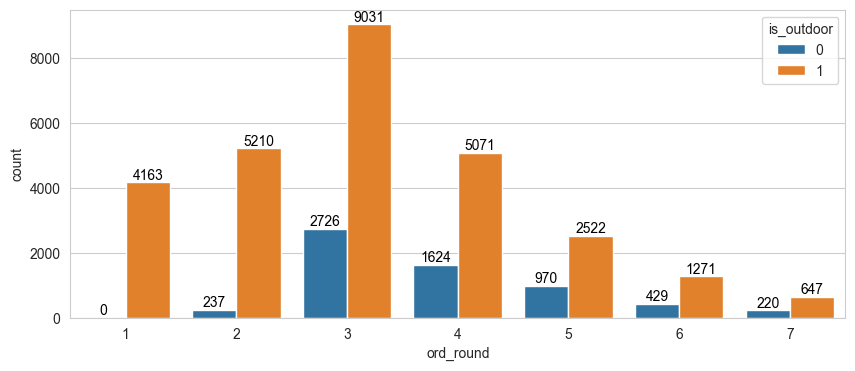

,ord_round (%),surface_Clay (%)
1,12.20,20.83
2,15.96,30.77
3,34.46,32.51
4,19.62,33.59
5,10.23,32.04
6,4.98,33.47
7,2.54,33.22


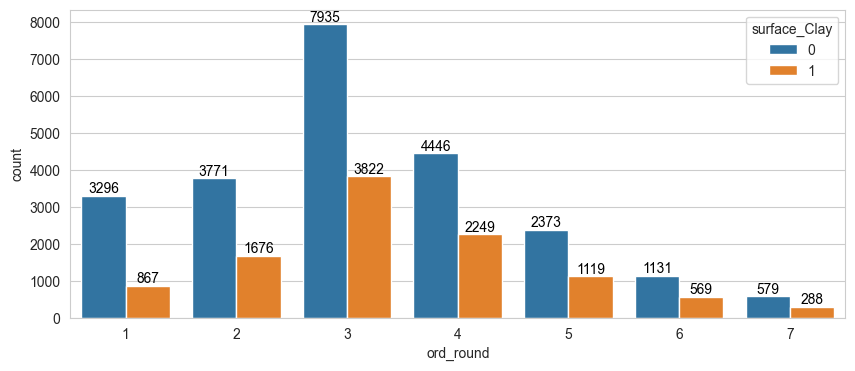

,ord_round (%),surface_Grass (%)
1,12.20,19.24
2,15.96,10.35
3,34.46,10.53
4,19.62,10.20
5,10.23,9.77
6,4.98,9.94
7,2.54,9.92


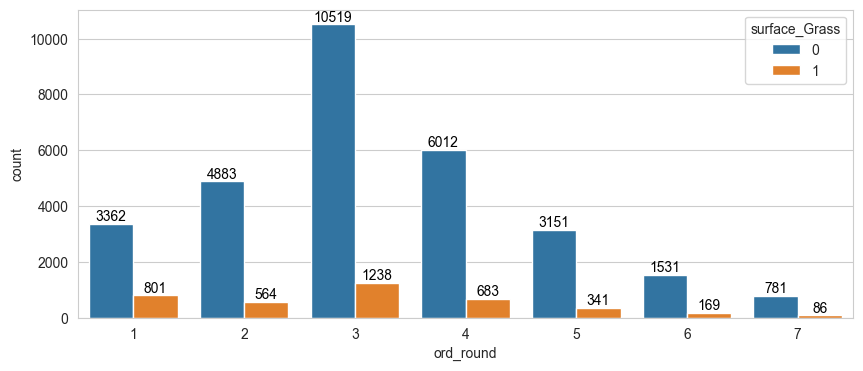

,ord_round (%),surface_Hard (%)
1,12.20,59.93
2,15.96,58.88
3,34.46,56.96
4,19.62,56.21
5,10.23,58.19
6,4.98,56.59
7,2.54,56.86


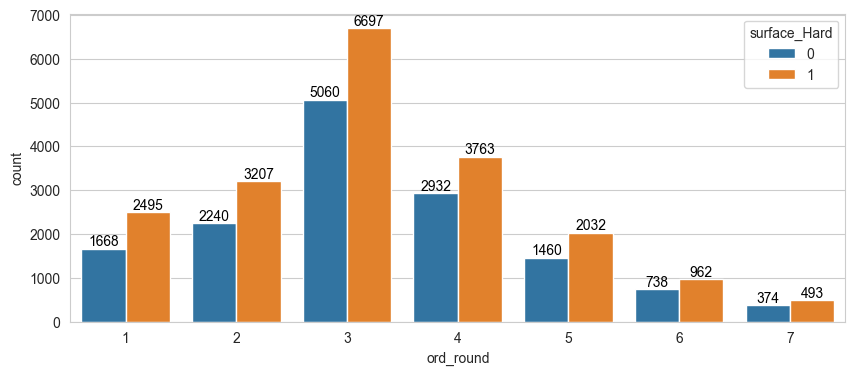

,ord_round (%),ord_drawSize (%)
1,12.20,889.69
2,15.96,744.85
3,34.46,475.84
4,19.62,461.45
5,10.23,444.19
6,4.98,455.53
7,2.54,456.86


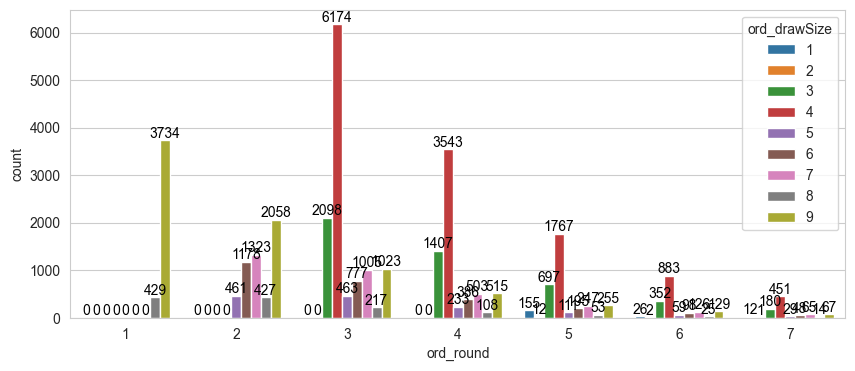

,ord_round (%),ord_round (%)
1,12.20,100.00
2,15.96,200.00
3,34.46,300.00
4,19.62,400.00
5,10.23,500.00
6,4.98,600.00
7,2.54,700.00


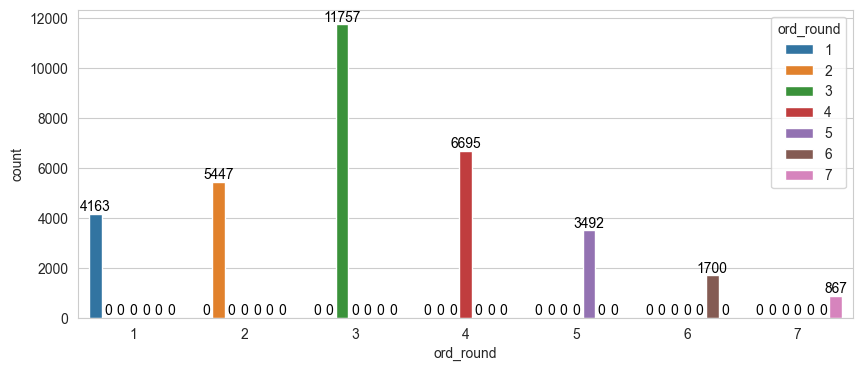

,ord_round (%),handedness_L (%)
1,12.20,2.11
2,15.96,1.87
3,34.46,1.84
4,19.62,2.02
5,10.23,2.12
6,4.98,1.06
7,2.54,1.50


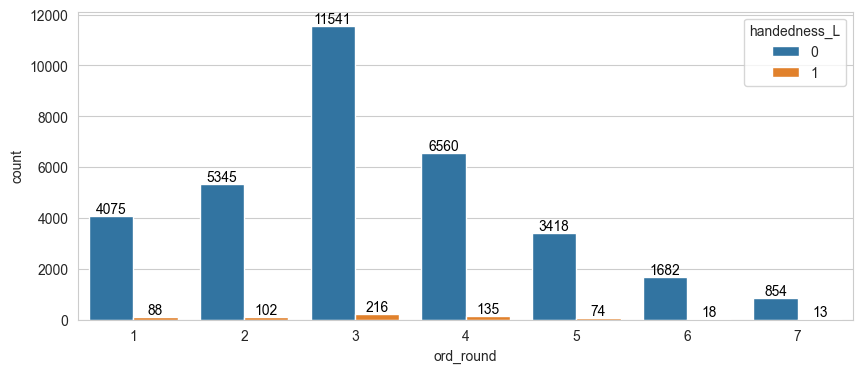

,ord_round (%),handedness_LR (%)
1,12.20,12.83
2,15.96,10.68
3,34.46,11.98
4,19.62,11.37
5,10.23,11.66
6,4.98,12.65
7,2.54,12.23


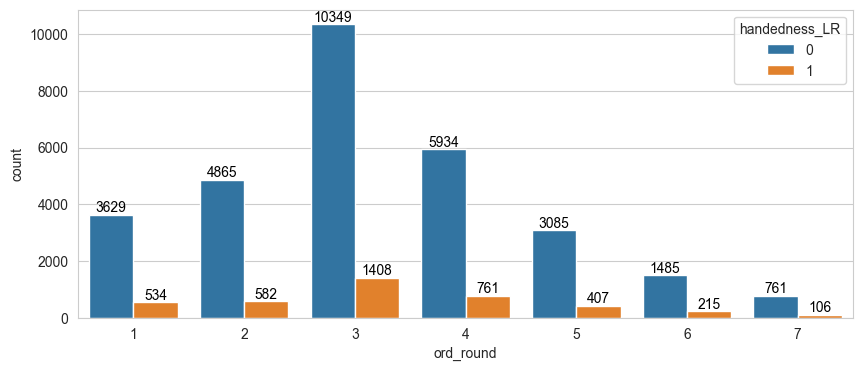

,ord_round (%),handedness_R (%)
1,12.20,72.83
2,15.96,74.43
3,34.46,73.68
4,19.62,74.49
5,10.23,75.66
6,4.98,74.47
7,2.54,73.93


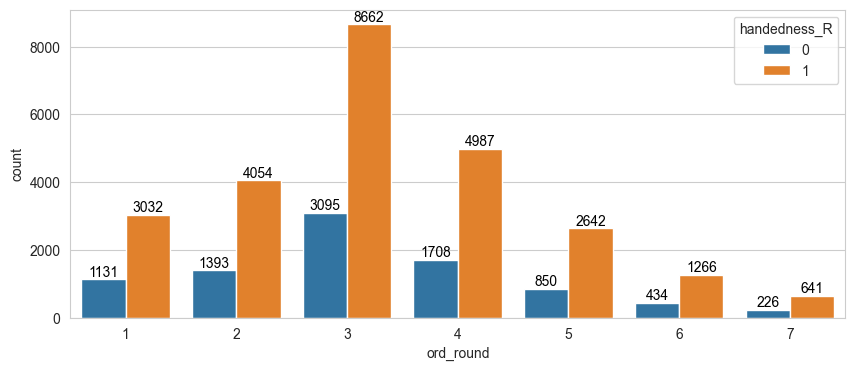

,ord_round (%),handedness_RL (%)
1,12.20,12.23
2,15.96,13.02
3,34.46,12.51
4,19.62,12.13
5,10.23,10.57
6,4.98,11.82
7,2.54,12.34


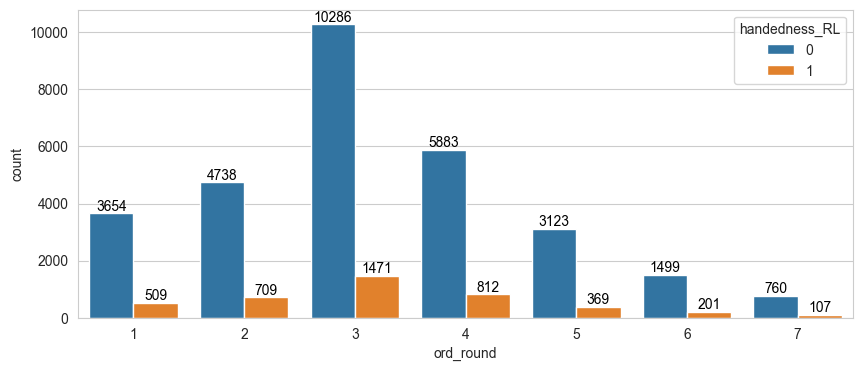

,ord_round (%),favorite_won (%)
1,12.20,67.62
2,15.96,66.61
3,34.46,65.02
4,19.62,67.48
5,10.23,65.12
6,4.98,63.29
7,2.54,64.01


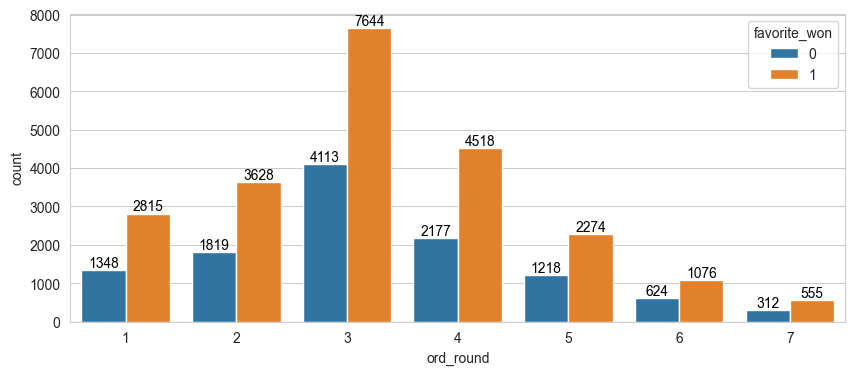

,handedness_L (%),favorite_won (%)
0,98.11,66.11
1,1.89,58.82


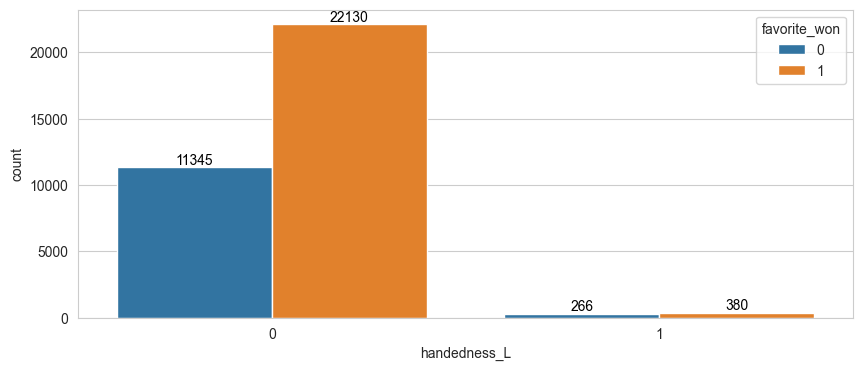

,handedness_L (%),is_grandSlam (%)
0,98.11,19.62
1,1.89,17.49


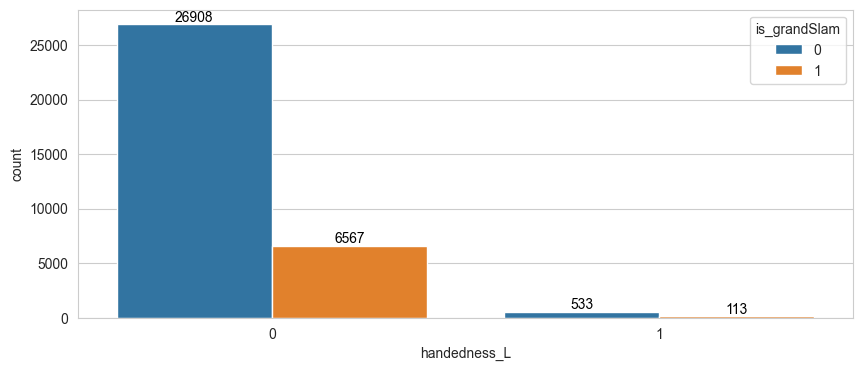

,handedness_L (%),is_formerTop10 (%)
0,98.11,19.09
1,1.89,12.07


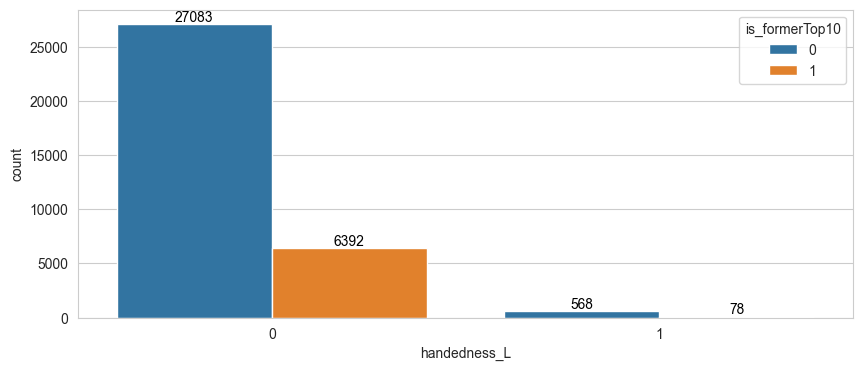

,handedness_L (%),diff_homeAdvantage (%)
0,98.11,0.01
1,1.89,0.31


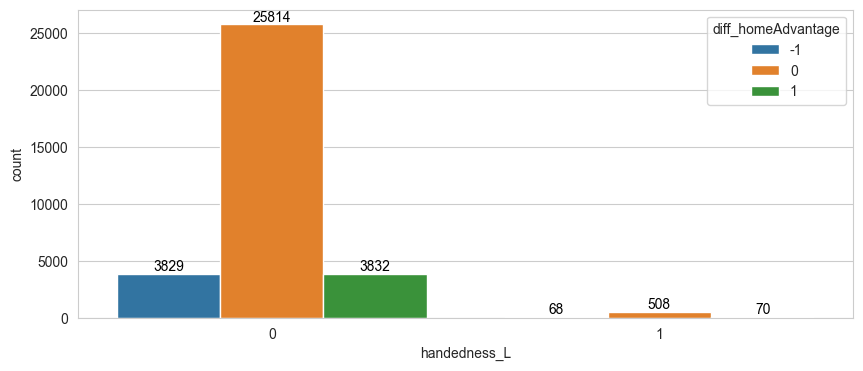

,handedness_L (%),diff_surfaceAdvantage (%)
0,98.11,0.36
1,1.89,2.32


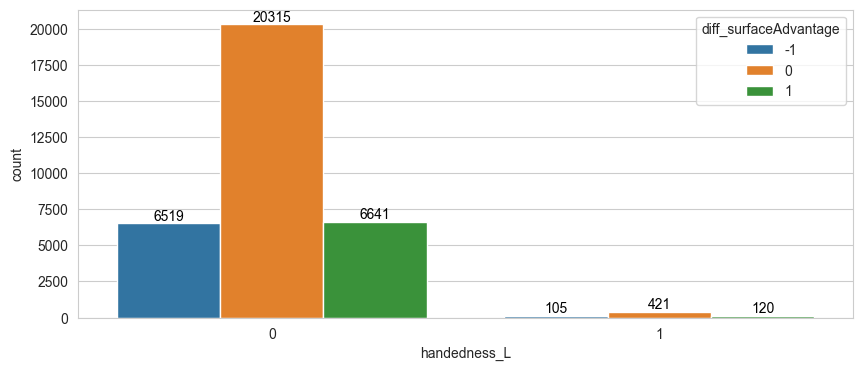

,handedness_L (%),ord_tourneyLevel (%)
0,98.11,181.07
1,1.89,171.98


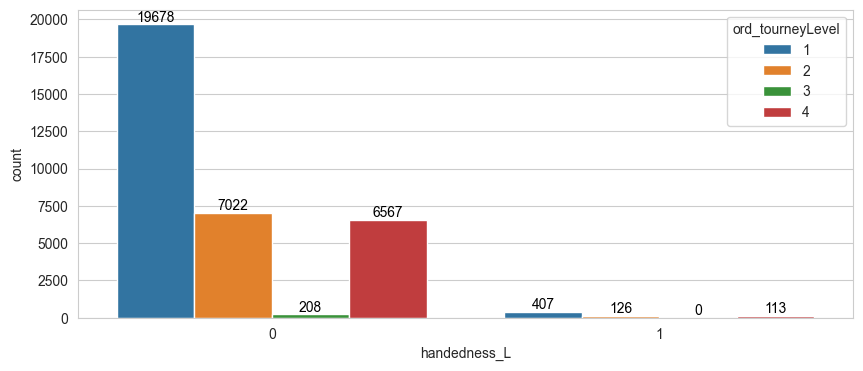

,handedness_L (%),is_outdoor (%)
0,98.11,81.73
1,1.89,86.22


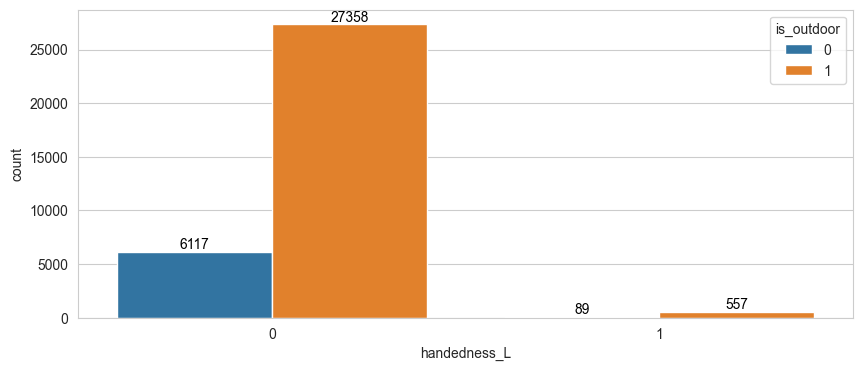

,handedness_L (%),surface_Clay (%)
0,98.11,30.83
1,1.89,41.49


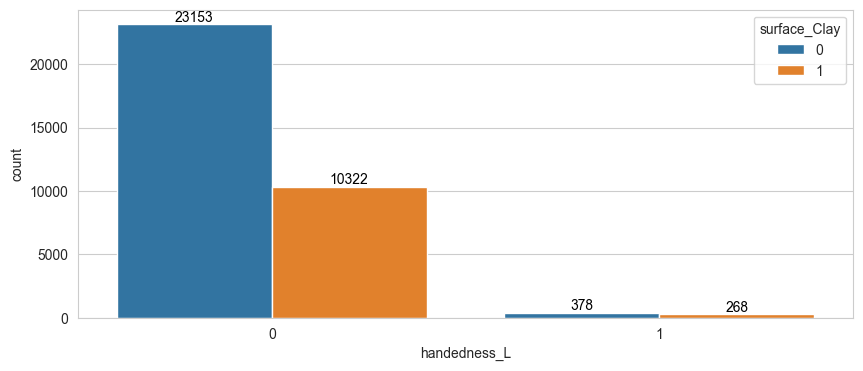

,handedness_L (%),surface_Grass (%)
0,98.11,11.39
1,1.89,10.84


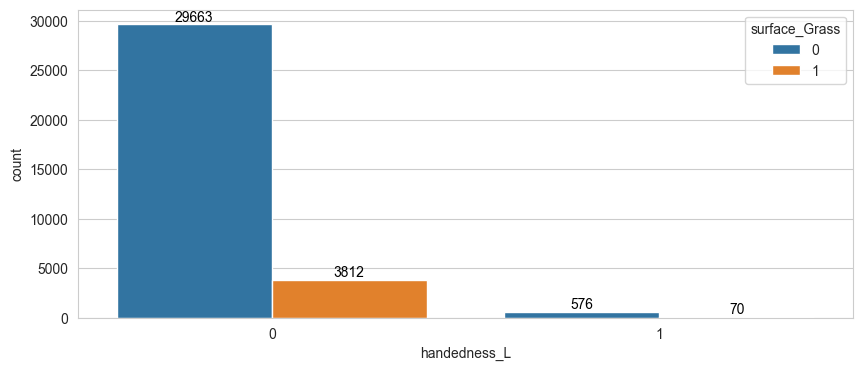

,handedness_L (%),surface_Hard (%)
0,98.11,57.78
1,1.89,47.68


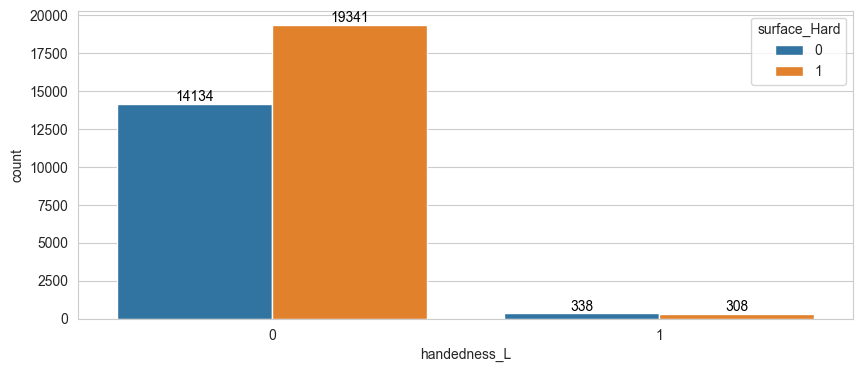

,handedness_L (%),ord_drawSize (%)
0,98.11,561.95
1,1.89,549.69


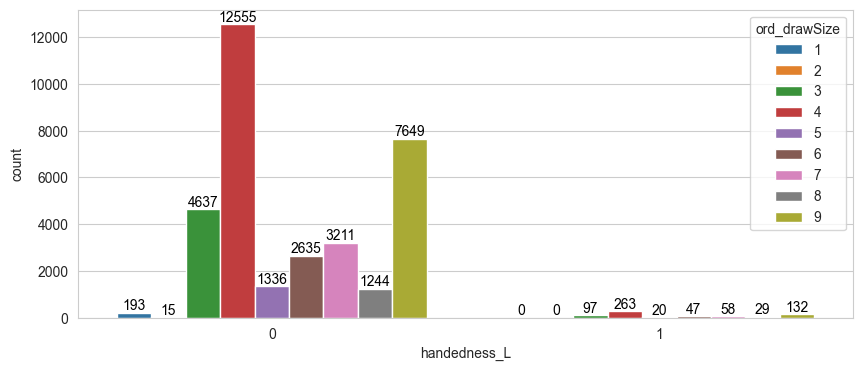

,handedness_L (%),ord_round (%)
0,98.11,324.98
1,1.89,317.18


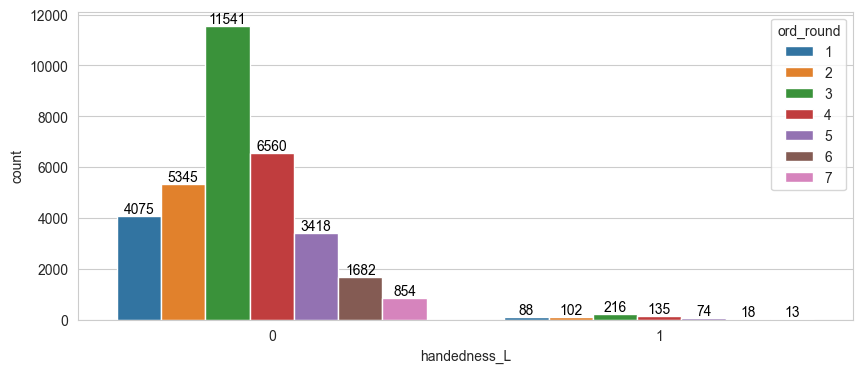

,handedness_L (%),handedness_L (%)
0,98.11,0.00
1,1.89,100.00


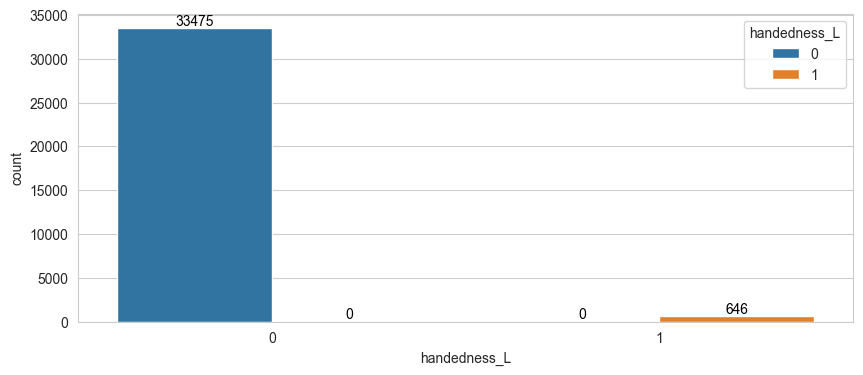

,handedness_L (%),handedness_LR (%)
0,98.11,11.99
1,1.89,0.00


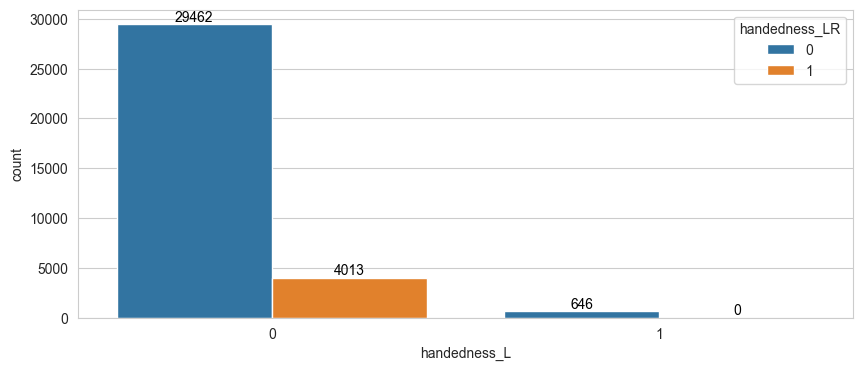

,handedness_L (%),handedness_R (%)
0,98.11,75.53
1,1.89,0.00


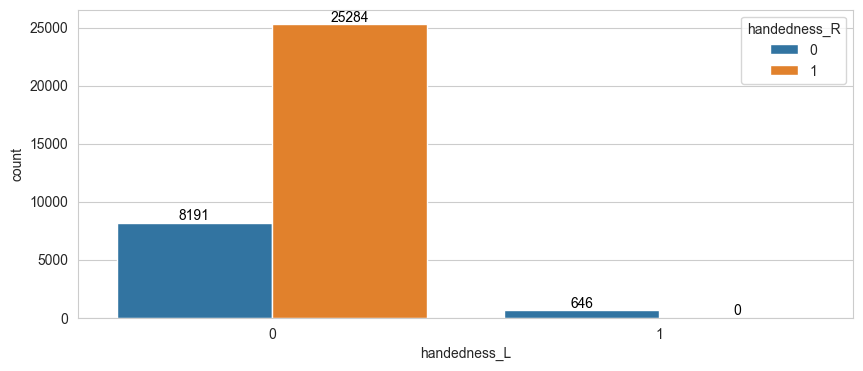

,handedness_L (%),handedness_RL (%)
0,98.11,12.48
1,1.89,0.00


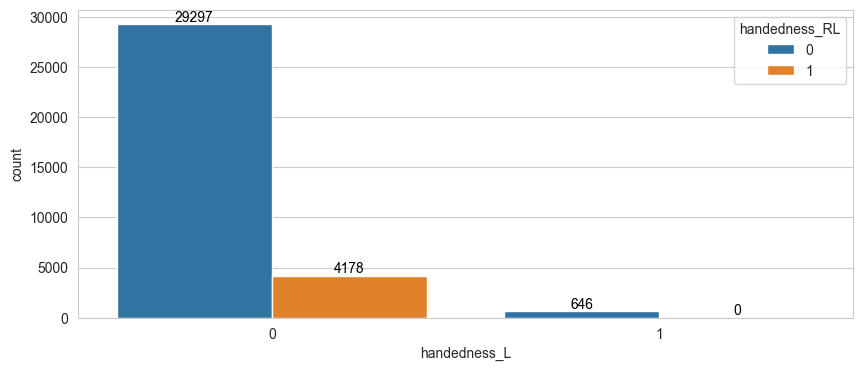

,handedness_L (%),favorite_won (%)
0,98.11,66.11
1,1.89,58.82


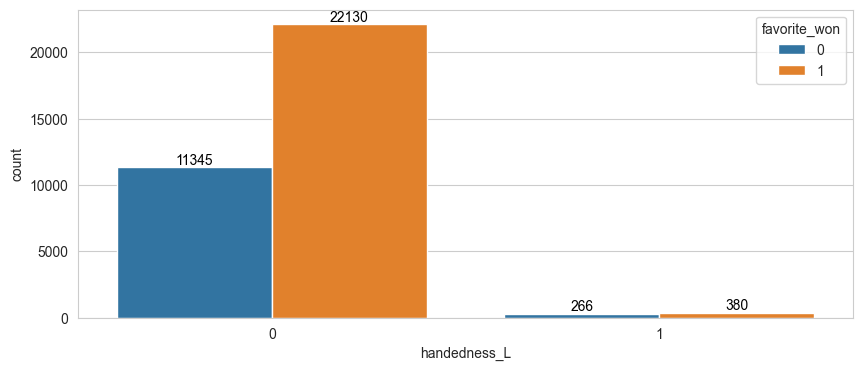

,handedness_LR (%),favorite_won (%)
0,88.24,66.23
1,11.76,63.99


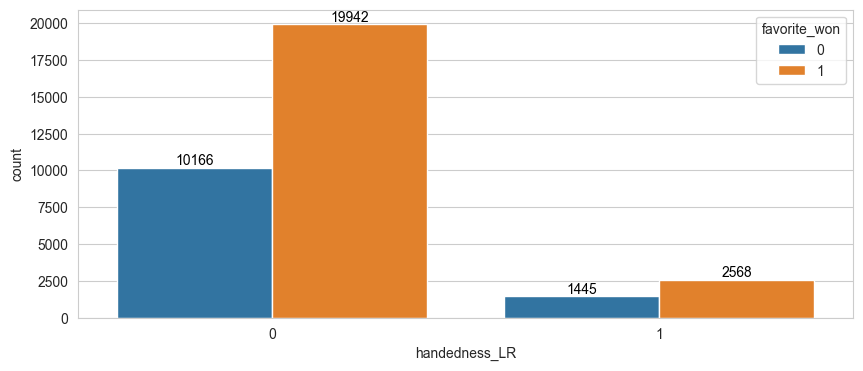

,handedness_LR (%),is_grandSlam (%)
0,88.24,19.65
1,11.76,19.06


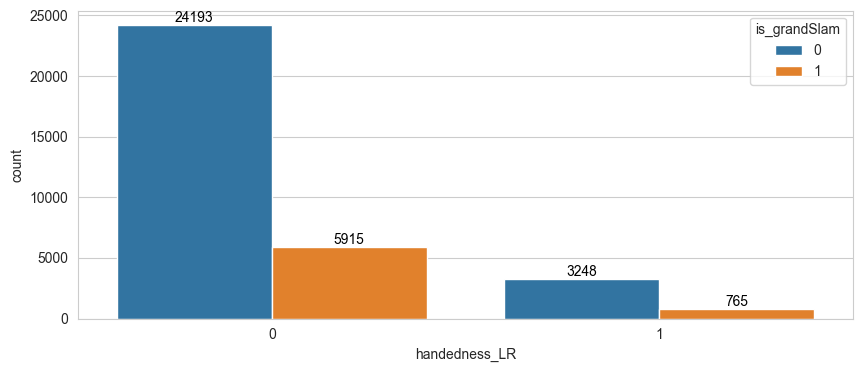

,handedness_LR (%),is_formerTop10 (%)
0,88.24,19.06
1,11.76,18.24


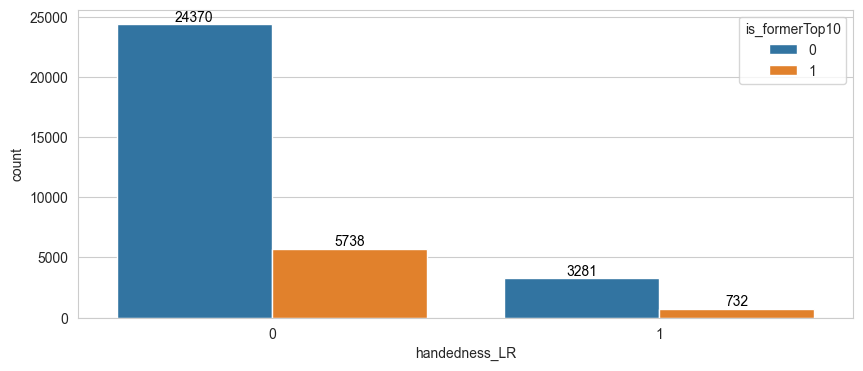

,handedness_LR (%),diff_homeAdvantage (%)
0,88.24,0.08
1,11.76,-0.47


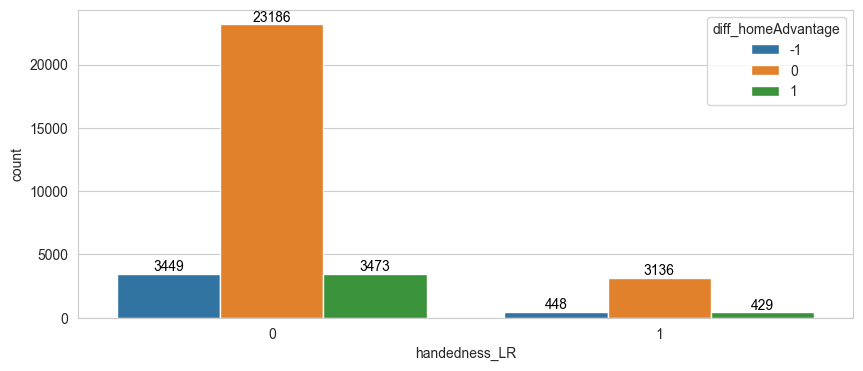

,handedness_LR (%),diff_surfaceAdvantage (%)
0,88.24,0.33
1,11.76,0.97


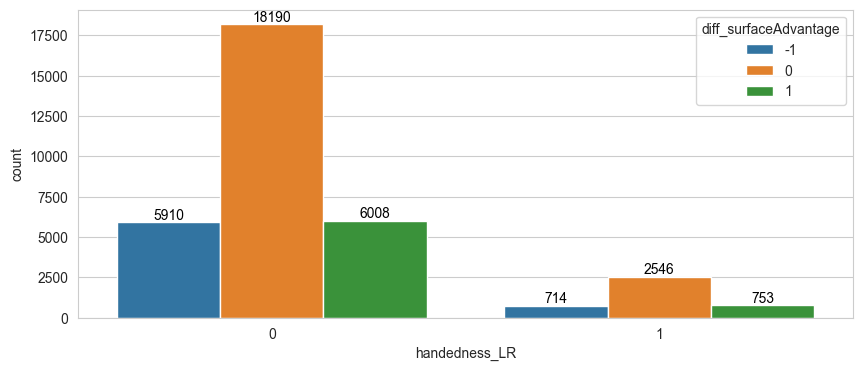

,handedness_LR (%),ord_tourneyLevel (%)
0,88.24,181.14
1,11.76,179.09


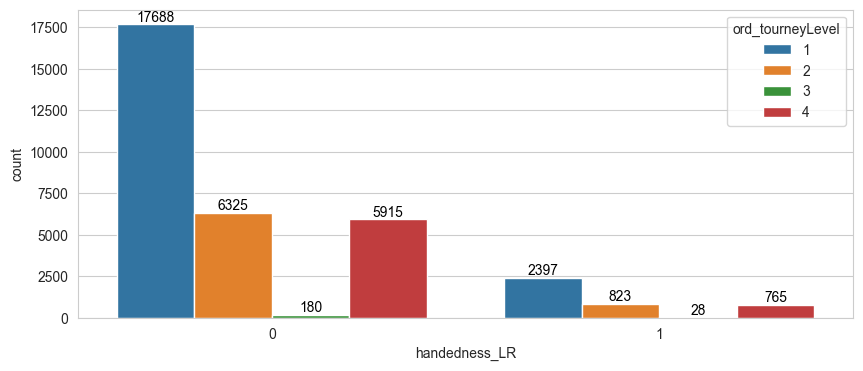

,handedness_LR (%),is_outdoor (%)
0,88.24,81.62
1,11.76,83.28


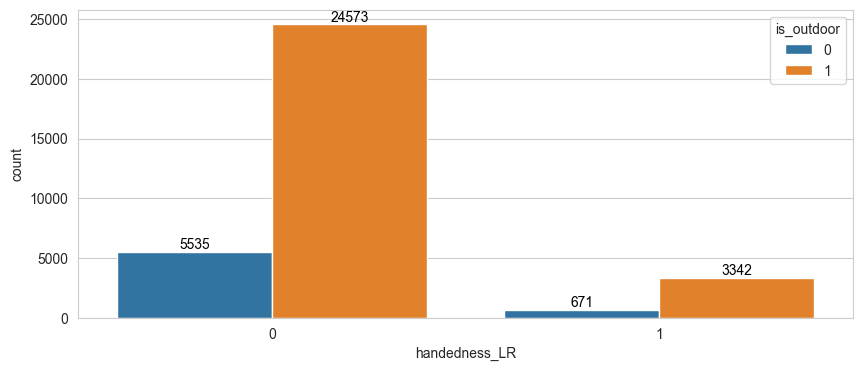

,handedness_LR (%),surface_Clay (%)
0,88.24,30.38
1,11.76,35.98


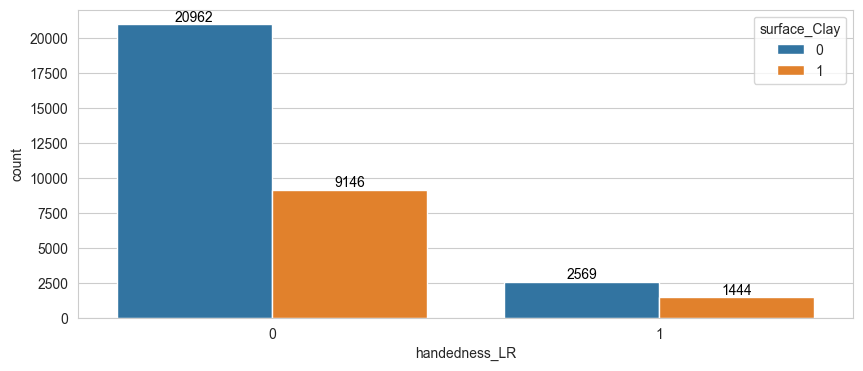

,handedness_LR (%),surface_Grass (%)
0,88.24,11.42
1,11.76,11.04


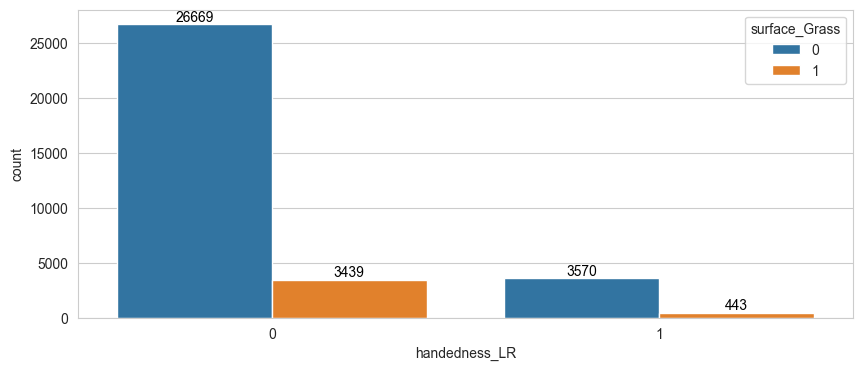

,handedness_LR (%),surface_Hard (%)
0,88.24,58.20
1,11.76,52.98


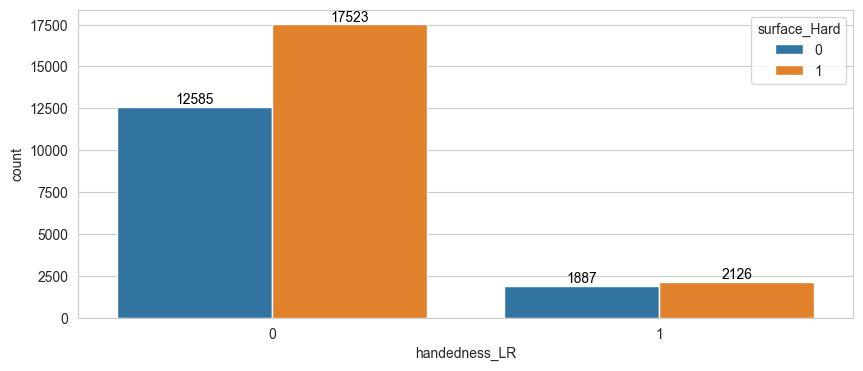

,handedness_LR (%),ord_drawSize (%)
0,88.24,561.88
1,11.76,560.50


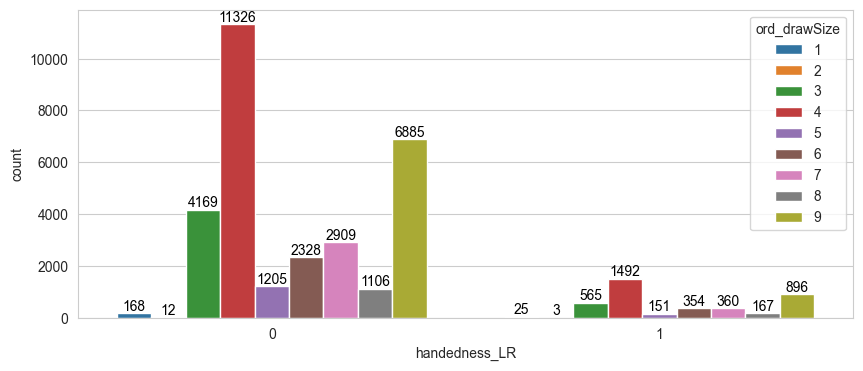

,handedness_LR (%),ord_round (%)
0,88.24,324.84
1,11.76,324.77


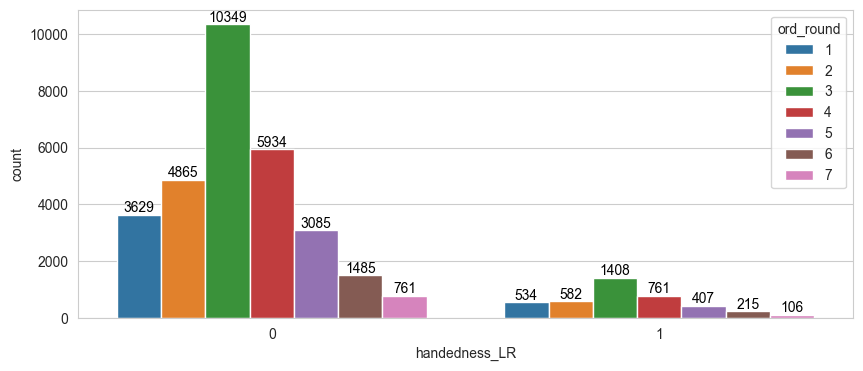

,handedness_LR (%),handedness_L (%)
0,88.24,2.15
1,11.76,0.00


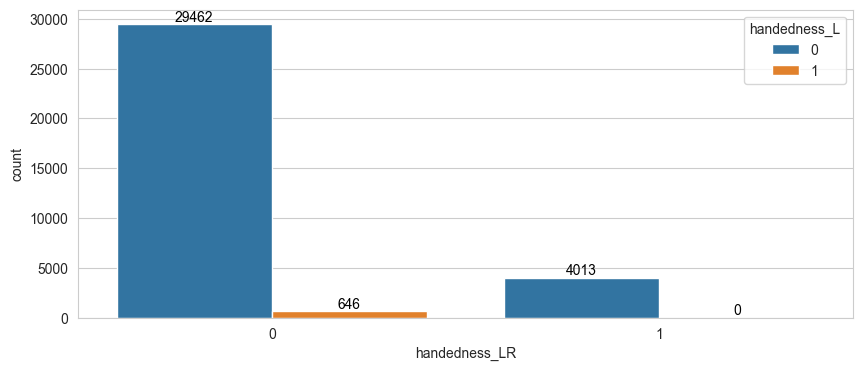

,handedness_LR (%),handedness_LR (%)
0,88.24,0.00
1,11.76,100.00


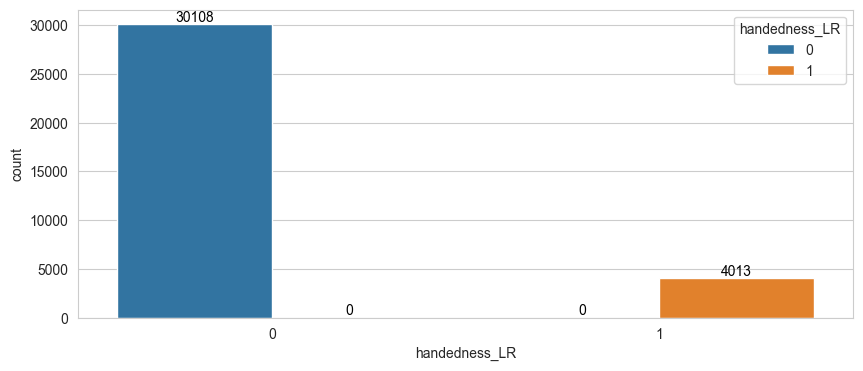

,handedness_LR (%),handedness_R (%)
0,88.24,83.98
1,11.76,0.00


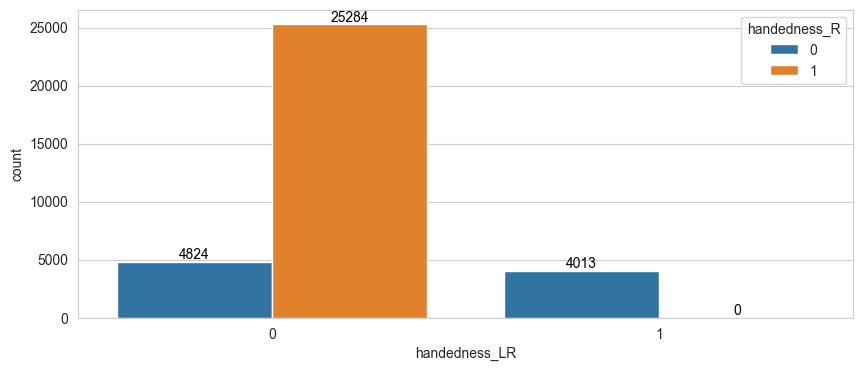

,handedness_LR (%),handedness_RL (%)
0,88.24,13.88
1,11.76,0.00


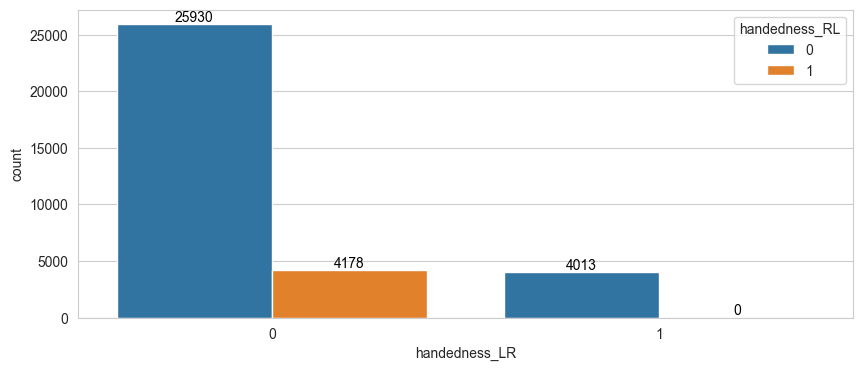

,handedness_LR (%),favorite_won (%)
0,88.24,66.23
1,11.76,63.99


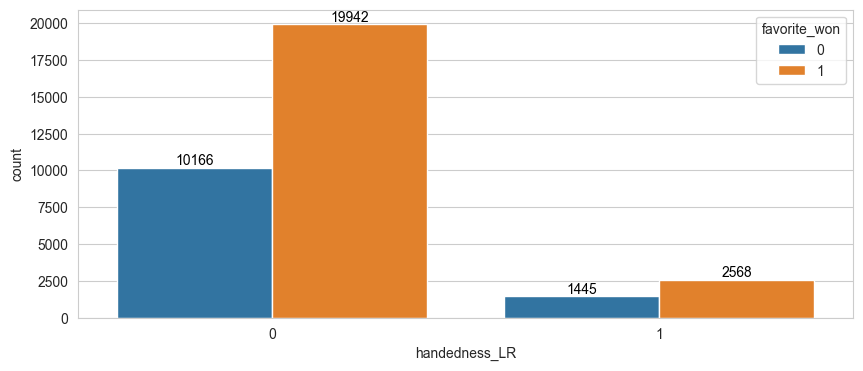

,handedness_R (%),favorite_won (%)
0,25.90,65.12
1,74.10,66.27


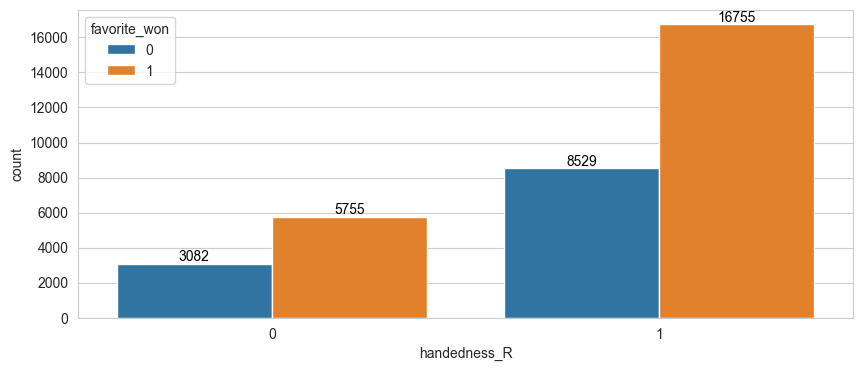

,handedness_R (%),is_grandSlam (%)
0,25.90,19.12
1,74.10,19.74


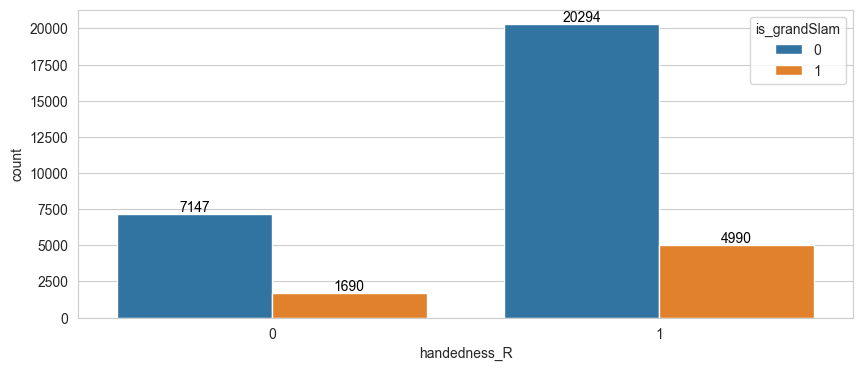

,handedness_R (%),is_formerTop10 (%)
0,25.90,17.18
1,74.10,19.59


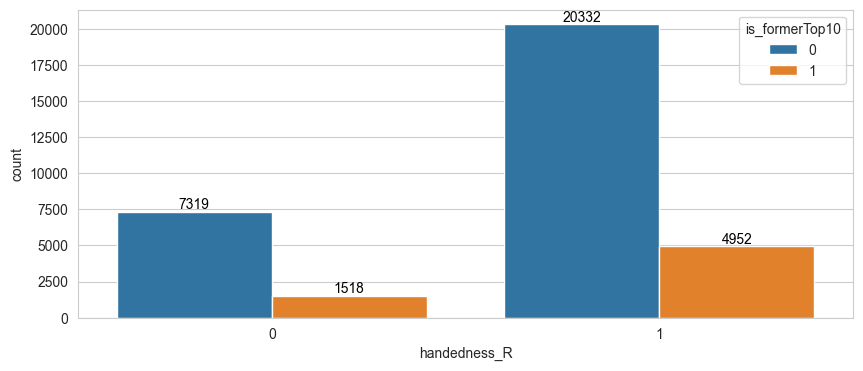

,handedness_R (%),diff_homeAdvantage (%)
0,25.90,0.10
1,74.10,-0.02


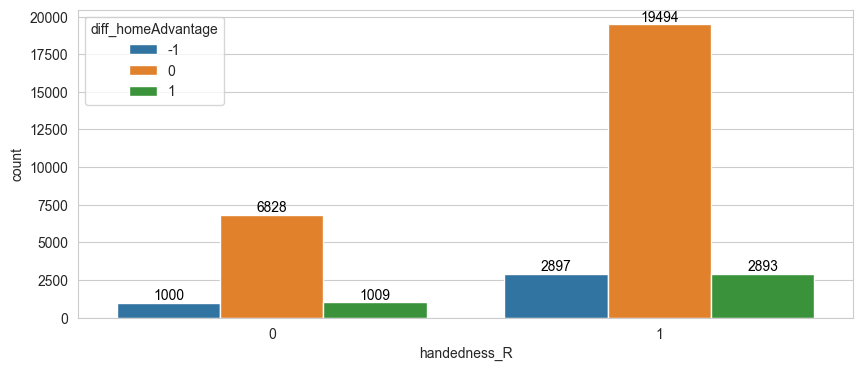

,handedness_R (%),diff_surfaceAdvantage (%)
0,25.90,0.88
1,74.10,0.23


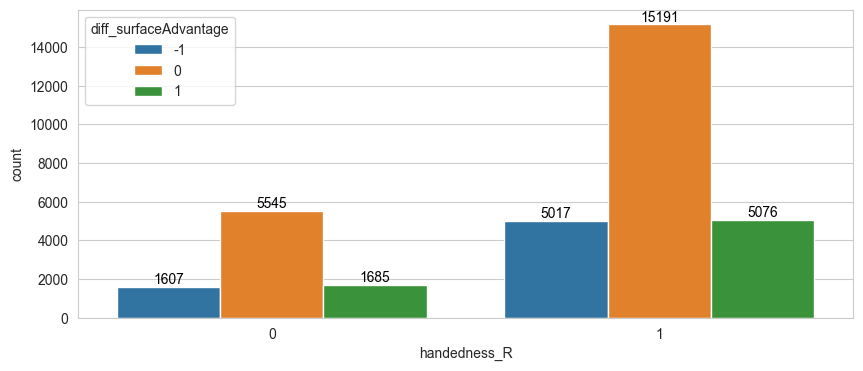

,handedness_R (%),ord_tourneyLevel (%)
0,25.90,178.85
1,74.10,181.62


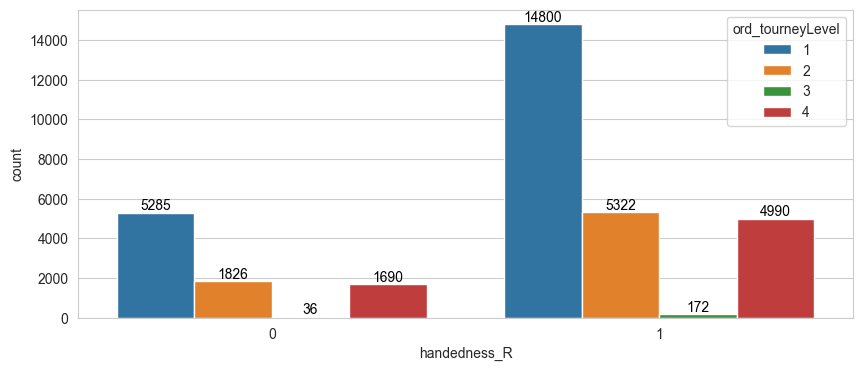

,handedness_R (%),is_outdoor (%)
0,25.90,82.86
1,74.10,81.45


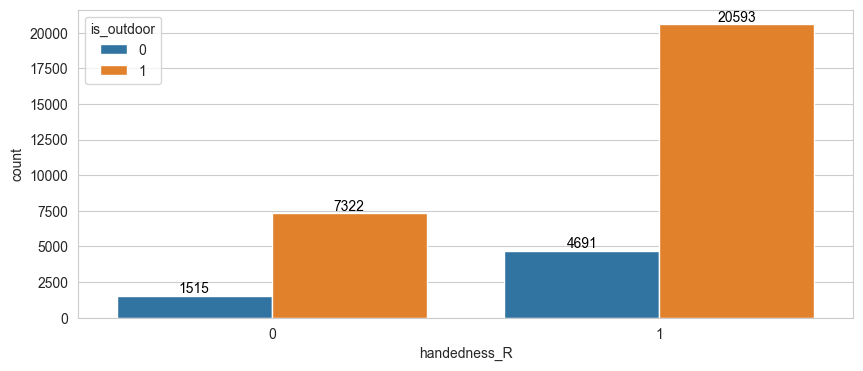

,handedness_R (%),surface_Clay (%)
0,25.90,34.74
1,74.10,29.74


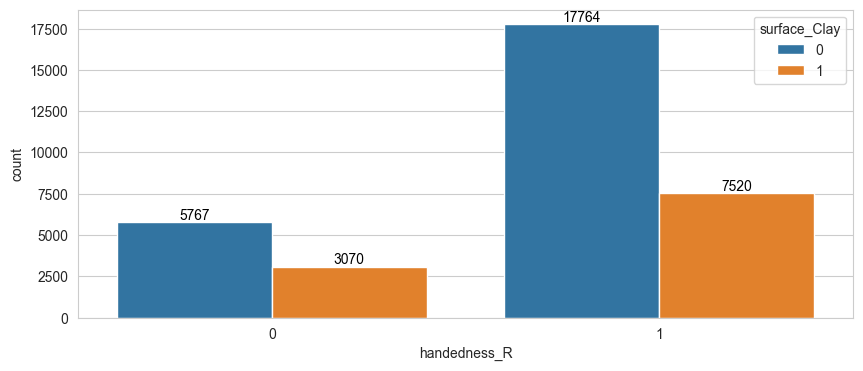

,handedness_R (%),surface_Grass (%)
0,25.90,11.40
1,74.10,11.37


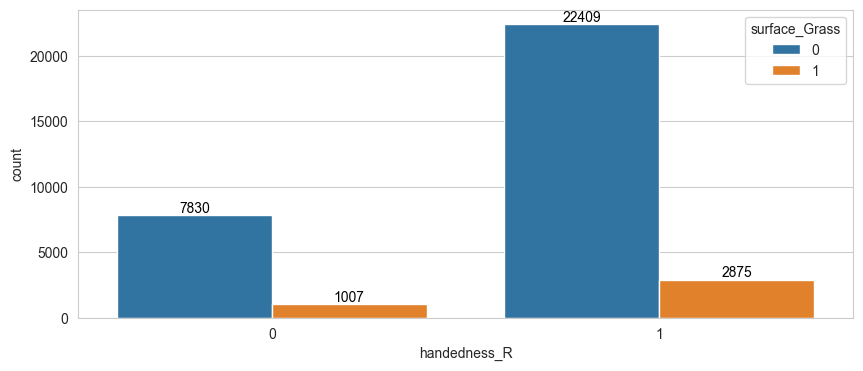

,handedness_R (%),surface_Hard (%)
0,25.90,53.86
1,74.10,58.89


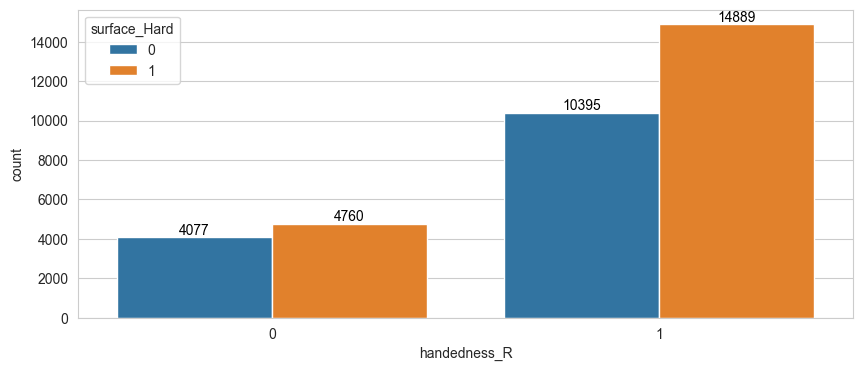

,handedness_R (%),ord_drawSize (%)
0,25.90,559.87
1,74.10,562.37


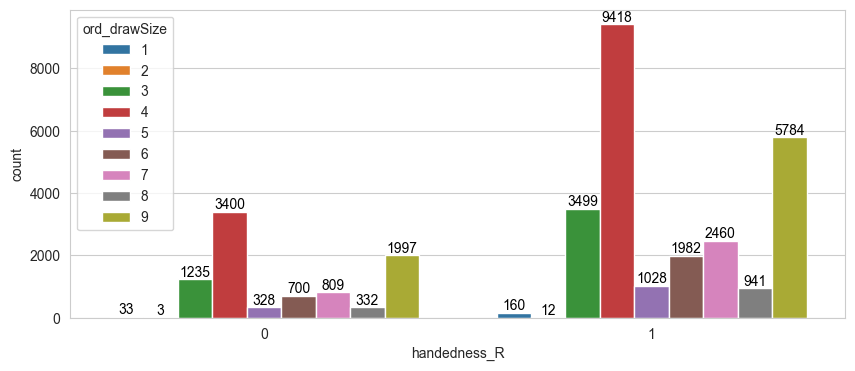

,handedness_R (%),ord_round (%)
0,25.90,322.17
1,74.10,325.77


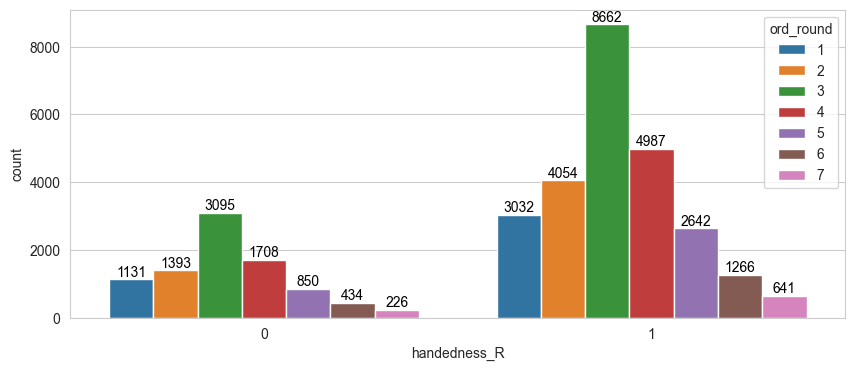

,handedness_R (%),handedness_L (%)
0,25.90,7.31
1,74.10,0.00


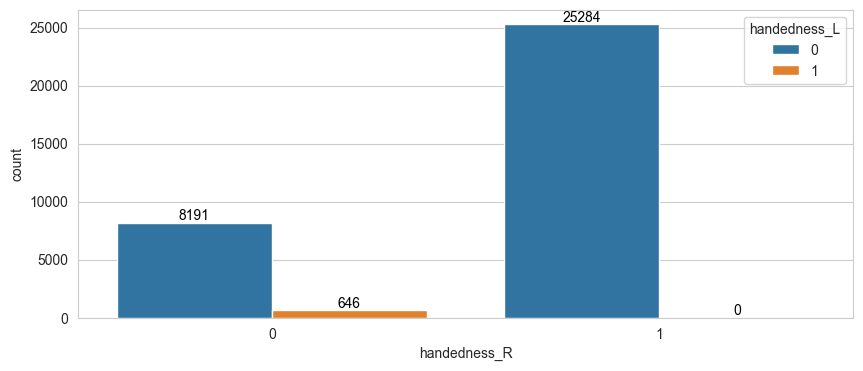

,handedness_R (%),handedness_LR (%)
0,25.90,45.41
1,74.10,0.00


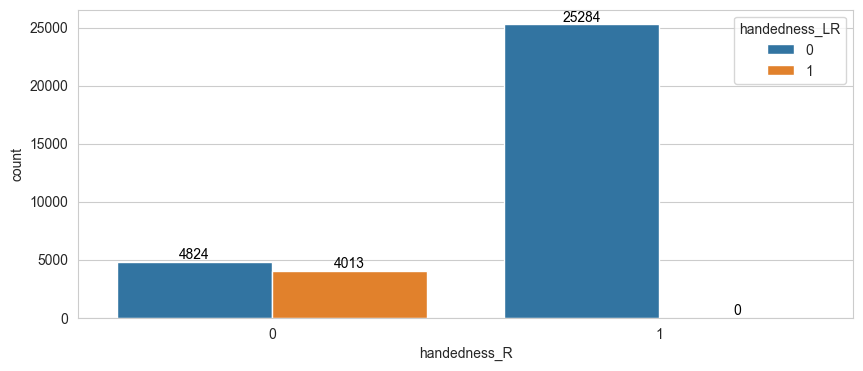

,handedness_R (%),handedness_R (%)
0,25.90,0.00
1,74.10,100.00


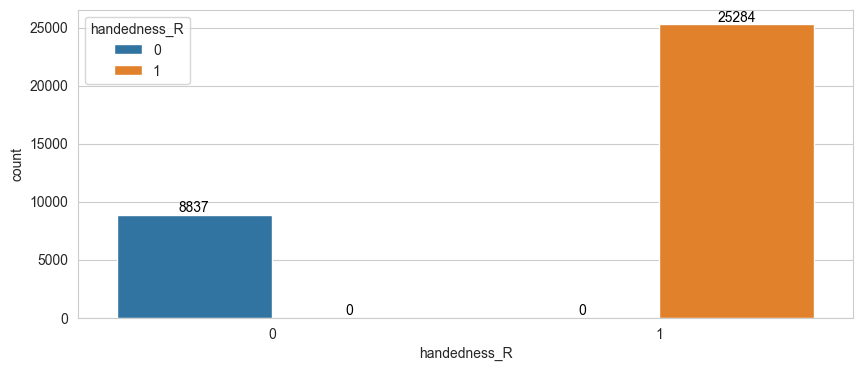

,handedness_R (%),handedness_RL (%)
0,25.90,47.28
1,74.10,0.00


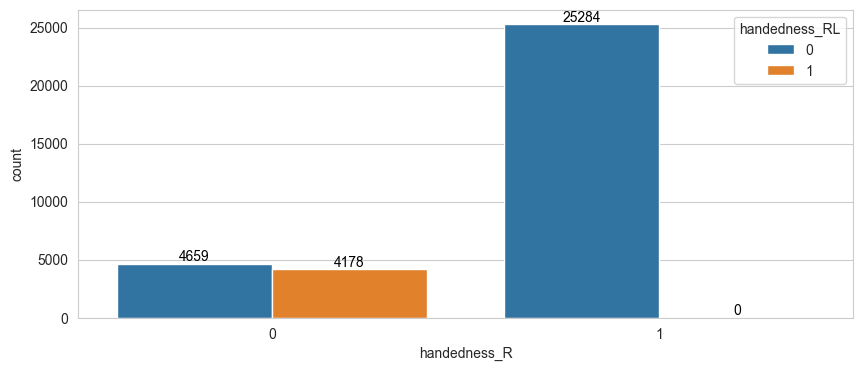

,handedness_R (%),favorite_won (%)
0,25.90,65.12
1,74.10,66.27


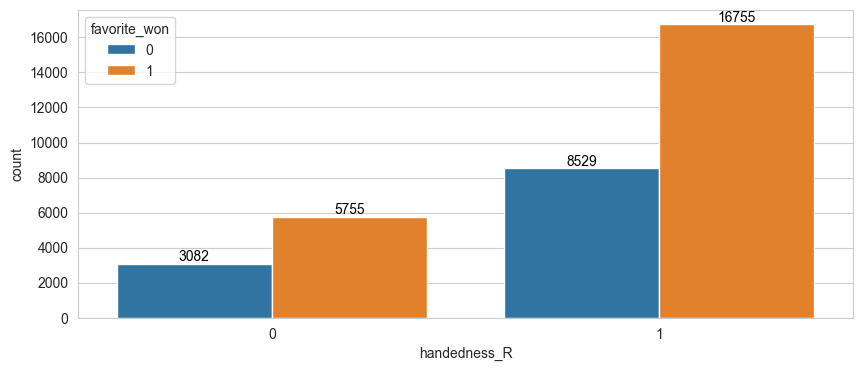

,handedness_RL (%),favorite_won (%)
0,87.76,65.80
1,12.24,67.19


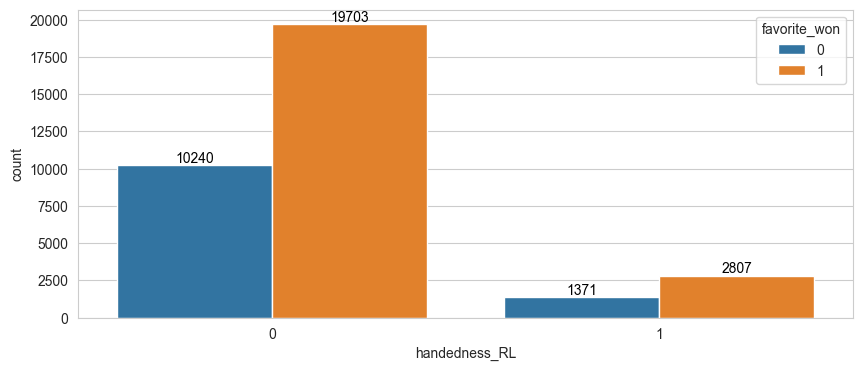

,handedness_RL (%),is_grandSlam (%)
0,87.76,19.60
1,12.24,19.44


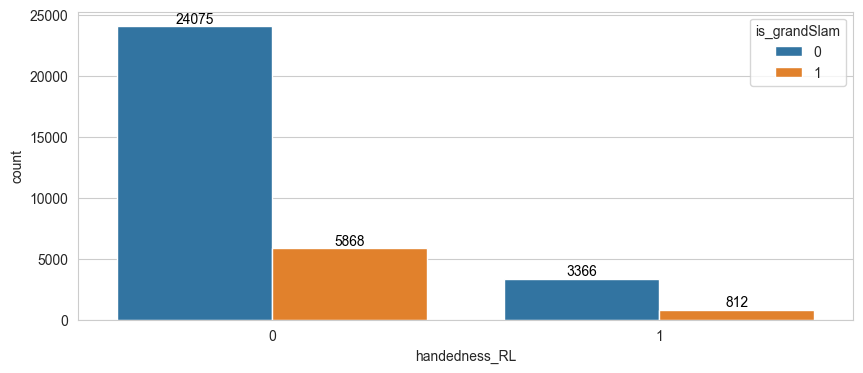

,handedness_RL (%),is_formerTop10 (%)
0,87.76,19.24
1,12.24,16.95


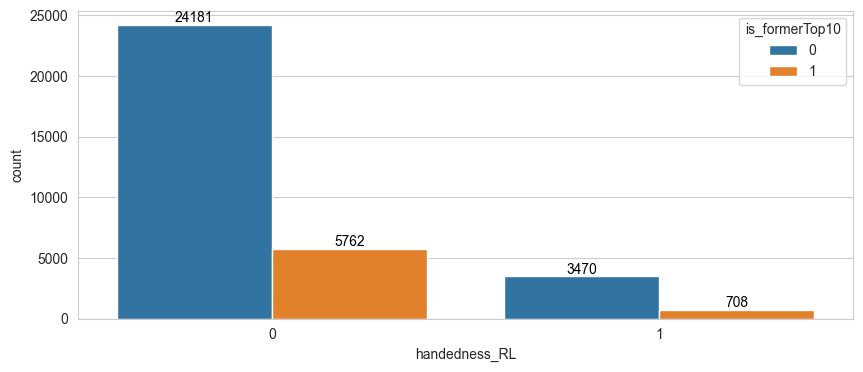

,handedness_RL (%),diff_homeAdvantage (%)
0,87.76,-0.07
1,12.24,0.62


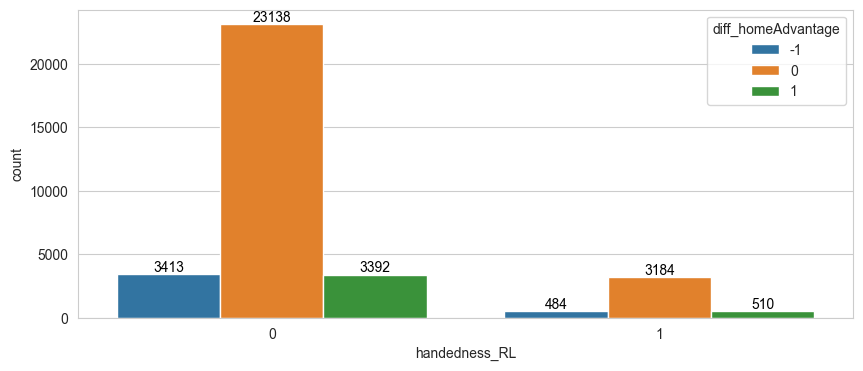

,handedness_RL (%),diff_surfaceAdvantage (%)
0,87.76,0.38
1,12.24,0.57


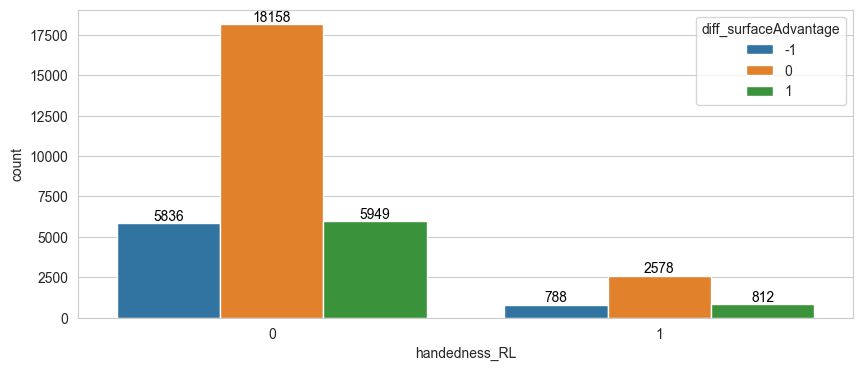

,handedness_RL (%),ord_tourneyLevel (%)
0,87.76,181.07
1,12.24,179.68


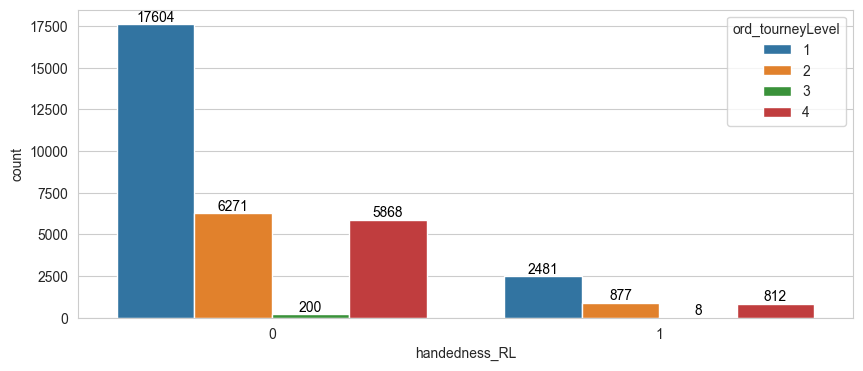

,handedness_RL (%),is_outdoor (%)
0,87.76,81.80
1,12.24,81.93


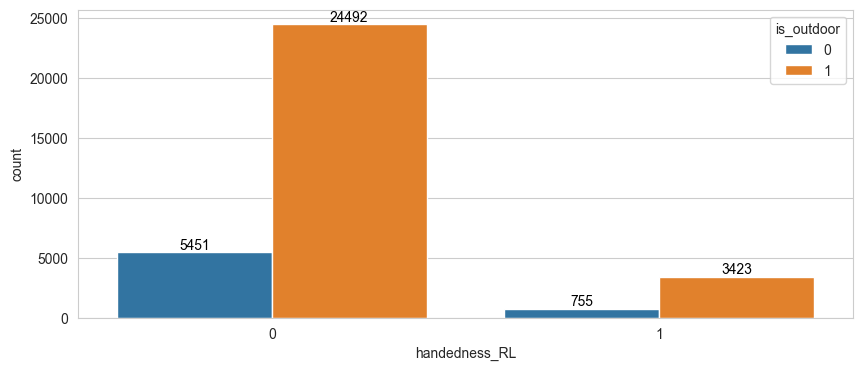

,handedness_RL (%),surface_Clay (%)
0,87.76,30.83
1,12.24,32.50


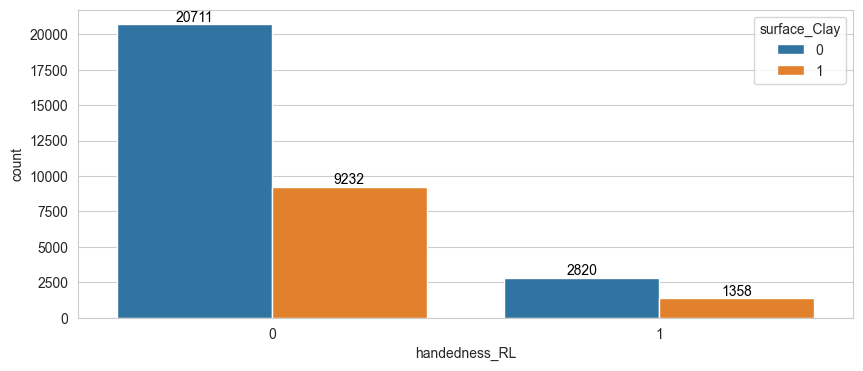

,handedness_RL (%),surface_Grass (%)
0,87.76,11.31
1,12.24,11.82


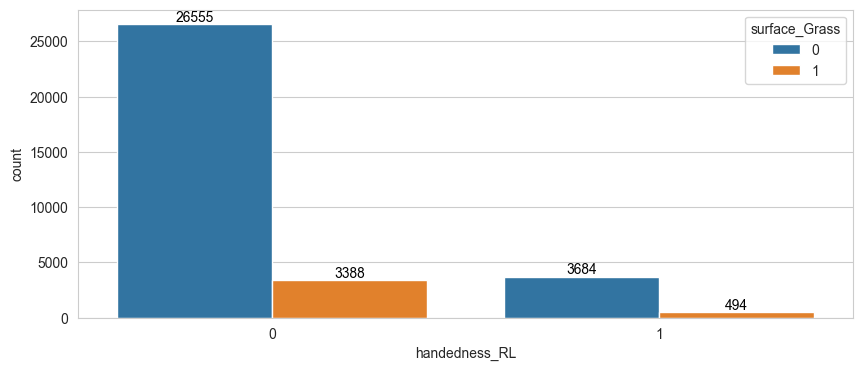

,handedness_RL (%),surface_Hard (%)
0,87.76,57.85
1,12.24,55.67


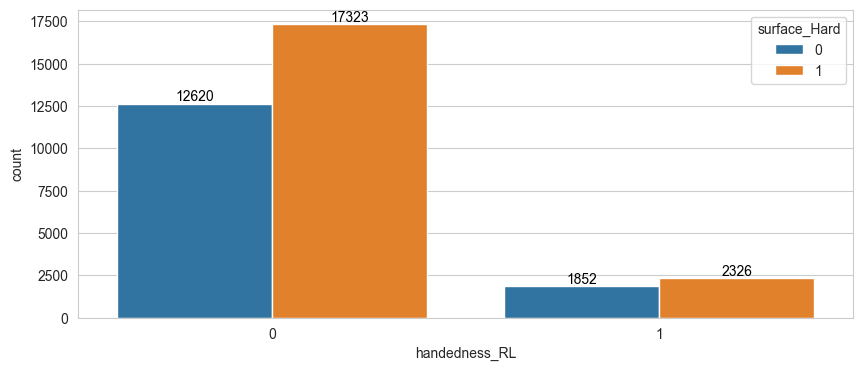

,handedness_RL (%),ord_drawSize (%)
0,87.76,561.84
1,12.24,560.84


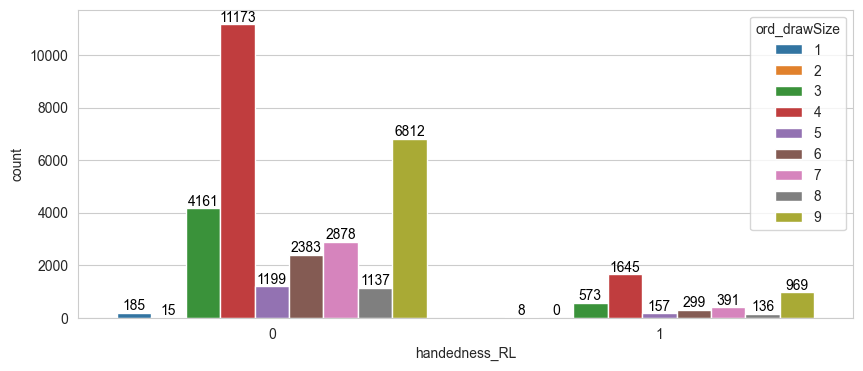

,handedness_RL (%),ord_round (%)
0,87.76,325.45
1,12.24,320.44


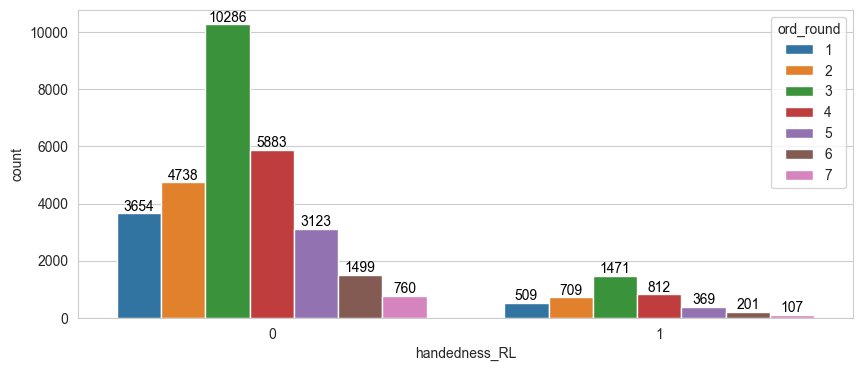

,handedness_RL (%),handedness_L (%)
0,87.76,2.16
1,12.24,0.00


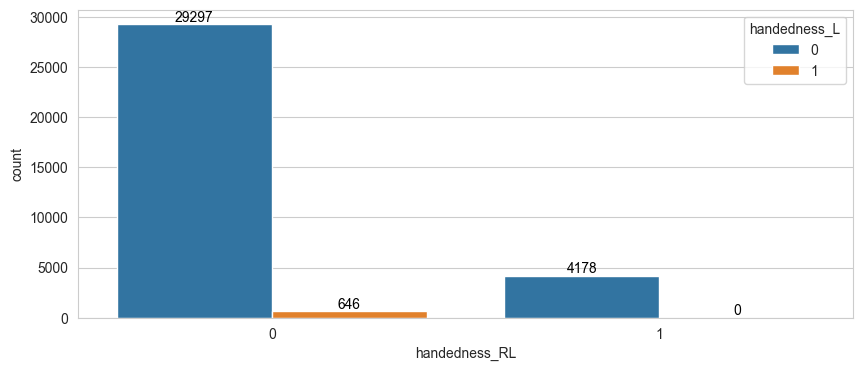

,handedness_RL (%),handedness_LR (%)
0,87.76,13.40
1,12.24,0.00


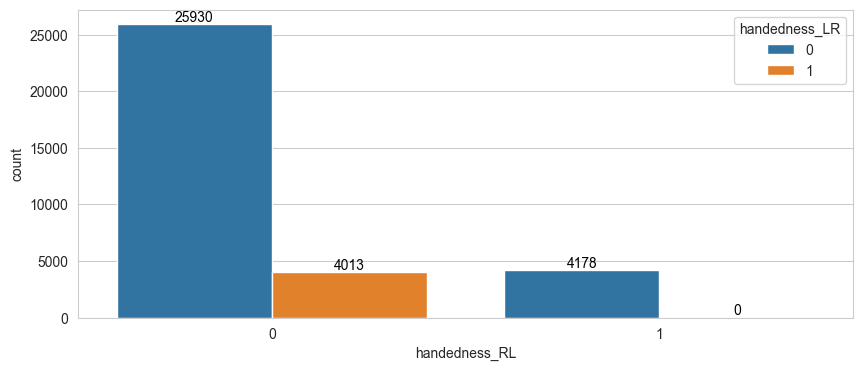

,handedness_RL (%),handedness_R (%)
0,87.76,84.44
1,12.24,0.00


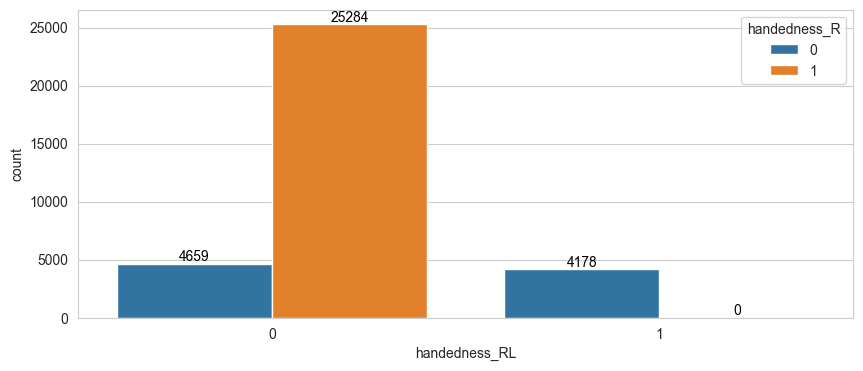

,handedness_RL (%),handedness_RL (%)
0,87.76,0.00
1,12.24,100.00


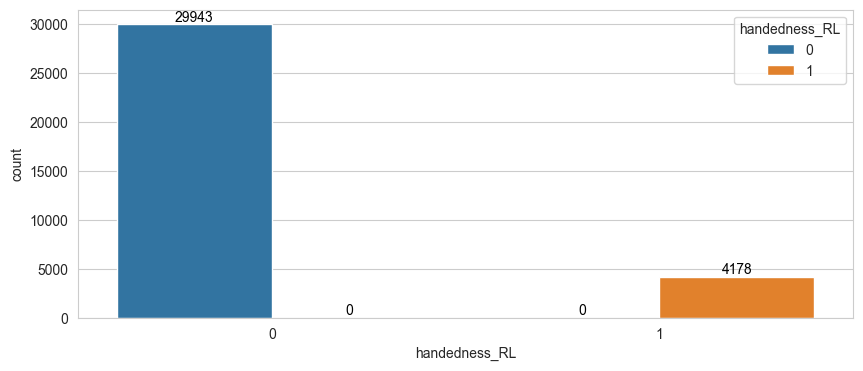

,handedness_RL (%),favorite_won (%)
0,87.76,65.80
1,12.24,67.19


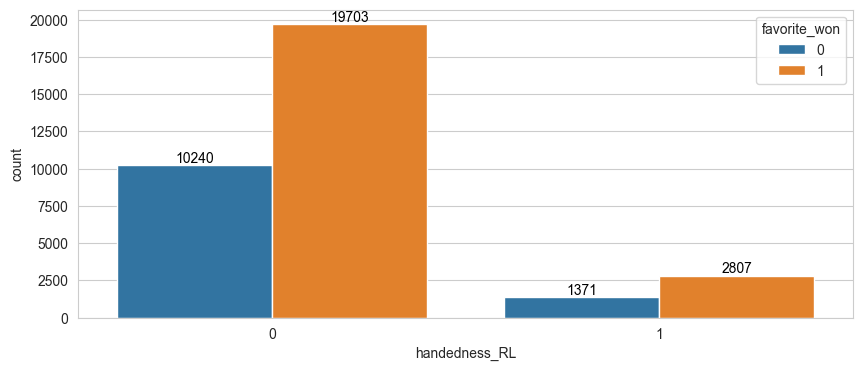

In [13]:
# Countplot for categorical vs. categorical columns
for categorical_col in categorical_cols:
    for target_col in categorical_cols + ['favorite_won']:
        # Write percentages in a dataframe
        df_cat = pd.DataFrame(df[categorical_col].value_counts(normalize=True)*100)
        df_cat[target_col + '_%'] = df.groupby(categorical_col)[target_col].sum()/df[categorical_col].value_counts()*100
        df_cat.columns = [categorical_col+' (%)', target_col+' (%)']
        df_cat.fillna(0, inplace=True)
        df_cat.sort_index(inplace=True)
        display(df_cat)
        # Plot all categorical columns
        plt.figure(figsize=(10,4))
        sns.countplot(x=categorical_col, data=df, hue=target_col)
        # Write count values on top of bars
        for p in plt.gca().patches:
            plt.gca().text(p.get_x() + p.get_width()/2., p.get_height(), '{:1.0f}'.format(p.get_height()), fontsize=10, color='black', ha='center', va='bottom')
        plt.show()
        